In [24]:
%load_ext autoreload
%autoreload 2
%cd /home/florian/GitRepos/activeCell-ACDC
!ls

import json
import random as rd
import matplotlib.image as mpimg
import cv2
import wandb
import torch
import os
import logging
import pandas as pd
import collections
import matplotlib.pyplot as plt

from detectron2.utils.visualizer import Visualizer
from detectron2.utils.logger import setup_logger
from detectron2.data import MetadataCatalog, DatasetCatalog
from detectron2 import model_zoo
from detectron2.config import get_cfg
from detectron2.modeling import build_model
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
from detectron2.engine import DefaultPredictor
from detectron2.checkpoint import DetectionCheckpointer

from src.globals import *
from utils.visualization.show_image import show_image
from utils.register_datasets import register_datasets, get_dataset_name
from utils.config_builder import get_config
from utils.notebook_utils import *


from src.test import do_test
from src.active_learning.al_trainer import *
from src.active_learning.mc_dropout_sampler import *
from src.active_learning.tta_sampler import *


logger = setup_logger(output="./log/main.log",name="null_logger") 
logger.addHandler(logging.NullHandler())
logging.getLogger('detectron2').setLevel(logging.WARNING)
logging.getLogger('detectron2').addHandler(logging.NullHandler())

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
/home/florian/GitRepos/activeCell-ACDC
ac_acdc_env					output
acdc_large_cls_test_slim_coco_format.json	pipeline_configs
acdc_large_cls_test_slim_coco_format.json.lock	README.md
al_output					requirements.txt
data						shell_scripts
experiments					src
local						utils
log						wandb
notebooks


## Initialization

In [25]:
dataset = ACDC_LARGE_CLS
config_name = "final_random_al"

model_path = "/home/florian/GitRepos/activeCell-ACDC/al_output/classes_acdc_large_al/random"


In [26]:
register_datasets()
train_data = DatasetCatalog.get(get_dataset_name(
    dataset, DATASETS_DSPLITS[dataset][0]
))

test_data = DatasetCatalog.get(get_dataset_name(
    dataset, DATASETS_DSPLITS[dataset][1]
))

registering acdc_large_cls dataset
registering chlamy_dataset dataset


In [27]:
wandb.init(
    project="activeCell-ACDC",
    name="",
    sync_tensorboard=True,
    mode="disabled",
)

In [28]:
default_cfg = get_config(config_name)
cfg = default_cfg
cfg.OUTPUT_DIR = "./al_output/final_random_al"
cfg.AL.OBJECT_TO_IMG_AGG = "mean"
#cfg.AL.SAMPLE_EVERY = 60
#cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.4
#cfg.MODEL.ROI_HEADS.NMS_THRESH_TEST = 0.2
#cfg.TEST.DETECTIONS_PER_IMAGE = 50

## Initialize Uncertainty Methods

In [29]:
mc_strategy = MCDropoutSampler(cfg)
tta_strategy = TTASampler(cfg)

mc_model5 = load_model(cfg, os.path.join(model_path, "best_model5.pth"))
mc_model35 = load_model(cfg, os.path.join(model_path, "best_model55.pth"))
mc_model5 = patch_module(mc_model5)
mc_model35 = patch_module(mc_model35)

model5 = load_model(cfg, os.path.join(model_path, "best_model5.pth"))
model35 = load_model(cfg, os.path.join(model_path, "best_model55.pth"))

mc_model3000 = load_model(cfg, os.path.join(model_path, "best_model3000.pth"))
mc_model3000 = patch_module(mc_model3000)

model3000 = load_model(cfg, os.path.join(model_path, "best_model3000.pth"))

rd.seed(1338)
sample_data = rd.sample(test_data, 10)


In [30]:
def val2dicts(val):

    preds = []
    for v in val:
        pred_masks = v["pred_masks"].detach().cpu().numpy()
        pred_classes = v["pred_classes"].detach().cpu().numpy()

        preds.append({
            "pred_masks": pred_masks,
            "pred_classes": pred_classes,
        })

    return preds

def get_uncertainties(im_json, model, query_strategy):

    im = query_strategy.load_image(im_json)
    instance_list = query_strategy.get_samples(model, im, cfg.AL.NUM_MC_SAMPLES)
    combinded_instances = query_strategy.get_combinded_instances(instance_list)


    height, width = im.shape[:2]
    agg_uncertainty = query_strategy.get_uncertainty(combinded_instances, cfg.AL.NUM_MC_SAMPLES, height, width, mode=cfg.AL.OBJECT_TO_IMG_AGG)

    
    uncertainties = []

    for key, val in combinded_instances.items():

        val_len = torch.tensor(len(val)).to("cuda")

        if query_strategy.cfg.MODEL.ROI_HEADS.NUM_CLASSES > 1:
            u_sem = query_strategy.get_semantic_certainty(val, device = "cuda").detach().cpu().numpy()
        else:
            u_sem = 0
        u_mask = query_strategy.get_mask_certainty(val, height, width, val_len, device="cuda").detach().cpu().numpy()
        u_box = query_strategy.get_box_certainty(val, val_len, device="cuda").detach().cpu().numpy()
        u_det = query_strategy.get_detection_certainty(cfg.AL.NUM_MC_SAMPLES, val_len, device="cuda").detach().cpu().numpy()
        
        

        cpu_val = val2dicts(val)

        uncertainties.append({
            "val": cpu_val,
            "u_sem": u_sem,
            "u_mask": u_mask,
            "u_box": u_box,
            "u_det": u_det,

        })


    
    return uncertainties, agg_uncertainty





    

###################################################################################################################################
acdc_data2_kurt_306-3_20_20201105_pos_3_122 0.13701282


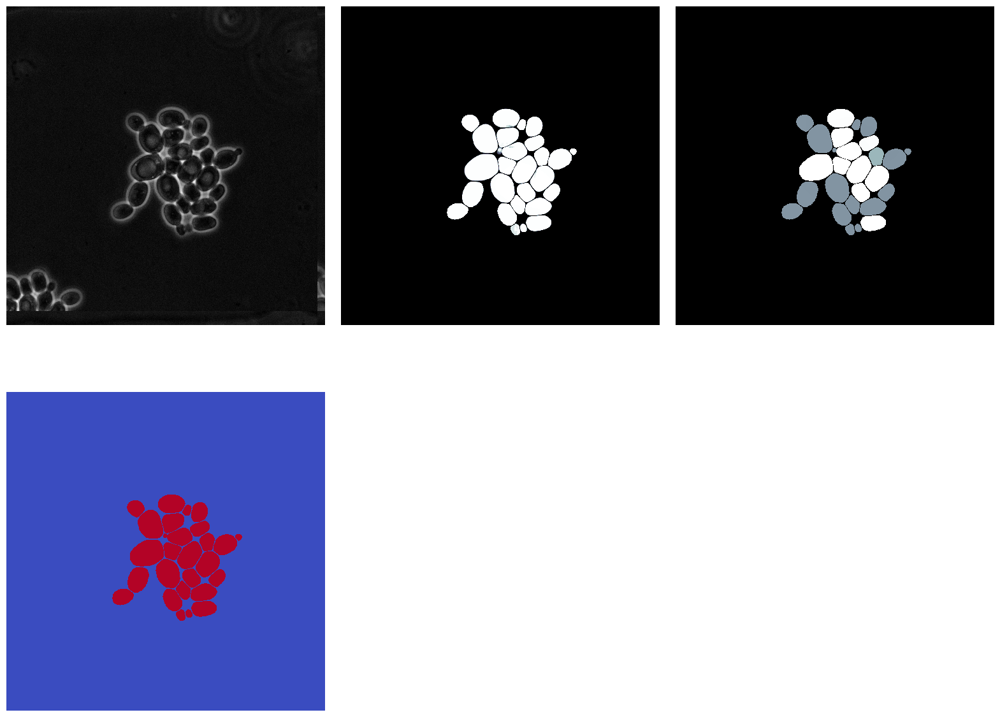

In [65]:

def show_uncertainties(im_json, model, query_strategy):
    
    uncertainties, agg_uncertainty = get_uncertainties(im_json, model, query_strategy)
    print(im_json["image_id"], agg_uncertainty)

    class_uncertainty = np.max(np.stack([(np.mean(np.stack([val["pred_masks"] for val in uncertainty["val"]]), axis=0)> 0.5) * (1 - uncertainty["u_sem"] / 2) for uncertainty in uncertainties]), axis = 0)
    det_uncertainty = np.max(np.stack([(np.mean(np.stack([val["pred_masks"] for val in uncertainty["val"]]), axis=0)> 0.5) * uncertainty["u_det"] for uncertainty in uncertainties]), axis = 0)

    det_uncertainty = np.ma.masked_where(det_uncertainty < 0.05, det_uncertainty)
    
    total_pred_mask = np.max(np.stack([np.mean(np.stack([val["pred_masks"] for val in uncertainty["val"]]), axis=0) for uncertainty in uncertainties]), axis = 0)


    im = load_image(im_json)
    show_image([im,total_pred_mask, class_uncertainty,det_uncertainty], colormap="coolwarm")
    
    return
    for uncertainty in uncertainties:

        if uncertainty["u_det"] < 1 or uncertainty["u_mask"] < 0.9 or uncertainty["u_sem"] < 0.6:
            print("number of detections", len(uncertainty["val"]), "u_sem", uncertainty["u_sem"], "u_mask", uncertainty["u_mask"], "u_box", uncertainty["u_box"], "u_det", uncertainty["u_det"])
            if query_strategy.cfg.MODEL.ROI_HEADS.NUM_CLASSES > 1:
                print(pd.Series([val["pred_classes"] for val in uncertainty["val"]]).value_counts())
            mask = np.mean(np.stack([val["pred_masks"] for val in uncertainty["val"]]), axis=0)
            print(np.sum(mask > 0))
            show_image([mask, total_pred_mask + mask], normalize=False)


#mc_strategy
#tta_strategy
samples = ['acdc_data3_Yagya_SCD_WT_pos_4_62',
 'acdc_data2_kurt_306-3_20_20201105_pos_3_122',
 'acdc_data2_kurt_306-3_20_20201105_pos_3_142',
 'acdc_data2_kurt_306-3_20_20201105_pos_3_162',
 'acdc_data2_kurt_306-3_20_20201105_pos_3_182']
for im_json in train_data:

    if im_json["image_id"] in samples:

        print("###################################################################################################################################")
        #print("tta_model5")
        #show_uncertainties(im_json, model3000, tta_strategy)
        #print("mc_model5")
        show_uncertainties(im_json, mc_model3000, mc_strategy)
        break

    #show_uncertainties(im_json, mc_model3000, tta_strategy)

    #print("tta_model35")
    #show_uncertainties(im_json, model35, tta_strategy)    
    #print("mc_model35")
    #show_uncertainties(im_json, mc_model35, mc_strategy)

In [9]:
id_pool = [im_json["image_id"] for im_json in train_data]


In [10]:
samples = tta_strategy.sample(cfg, id_pool, model35)

loading custom model
running tta sampling...


100%|██████████| 296/296 [21:07<00:00,  4.28s/it]

finished with tta sampling.
min uncertainty:  0.0 	 mean uncertainty:  1.164189199136721 	 max uncertainty:  13.92500114440918
worst examples: ['acdc_data3_Yagya_SCD_WT_pos_4_62', 'acdc_data2_kurt_306-3_20_20201105_pos_3_122', 'acdc_data2_kurt_306-3_20_20201105_pos_3_142', 'acdc_data2_kurt_306-3_20_20201105_pos_3_162', 'acdc_data2_kurt_306-3_20_20201105_pos_3_182']


In [11]:
samples

['acdc_data3_Yagya_SCD_WT_pos_4_62',
 'acdc_data2_kurt_306-3_20_20201105_pos_3_122',
 'acdc_data2_kurt_306-3_20_20201105_pos_3_142',
 'acdc_data2_kurt_306-3_20_20201105_pos_3_162',
 'acdc_data2_kurt_306-3_20_20201105_pos_3_182']

acdc_data3_Yagya_SCD_WT_pos_4_62 9.125


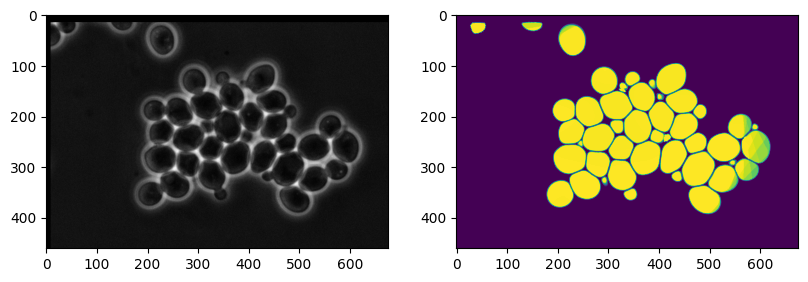

number of detections 30 u_sem 0 u_mask 0.88820434 u_box 0.0 u_det 0.75
3000


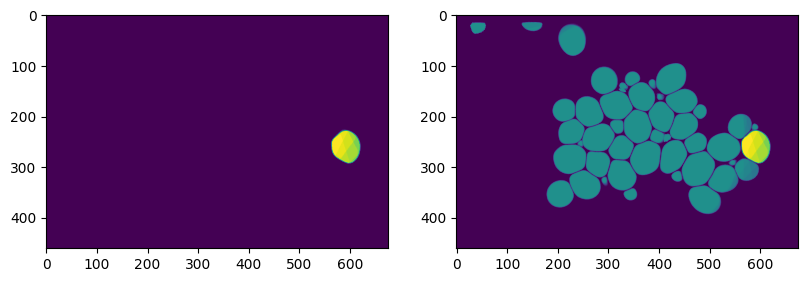

number of detections 21 u_sem 0 u_mask 0.8008728 u_box 0.0 u_det 0.525
173


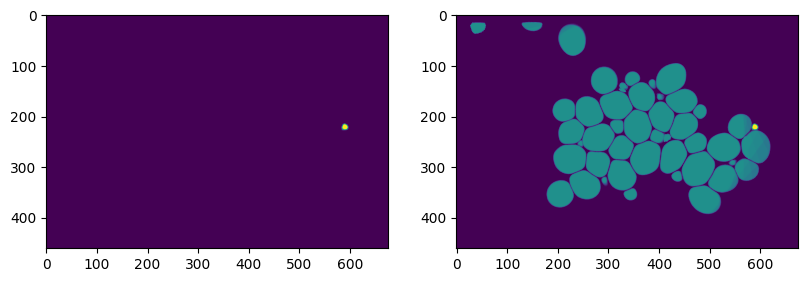

number of detections 33 u_sem 0 u_mask 0.866447 u_box 0.0 u_det 0.825
1656


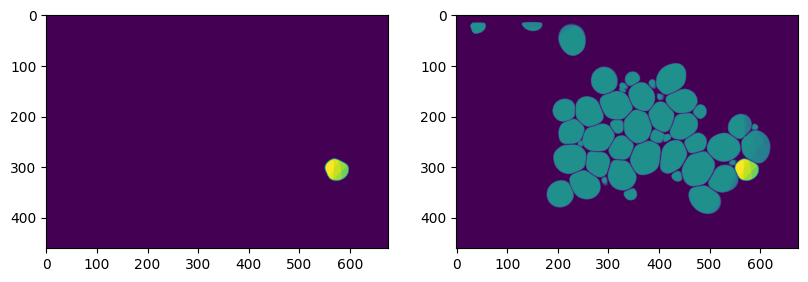

number of detections 39 u_sem 0 u_mask 0.7722346 u_box 0.0 u_det 0.975
134


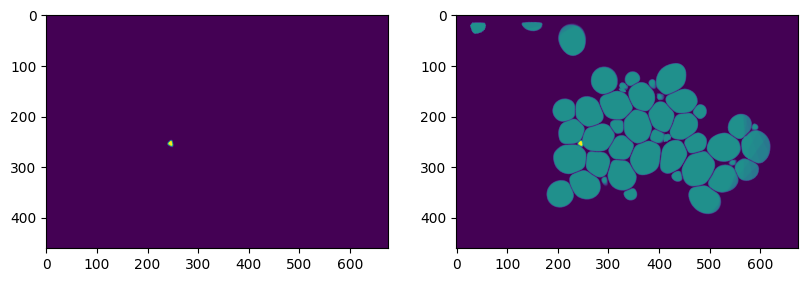

number of detections 39 u_sem 0 u_mask 0.72059464 u_box 0.0 u_det 0.975
222


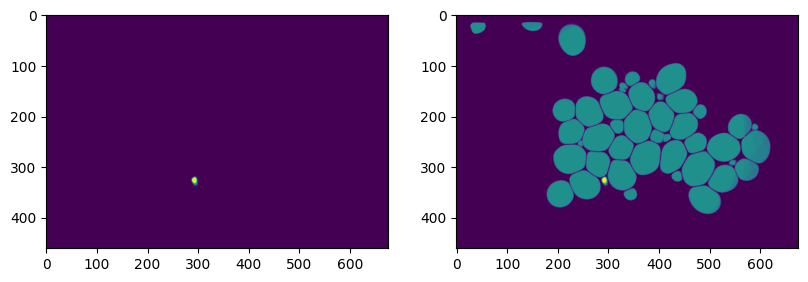

number of detections 15 u_sem 0 u_mask 0.8842505 u_box 0.0 u_det 0.375
624


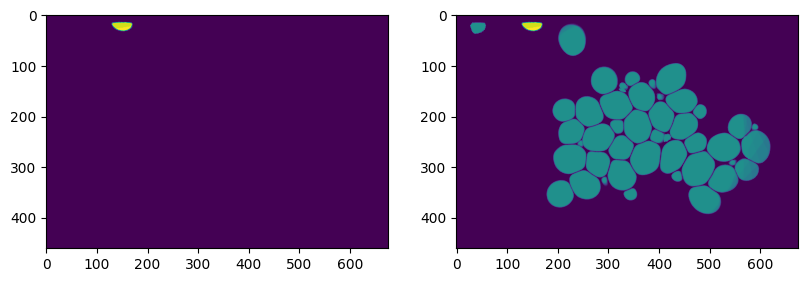

number of detections 2 u_sem 0 u_mask 0.859116 u_box 0.09703345 u_det 0.05
181


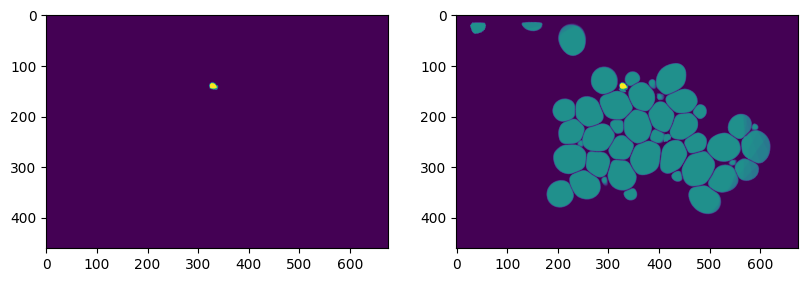

number of detections 1 u_sem 0 u_mask 1.0 u_box 1.0 u_det 0.025
521


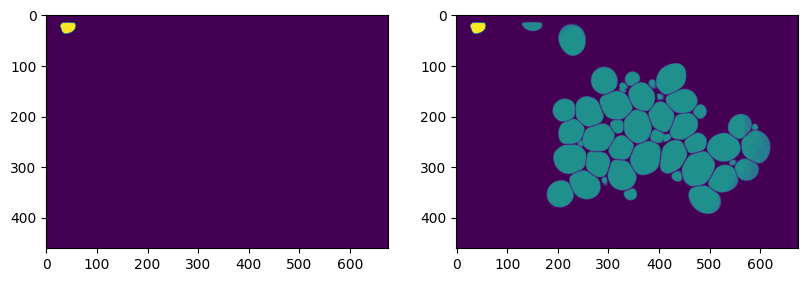

number of detections 5 u_sem 0 u_mask 0.7263786 u_box 0.0 u_det 0.125
172


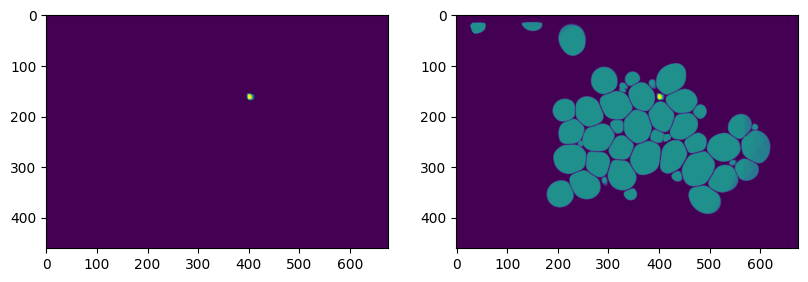

number of detections 5 u_sem 0 u_mask 0.77281815 u_box 0.0 u_det 0.125
161


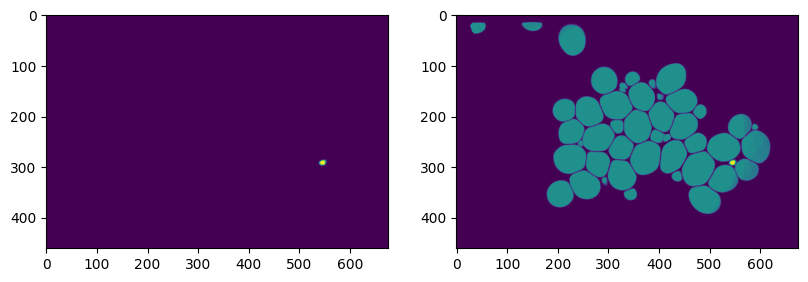

number of detections 1 u_sem 0 u_mask 1.0 u_box 1.0 u_det 0.025
69


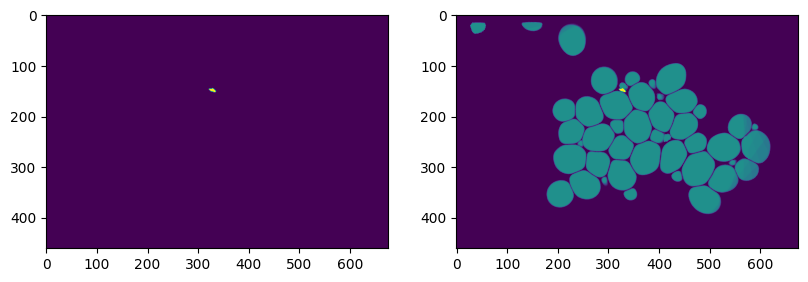

number of detections 1 u_sem 0 u_mask 1.0 u_box 1.0 u_det 0.025
391


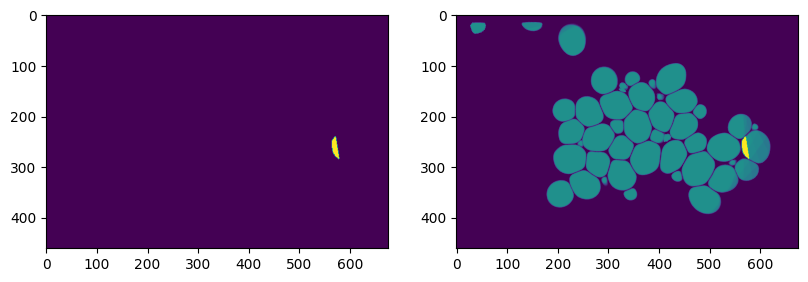

number of detections 2 u_sem 0 u_mask 0.7511848 u_box 0.0 u_det 0.05
211


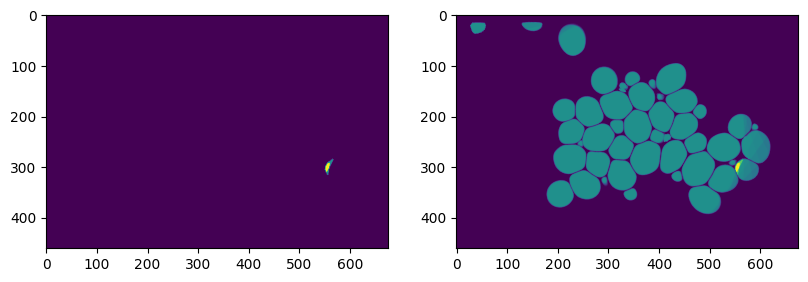

number of detections 1 u_sem 0 u_mask 1.0 u_box 1.0 u_det 0.025
163


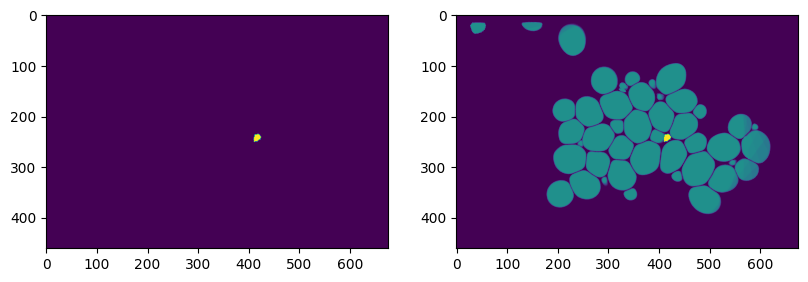

acdc_data2_kurt_306-3_20_20201105_pos_3_122 9.025


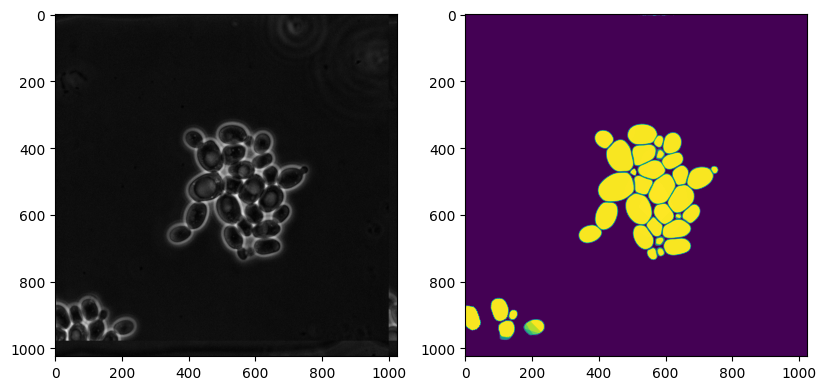

number of detections 34 u_sem 0 u_mask 0.8180794 u_box 0.0 u_det 0.85
709


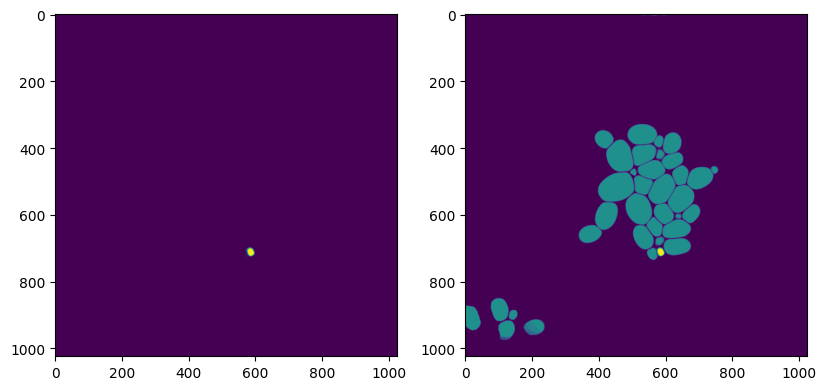

number of detections 1 u_sem 0 u_mask 1.0 u_box 1.0 u_det 0.025
2620


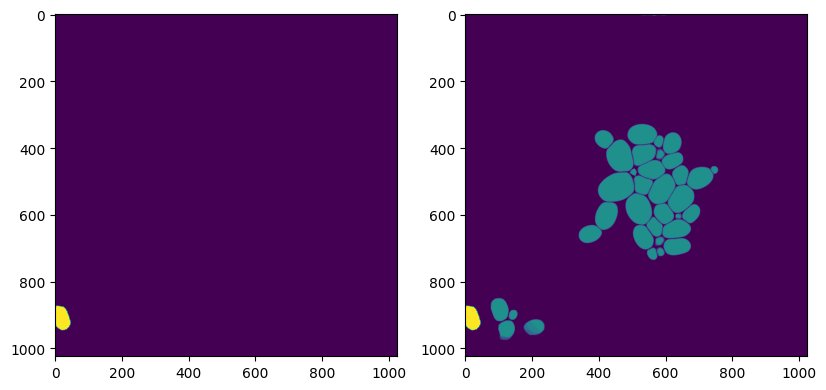

number of detections 13 u_sem 0 u_mask 0.78082025 u_box 0.0 u_det 0.325
796


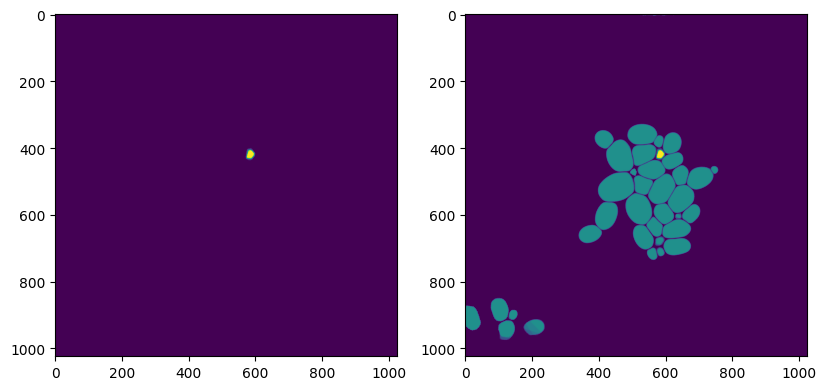

number of detections 7 u_sem 0 u_mask 0.7698861 u_box 0.0 u_det 0.175
667


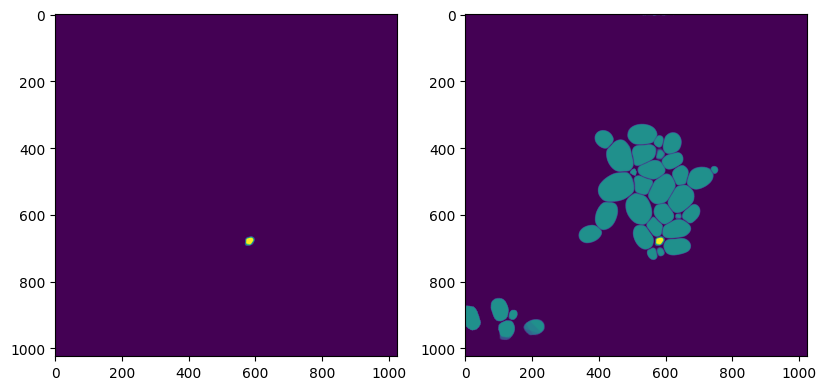

number of detections 9 u_sem 0 u_mask 0.8471398 u_box 0.0 u_det 0.225
2443


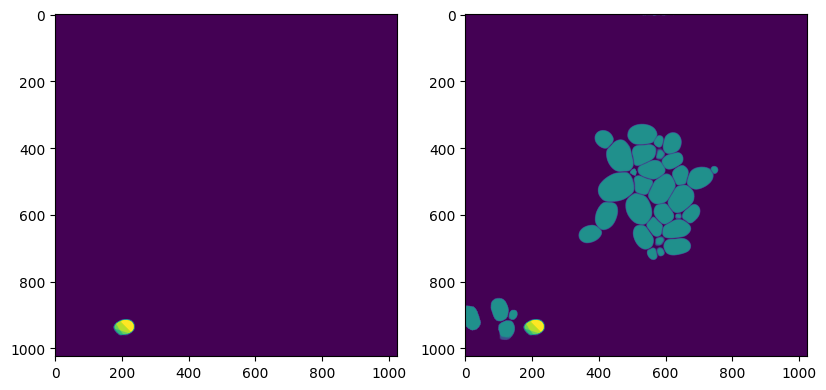

number of detections 3 u_sem 0 u_mask 0.75631315 u_box 0.0 u_det 0.075
264


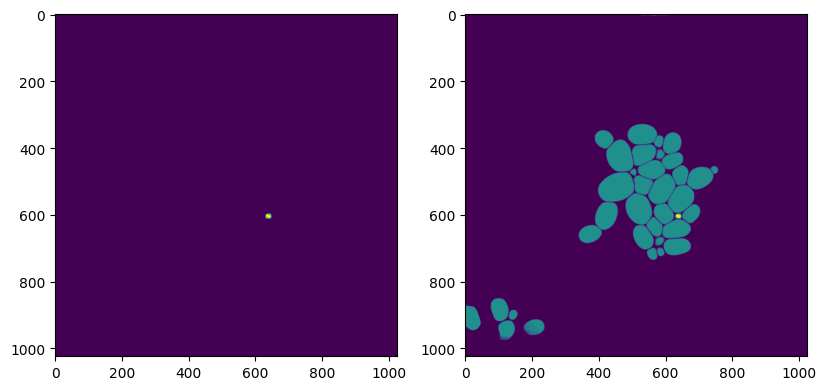

number of detections 1 u_sem 0 u_mask 1.0 u_box 1.0 u_det 0.025
461


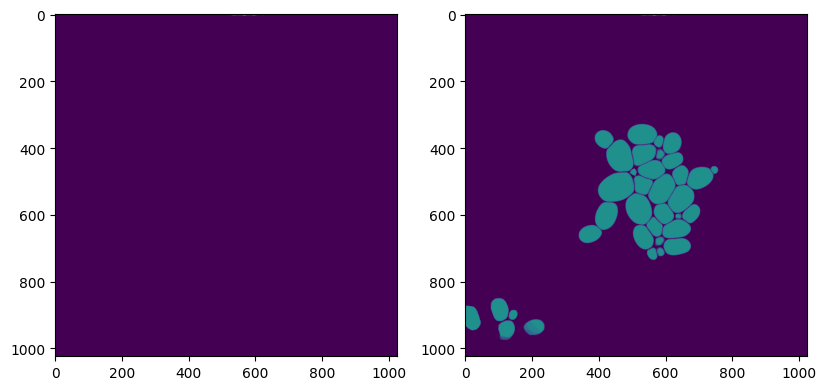

number of detections 2 u_sem 0 u_mask 0.9419935 u_box 0.0 u_det 0.05
612


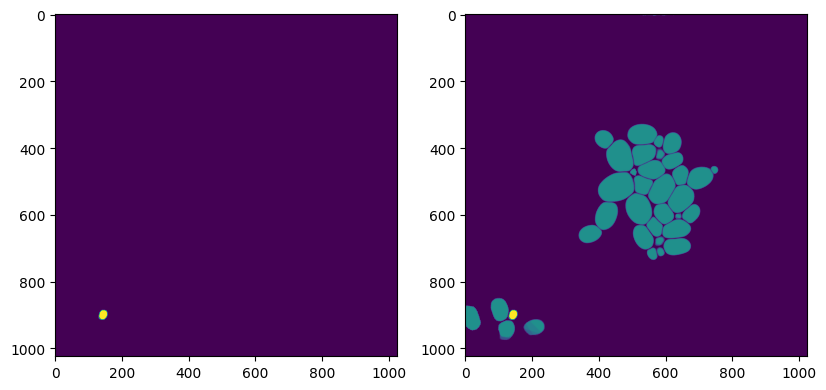

number of detections 4 u_sem 0 u_mask 0.95640326 u_box 0.0 u_det 0.1
2936


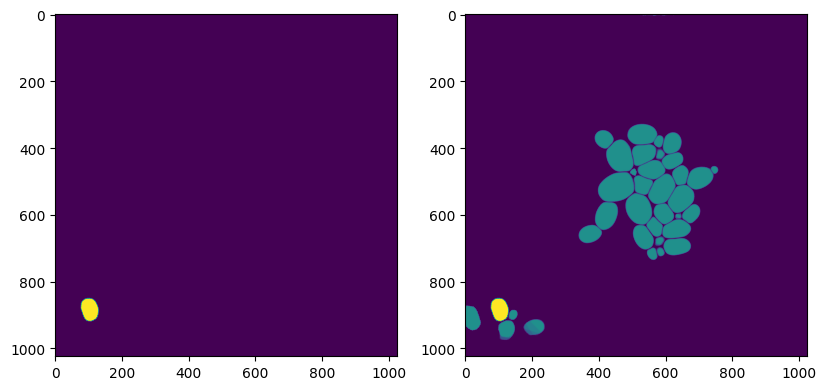

number of detections 4 u_sem 0 u_mask 0.89173394 u_box 0.0 u_det 0.1
2353


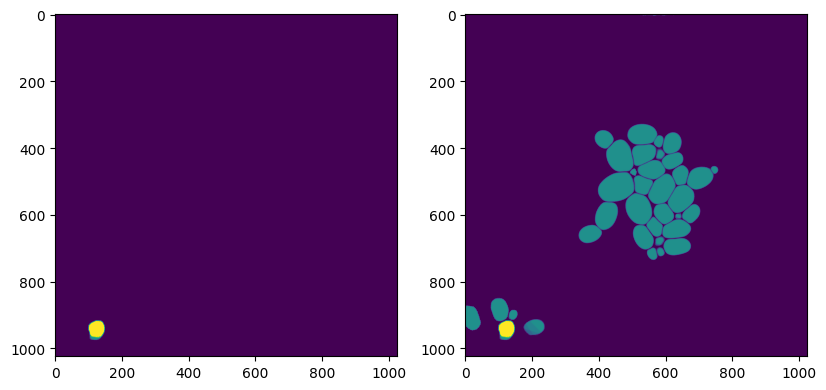

number of detections 1 u_sem 0 u_mask 1.0 u_box 1.0 u_det 0.025
271


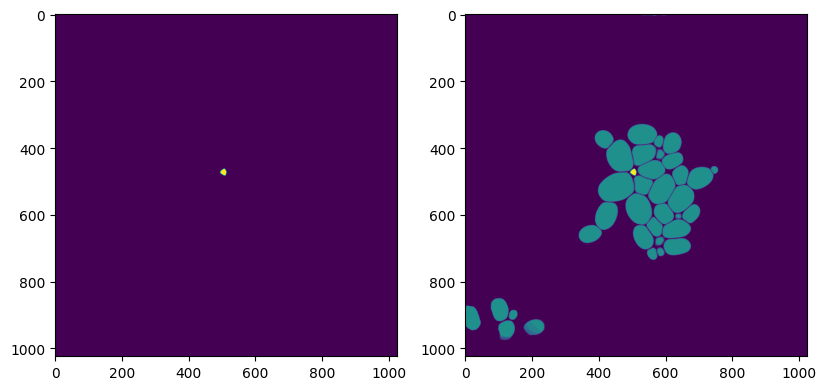

acdc_data2_kurt_306-3_20_20201105_pos_3_142 9.825


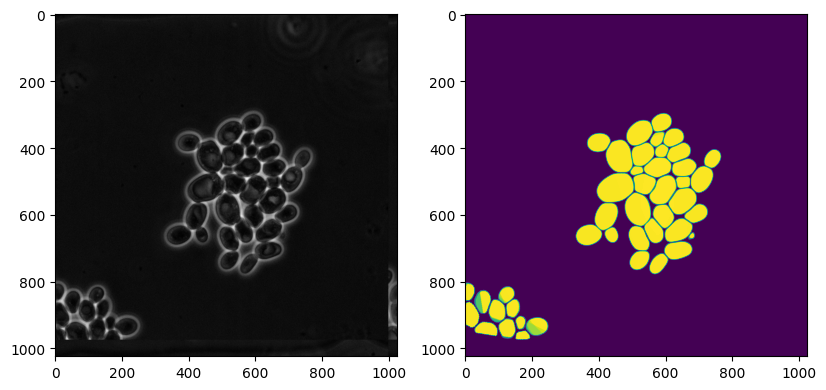

number of detections 17 u_sem 0 u_mask 0.9231664 u_box 0.0 u_det 0.425
1925


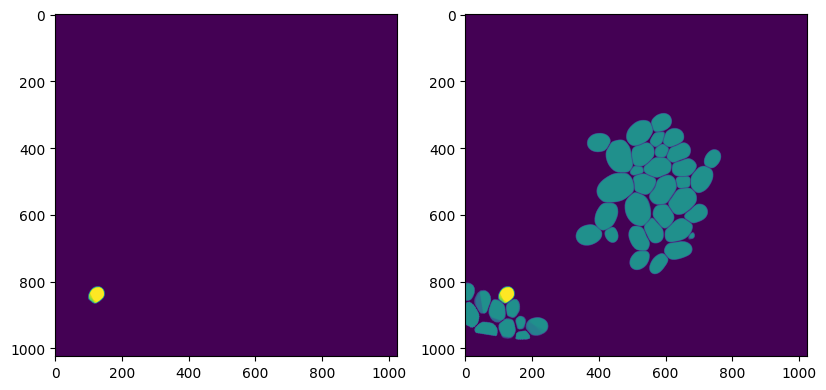

number of detections 15 u_sem 0 u_mask 0.8816632 u_box 0.0 u_det 0.375
3034


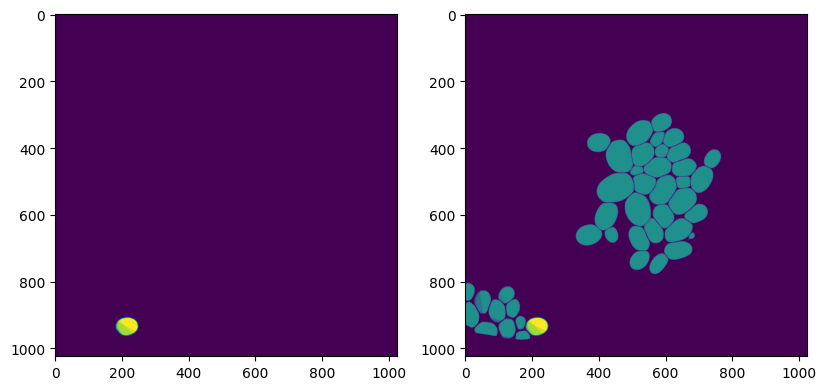

number of detections 20 u_sem 0 u_mask 0.77811795 u_box 0.0 u_det 0.5
364


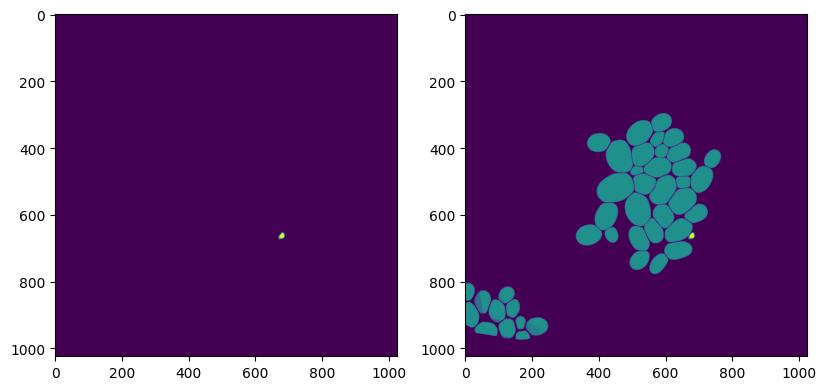

number of detections 3 u_sem 0 u_mask 0.9189937 u_box 0.0 u_det 0.075
1325


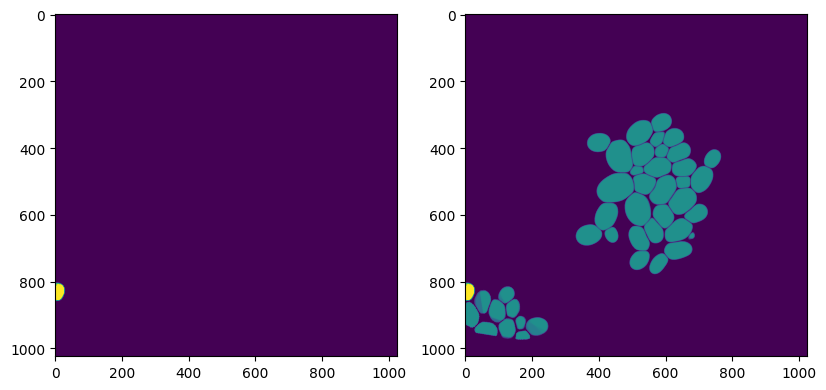

number of detections 2 u_sem 0 u_mask 0.98411214 u_box 0.0 u_det 0.05
2140


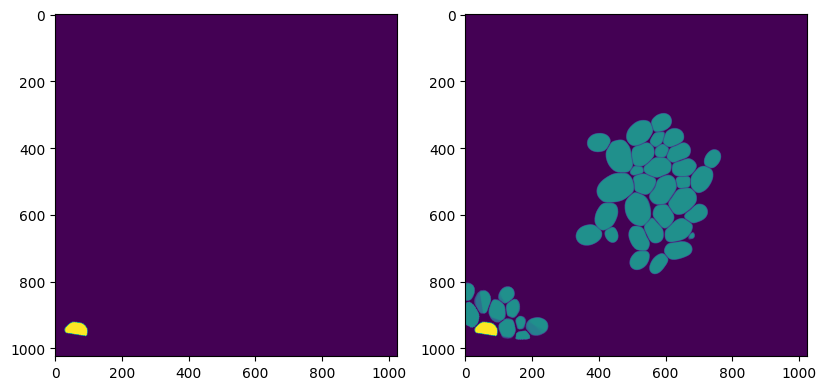

number of detections 1 u_sem 0 u_mask 1.0 u_box 1.0 u_det 0.025
2447


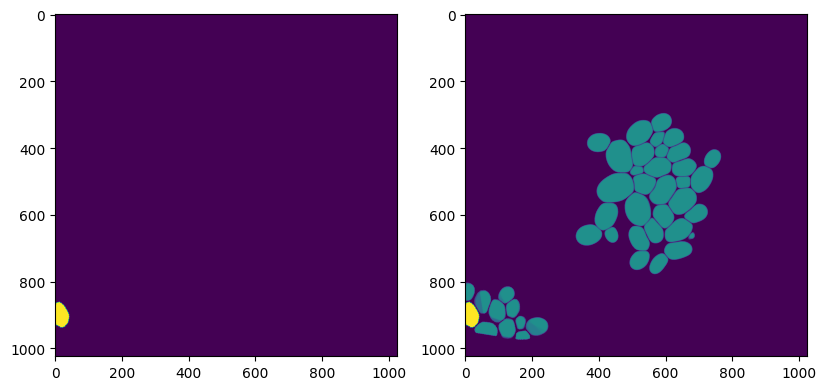

number of detections 5 u_sem 0 u_mask 0.93818474 u_box 0.0 u_det 0.125
2466


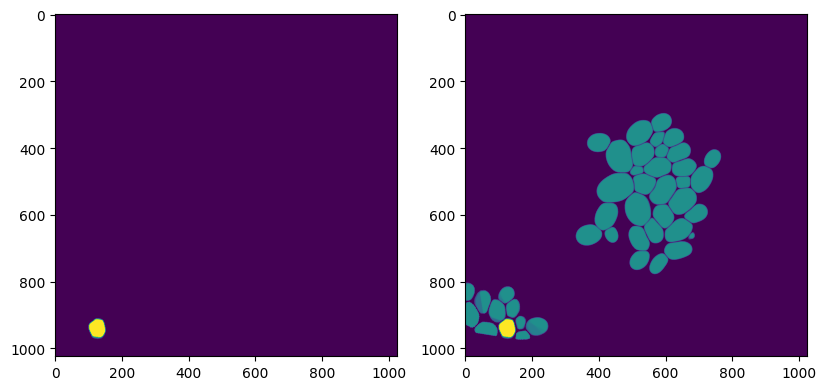

number of detections 4 u_sem 0 u_mask 0.8420046 u_box 0.0 u_det 0.1
2614


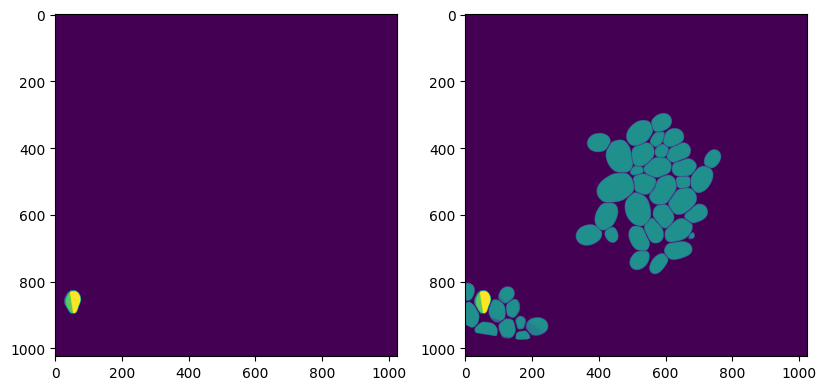

number of detections 8 u_sem 0 u_mask 0.9294914 u_box 0.0 u_det 0.2
1856


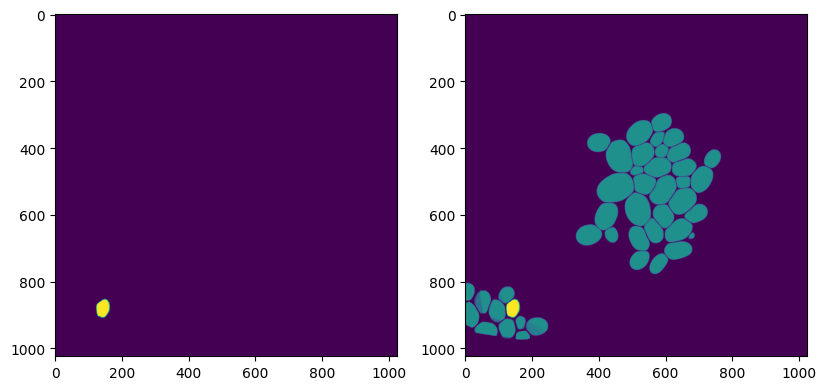

number of detections 6 u_sem 0 u_mask 0.9237358 u_box 0.0 u_det 0.15
2810


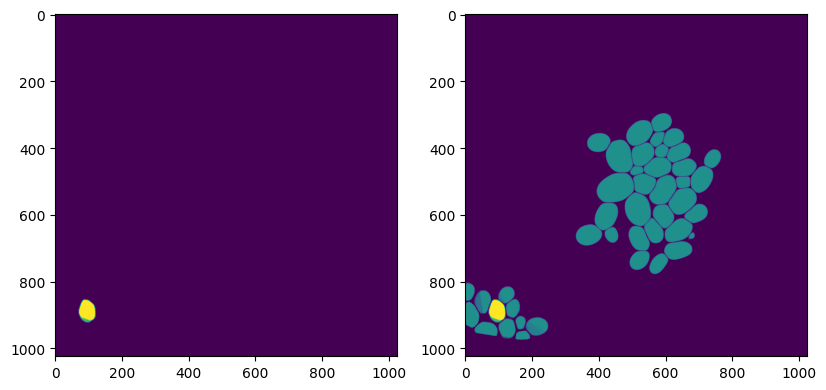

number of detections 5 u_sem 0 u_mask 0.90598947 u_box 0.0 u_det 0.125
1018


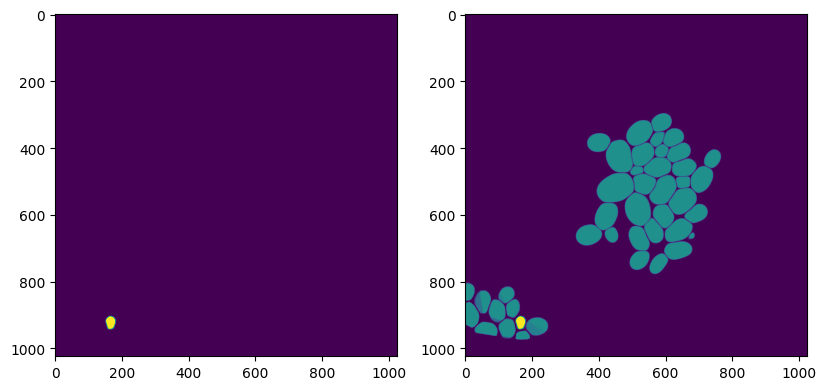

number of detections 1 u_sem 0 u_mask 1.0 u_box 1.0 u_det 0.025
898


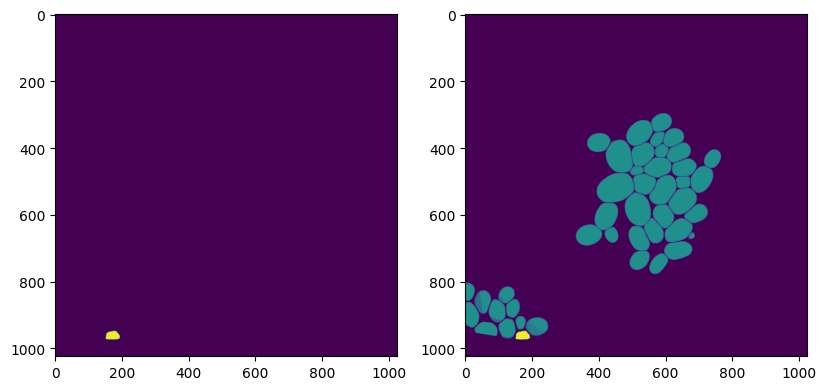

acdc_data2_kurt_306-3_20_20201105_pos_3_162 10.124999


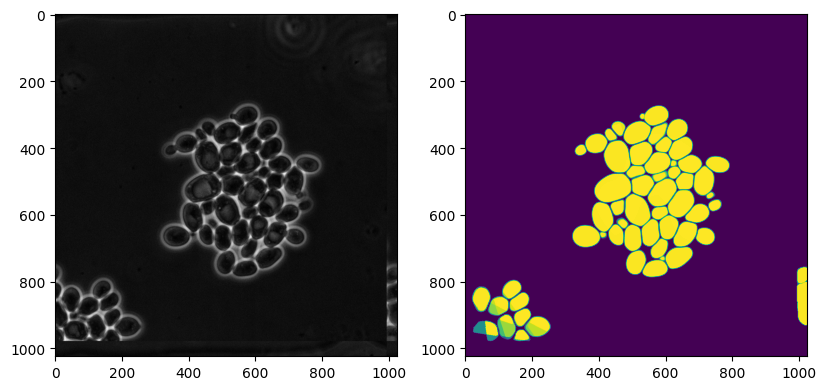

number of detections 20 u_sem 0 u_mask 0.94449633 u_box 0.0 u_det 0.5
2490


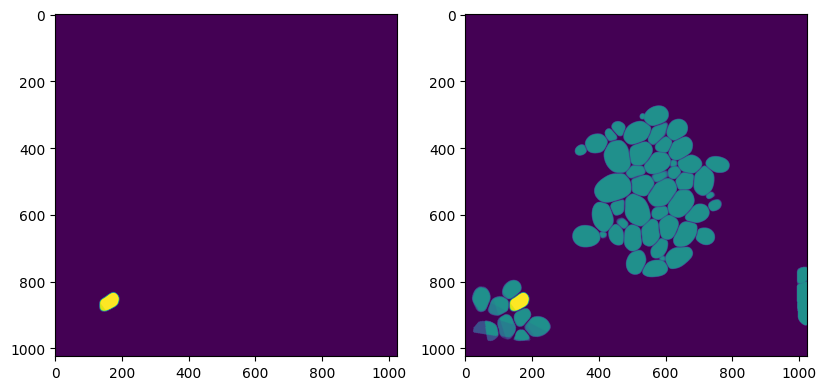

number of detections 24 u_sem 0 u_mask 0.9336417 u_box 0.0 u_det 0.6
2571


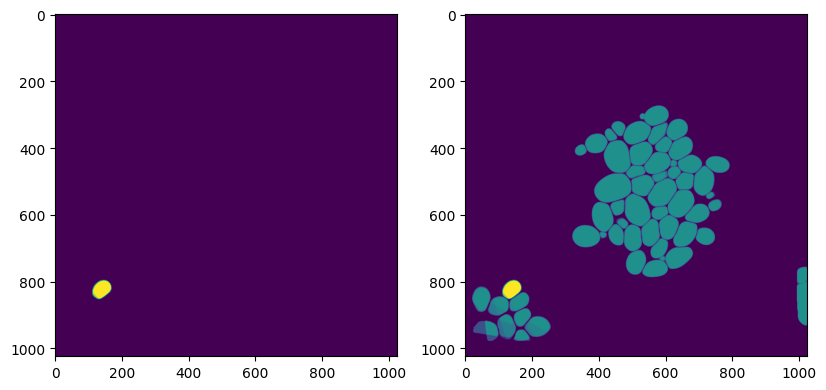

number of detections 31 u_sem 0 u_mask 0.8258139 u_box 0.0 u_det 0.775
971


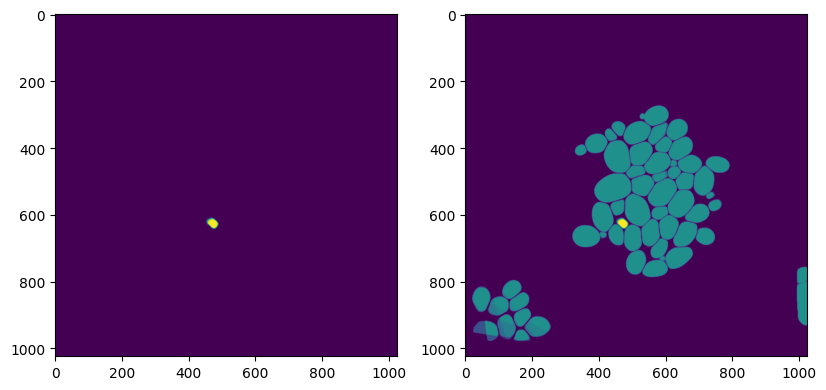

number of detections 17 u_sem 0 u_mask 0.9450948 u_box 0.0 u_det 0.425
2108


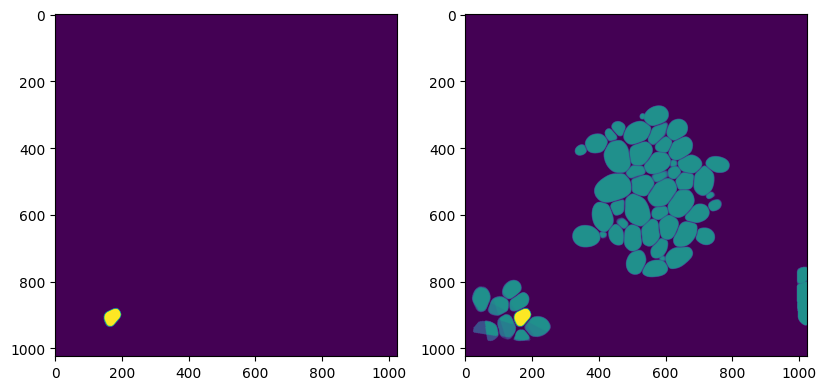

number of detections 39 u_sem 0 u_mask 0.8250267 u_box 0.0 u_det 0.975
520


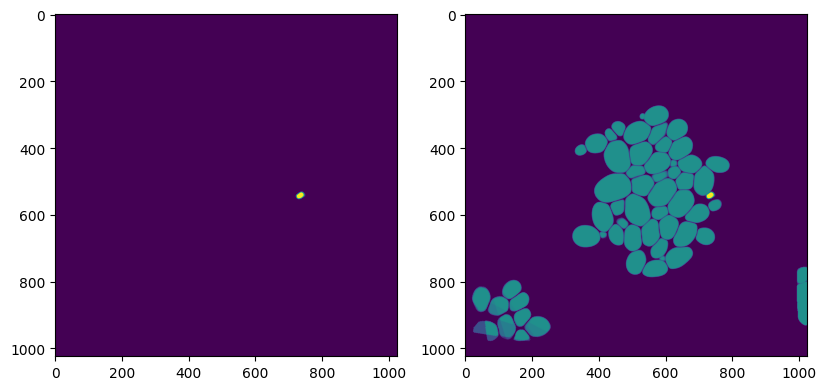

number of detections 37 u_sem 0 u_mask 0.8130859 u_box 0.0 u_det 0.925
452


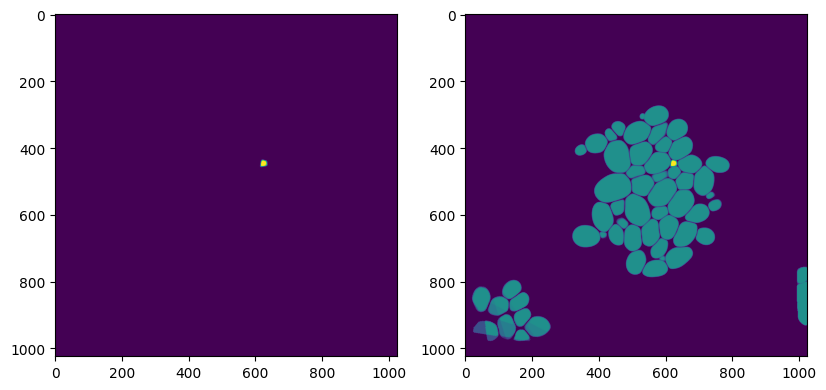

number of detections 39 u_sem 0 u_mask 0.8445331 u_box 0.0 u_det 0.975
286


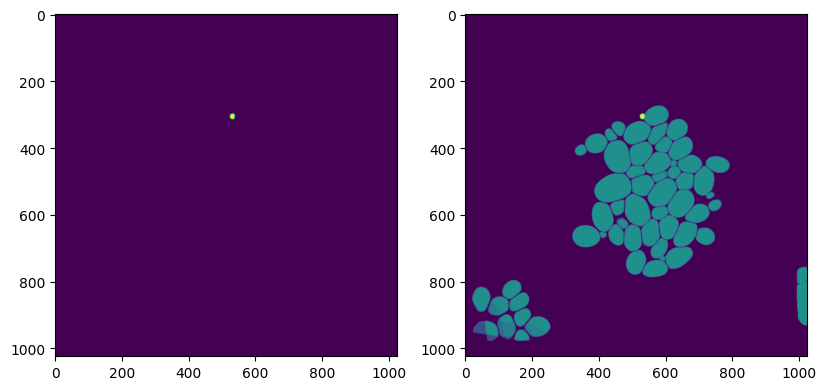

number of detections 22 u_sem 0 u_mask 0.89525515 u_box 0.0 u_det 0.55
3791


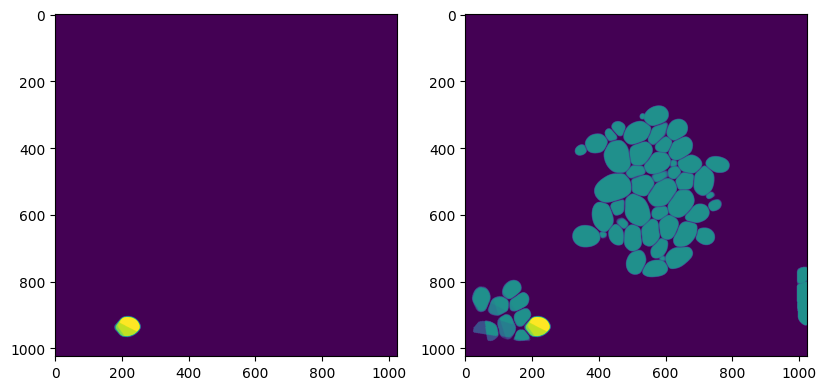

number of detections 2 u_sem 0 u_mask 0.9496012 u_box 0.0 u_det 0.05
1379


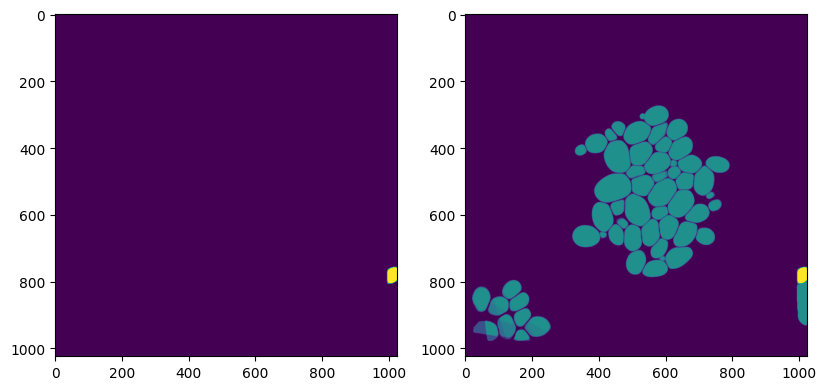

number of detections 12 u_sem 0 u_mask 0.8847659 u_box 0.0 u_det 0.3
2897


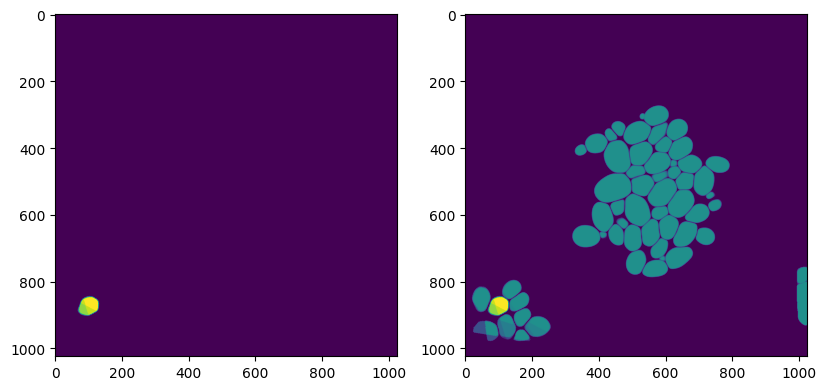

number of detections 2 u_sem 0 u_mask 0.7188971 u_box 0.0 u_det 0.05
2974


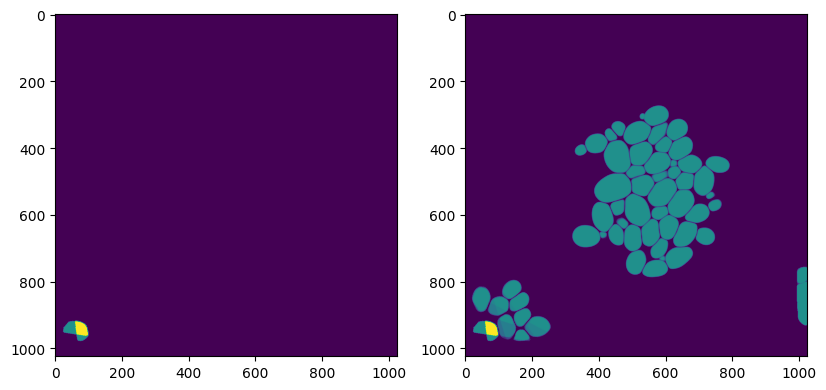

number of detections 7 u_sem 0 u_mask 0.8072849 u_box 0.0 u_det 0.175
3204


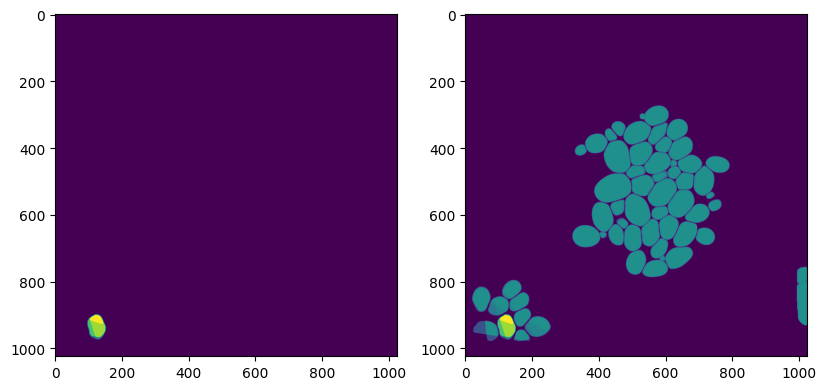

number of detections 5 u_sem 0 u_mask 0.9298056 u_box 0.0 u_det 0.125
3230


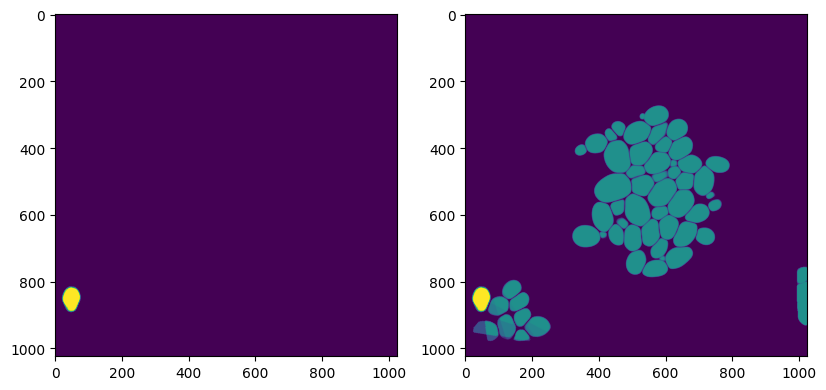

number of detections 12 u_sem 0 u_mask 0.72648287 u_box 0.0 u_det 0.3
306


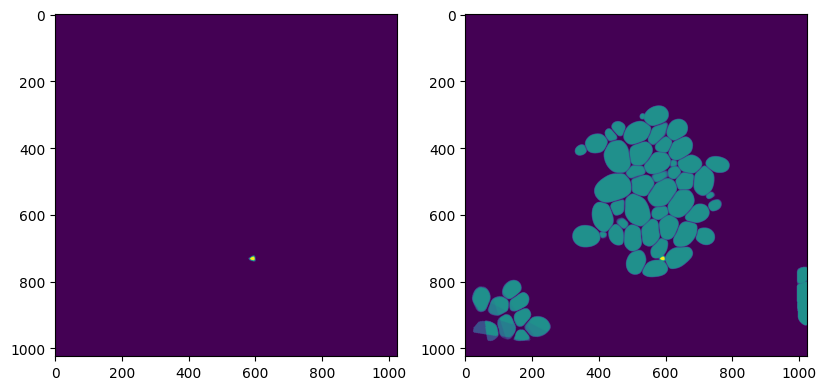

number of detections 4 u_sem 0 u_mask 0.88056207 u_box 0.0 u_det 0.1
1281


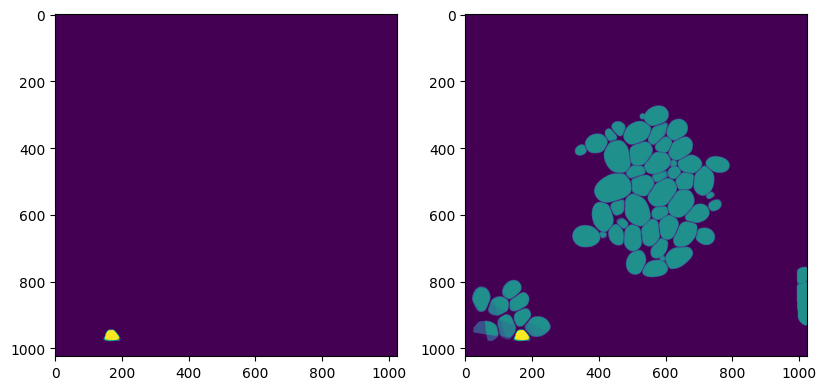

number of detections 1 u_sem 0 u_mask 1.0 u_box 1.0 u_det 0.025
1723


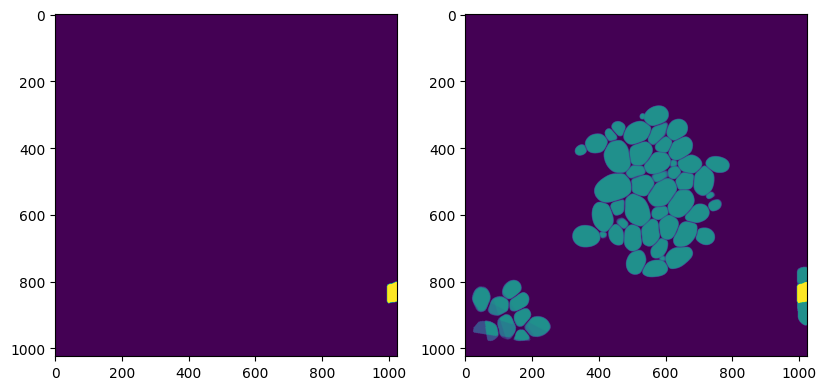

number of detections 1 u_sem 0 u_mask 1.0 u_box 1.0 u_det 0.025
1847


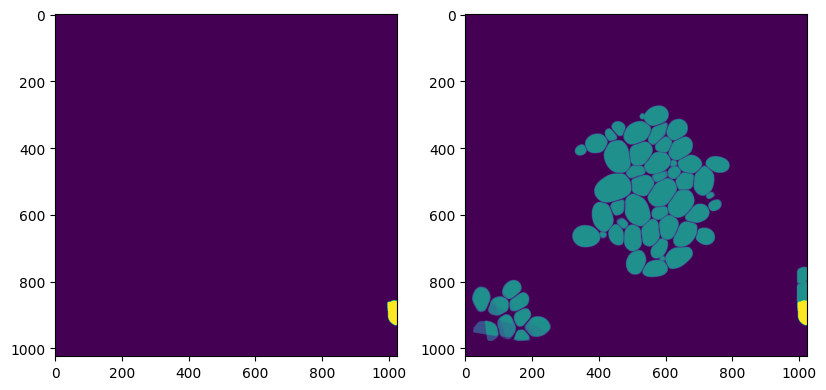

acdc_data2_kurt_306-3_20_20201105_pos_3_182 13.9


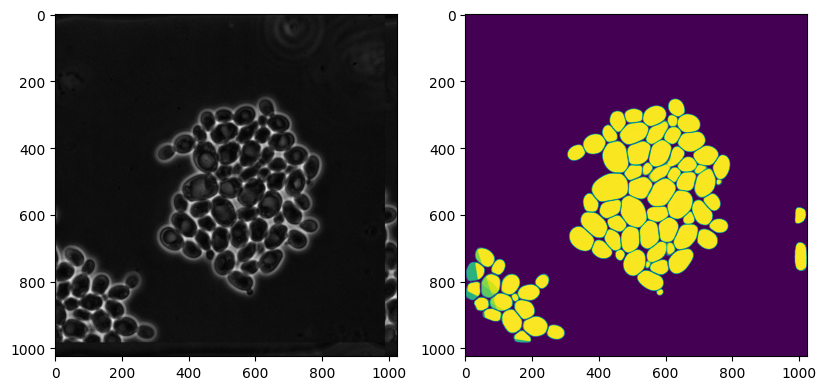

number of detections 19 u_sem 0 u_mask 0.94602555 u_box 0.0 u_det 0.475
2809


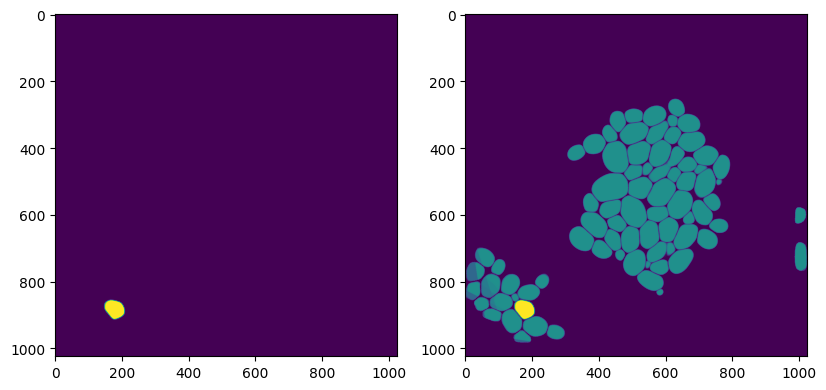

number of detections 26 u_sem 0 u_mask 0.94847214 u_box 0.0 u_det 0.65
2704


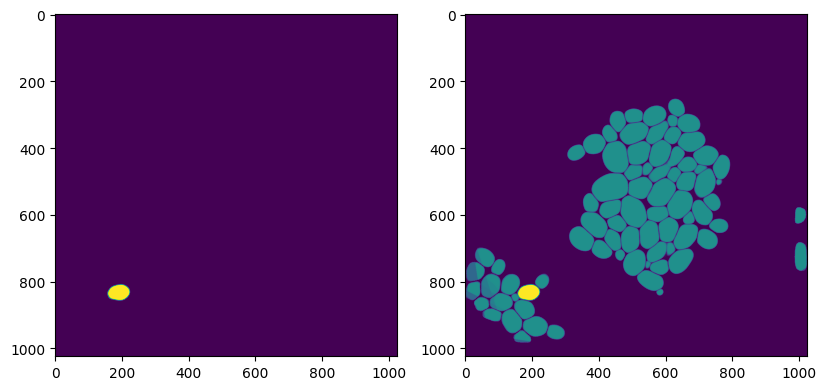

number of detections 39 u_sem 0 u_mask 0.8447067 u_box 0.0 u_det 0.975
1087


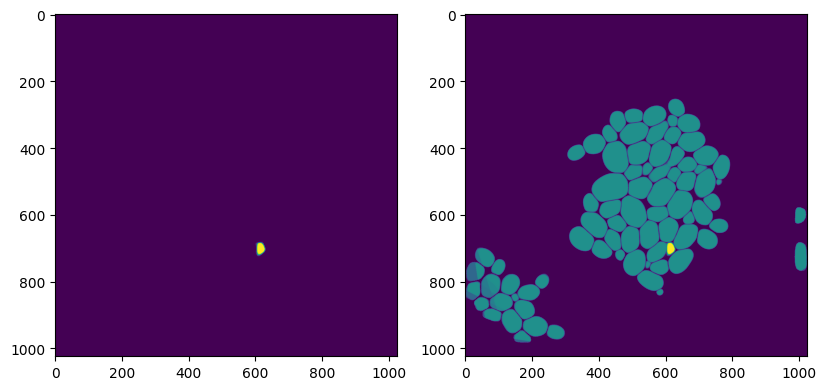

number of detections 20 u_sem 0 u_mask 0.86313134 u_box 0.0 u_det 0.5
459


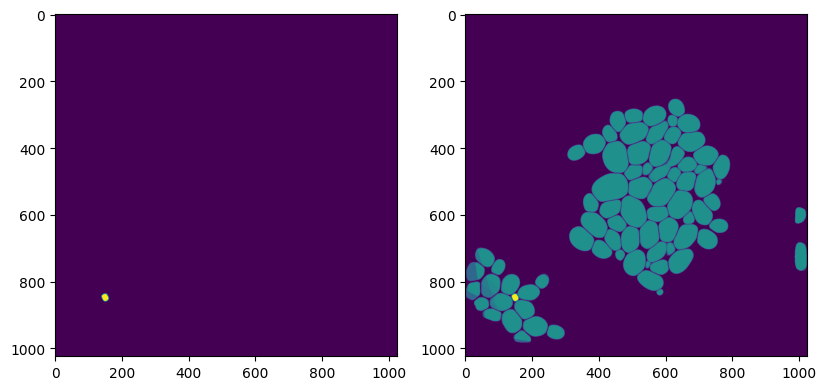

number of detections 27 u_sem 0 u_mask 0.9398342 u_box 0.0 u_det 0.675
2939


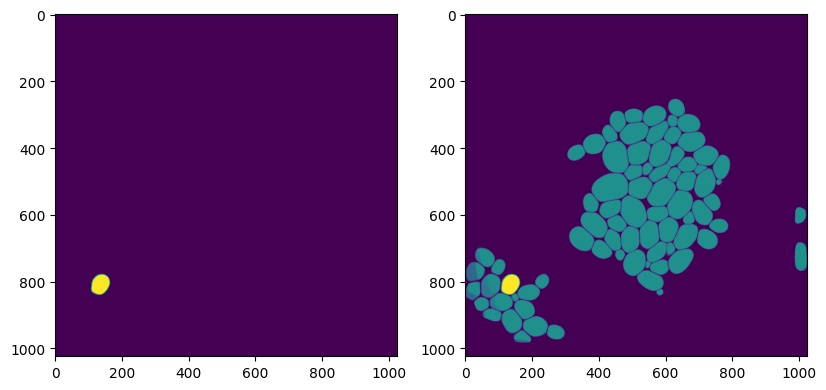

number of detections 15 u_sem 0 u_mask 0.9245041 u_box 0.0 u_det 0.375
2933


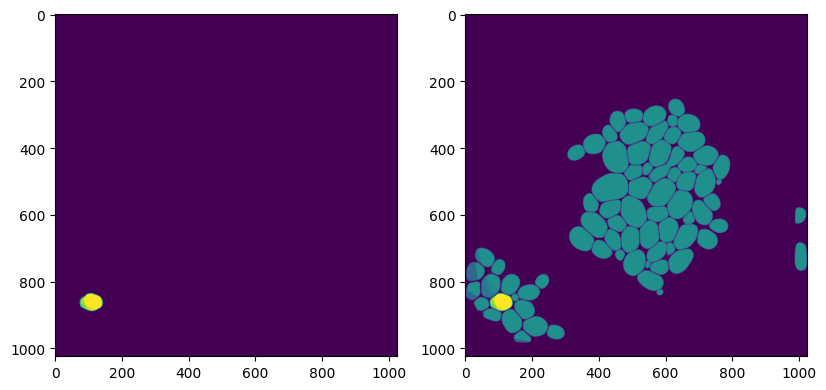

number of detections 10 u_sem 0 u_mask 0.95342684 u_box 0.0 u_det 0.25
3420


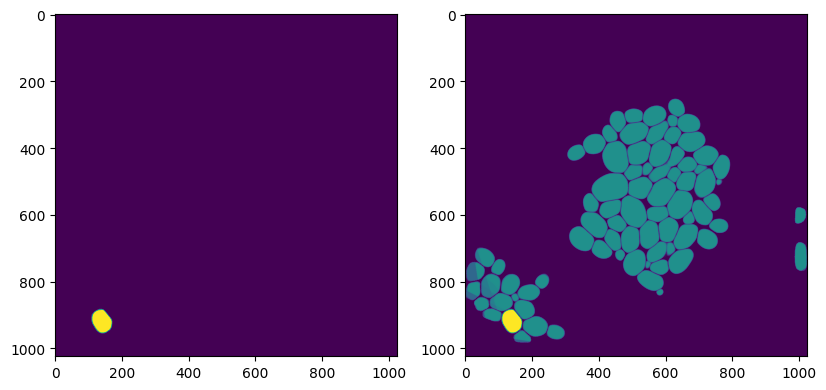

number of detections 16 u_sem 0 u_mask 0.9546522 u_box 0.0 u_det 0.4
3624


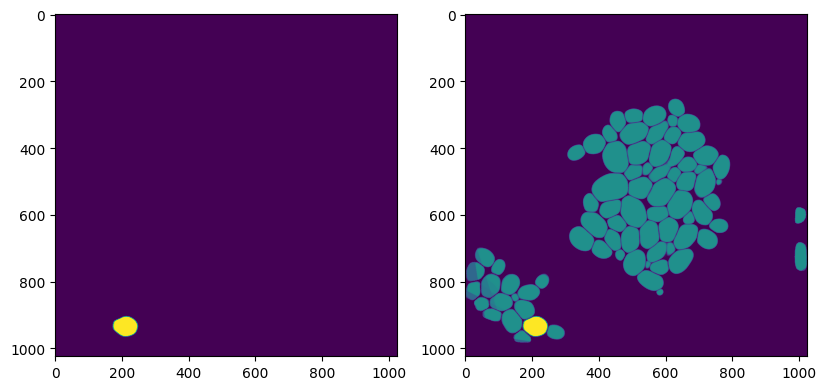

number of detections 19 u_sem 0 u_mask 0.85778123 u_box 0.0 u_det 0.475
3514


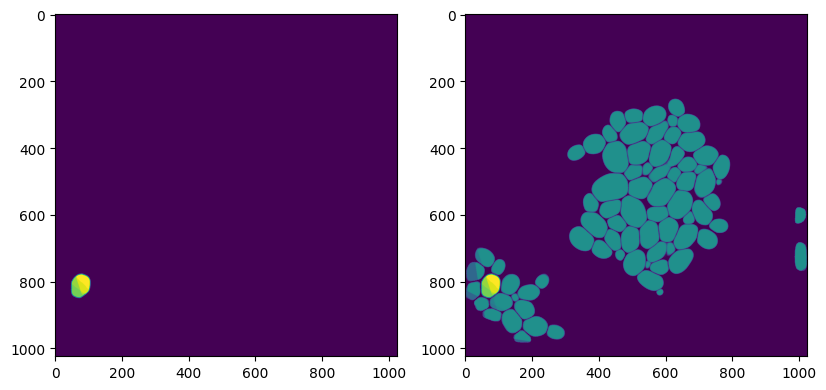

number of detections 21 u_sem 0 u_mask 0.9392799 u_box 0.0 u_det 0.525
1589


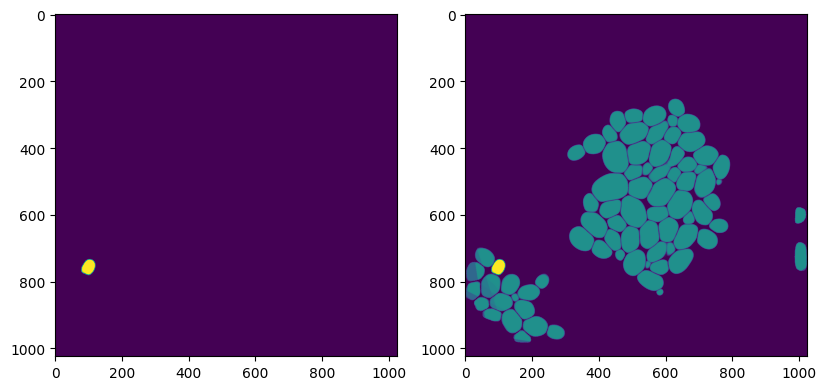

number of detections 38 u_sem 0 u_mask 0.77470195 u_box 0.0 u_det 0.95
356


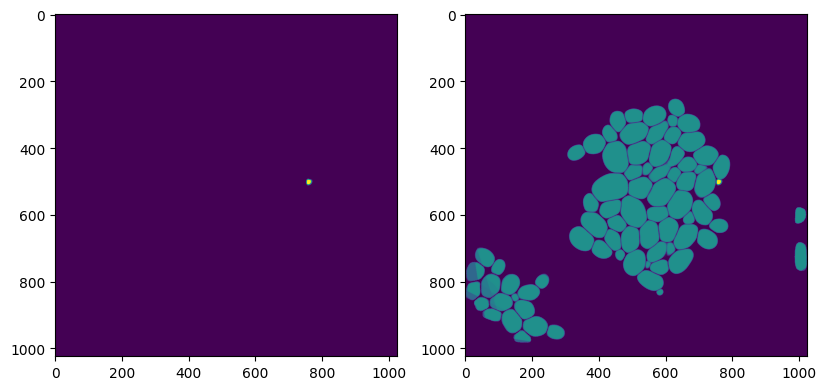

number of detections 2 u_sem 0 u_mask 0.93428224 u_box 0.035139058 u_det 0.05
1651


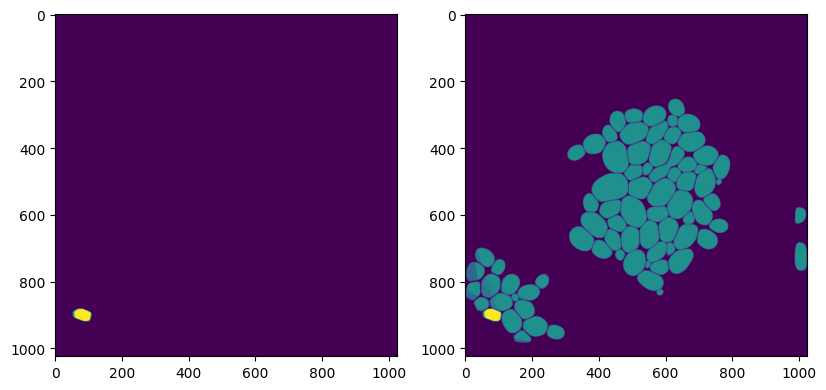

number of detections 3 u_sem 0 u_mask 0.9285879 u_box 0.0 u_det 0.075
1447


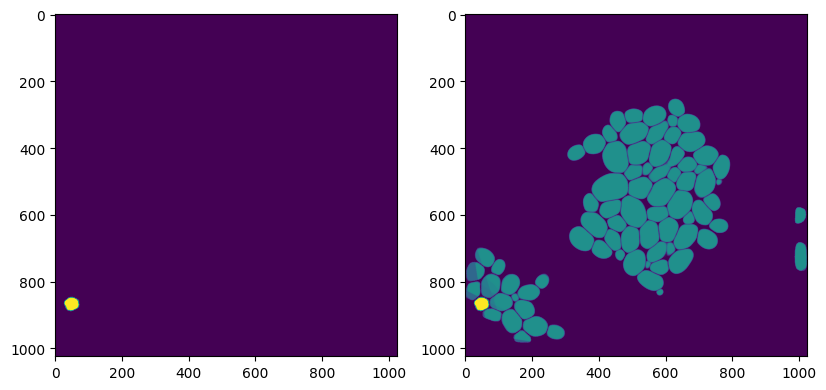

number of detections 23 u_sem 0 u_mask 0.7731569 u_box 0.0 u_det 0.575
377


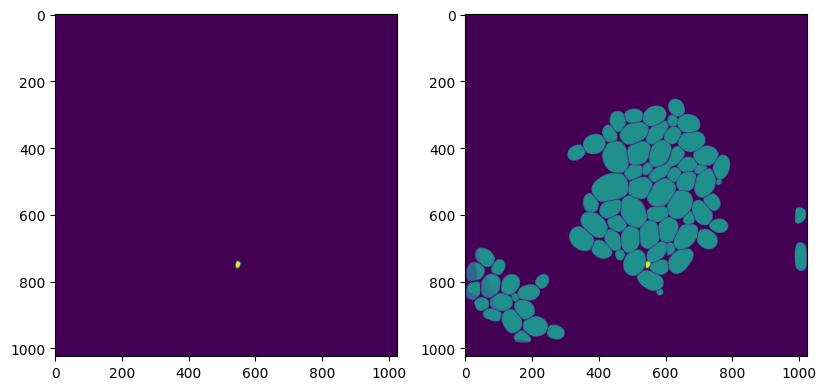

number of detections 6 u_sem 0 u_mask 0.8377002 u_box 0.0 u_det 0.15
2076


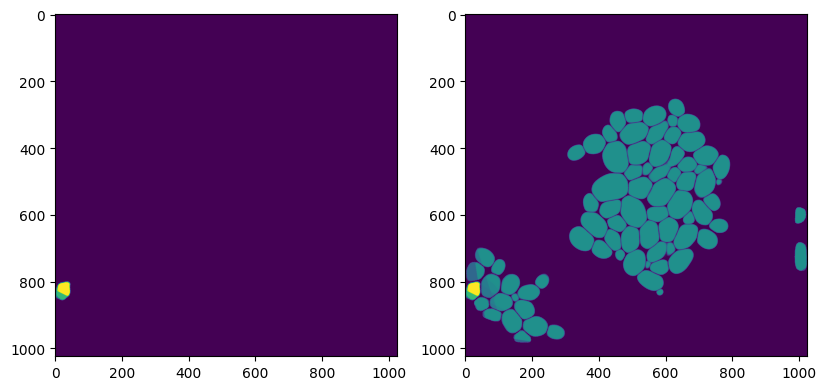

number of detections 12 u_sem 0 u_mask 0.91836005 u_box 0.0 u_det 0.3
2634


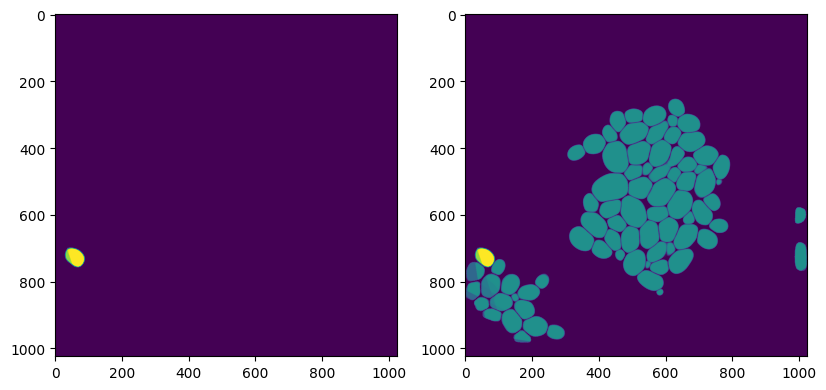

number of detections 3 u_sem 0 u_mask 0.753378 u_box 0.0999943 u_det 0.075
2541


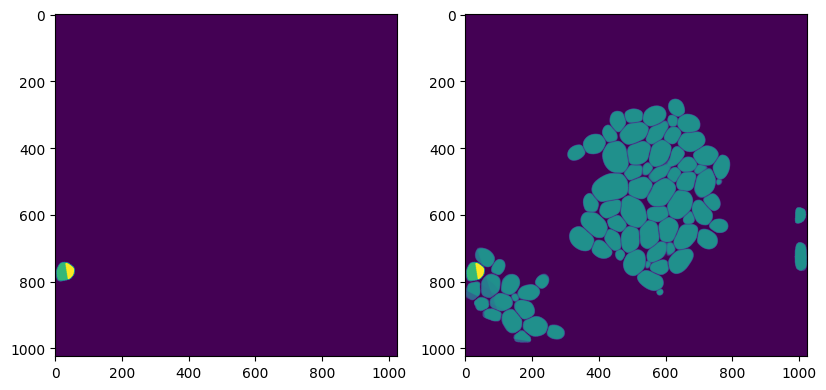

number of detections 17 u_sem 0 u_mask 0.9380711 u_box 0.0 u_det 0.425
2024


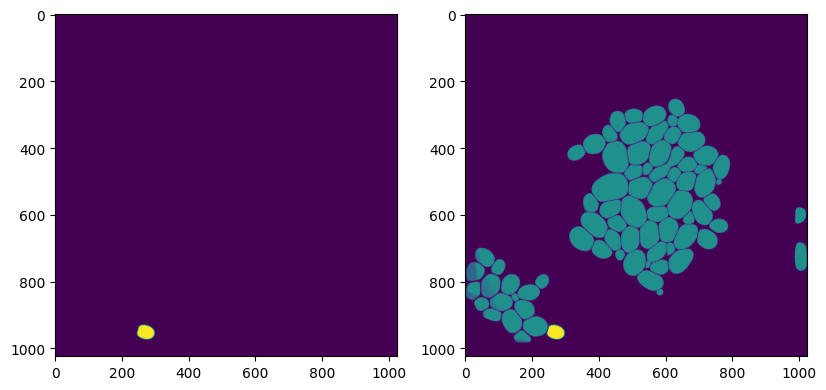

number of detections 3 u_sem 0 u_mask 0.860313 u_box 0.0 u_det 0.075
1427


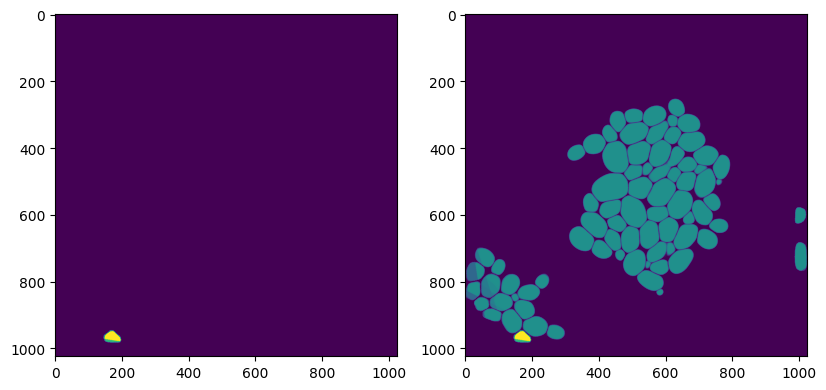

number of detections 2 u_sem 0 u_mask 0.7751479 u_box 0.0 u_det 0.05
507


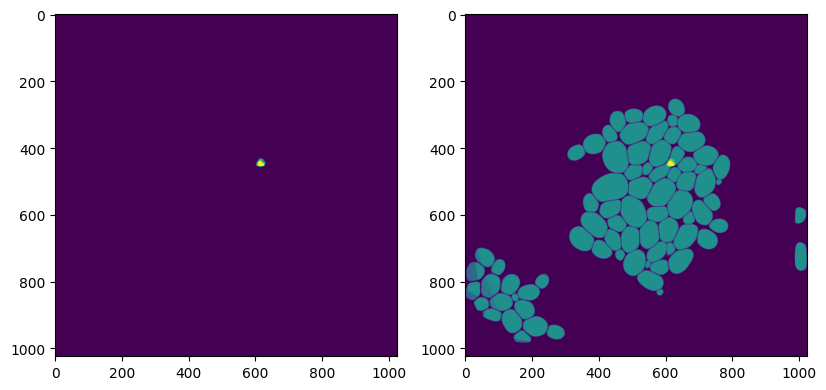

number of detections 2 u_sem 0 u_mask 0.96610796 u_box 0.0 u_det 0.05
2685


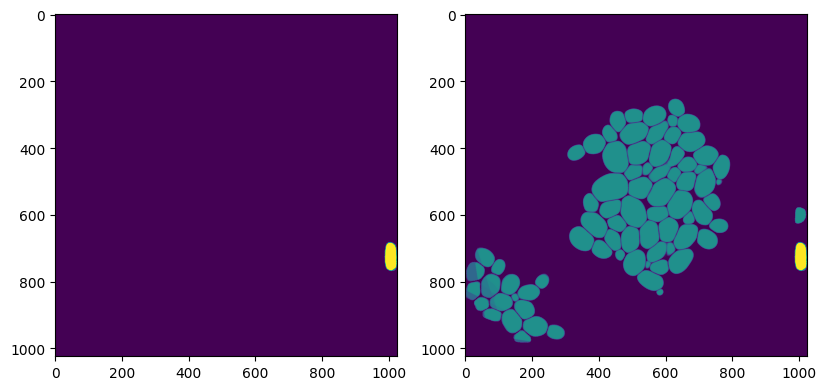

number of detections 1 u_sem 0 u_mask 1.0 u_box 1.0 u_det 0.025
1273


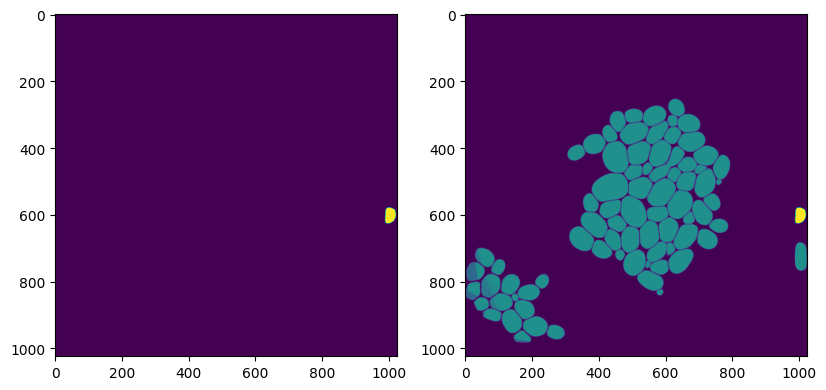

In [12]:
for id in samples:
    im_json = get_json_by_id(id, train_data)
    show_uncertainties(im_json, model35, tta_strategy)

In [21]:
print(torch.cuda.mem_get_info()[0] / torch.cuda.mem_get_info()[1])
torch.cuda.empty_cache()
print(torch.cuda.mem_get_info()[0] / torch.cuda.mem_get_info()[1])

0.09162098668754894
0.09162098668754894


loading custom model
running mc dropout sampling...


  0%|                                                                                                                                                                  | 0/110 [00:00<?, ?it/s]/home/florian/.local/lib/python3.10/site-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3190.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 110/110 [03:44<00:00,  2.04s/it]


finished with mc dropout sampling.
min uncertainty:  0.05750509351491928 	 mean uncertainty:  0.3107660242102363 	 max uncertainty:  0.5946394205093384
worst examples: ['acdc_data3_Yagya_SCGE_WT_pos_5_3', 'acdc_data3_Yagya_SCGE_WT_pos_6_3', 'acdc_data3_20210722_pos_17_123', 'acdc_data2_F016_pos_8_63', 'acdc_data3_20210722_pos_1_123', 'acdc_data2_beer_experiment1_pos_44_3', 'acdc_data2_kurt_306-3_0_20201028_pos_4_3', 'acdc_data3_Yagya_SCGE_WT_pos_1_3', 'acdc_data3_Yagya_SCGE_WT_pos_4_3', 'acdc_data2_F016_pos_4_3', 'acdc_data2_F016_pos_4_63', 'acdc_data3_Yagya_SCGE_WT_pos_6_63', 'TimeLapse_2D_MIA_KC_htb1_mCitrine_labeled_pos_3_63', 'acdc_data2_kurt_306-3_0_20201028_pos_3_3', 'TimeLapse_2D_MIA_KC_htb1_mCitrine_labeled_pos_4_3']
acdc_data3_Yagya_SCGE_WT_pos_5_3 0.39217746


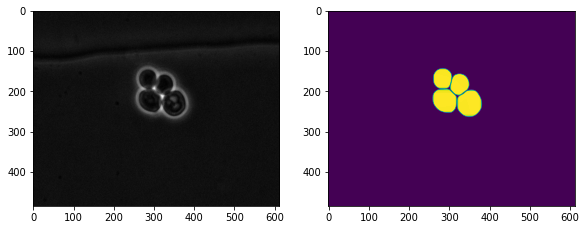

number of detections 79 u_sem 0.30693293 u_mask 0.9240804 u_box 0.92410296 u_det 1.0
1    40
0    39
dtype: int64
3320


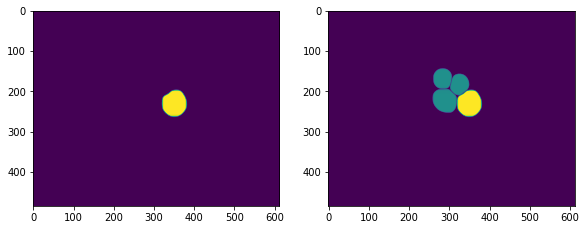

number of detections 80 u_sem 0.30685282 u_mask 0.9241835 u_box 0.927755 u_det 1.0
0    40
1    40
dtype: int64
2937


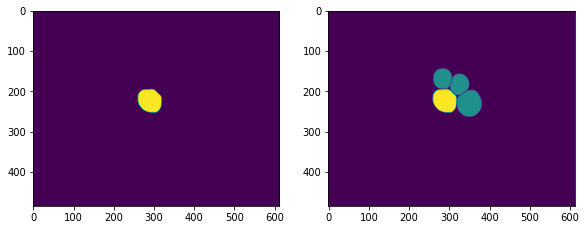

acdc_data3_Yagya_SCGE_WT_pos_6_3 0.41685233


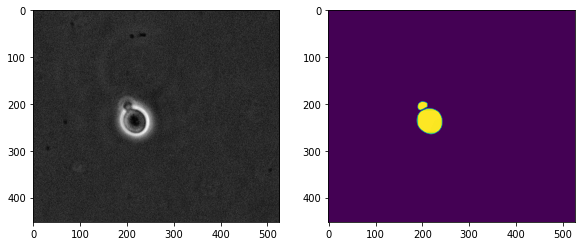

number of detections 40 u_sem 1.0 u_mask 0.8833225 u_box 0.919446 u_det 1.0
2    40
dtype: int64
307


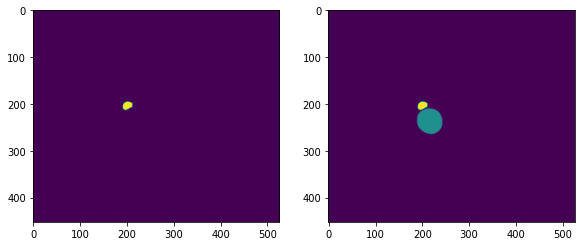

number of detections 80 u_sem 0.30685282 u_mask 0.92217785 u_box 0.9040251 u_det 1.0
1    40
0    40
dtype: int64
2458


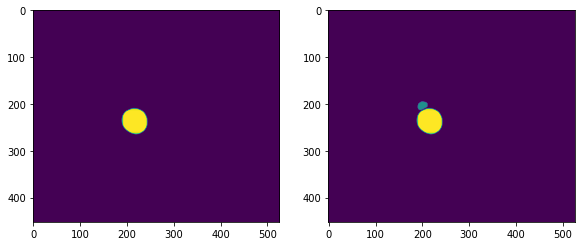

In [10]:
mc_strategy = MCDropoutSampler(cfg)
mc_samples = mc_strategy.sample(cfg, id_pool, mc_model35)
for id in mc_samples[:2]:
    im_json = get_json_by_id(id, train_data)
    show_uncertainties(im_json, mc_model35, mc_strategy)


acdc_data2_kurt_306-3_20_20201105_pos_3_123 0.04587838


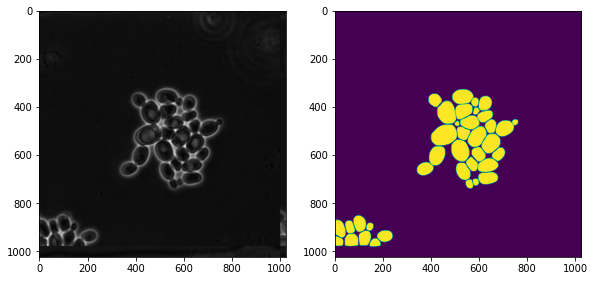

number of detections 64 u_sem 0.33843672 u_mask 0.9249371 u_box 0.9241972 u_det 1.0
1    40
2    24
dtype: int64
2787


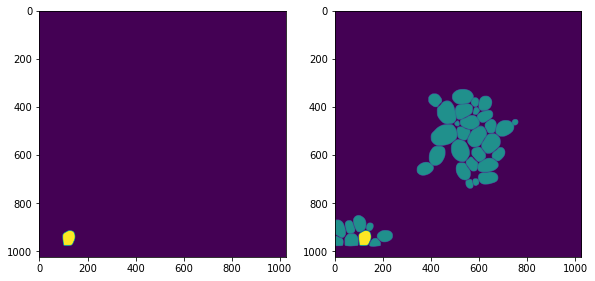

number of detections 58 u_sem 0.3806237 u_mask 0.9151057 u_box 0.92245144 u_det 1.0
2    40
1    18
dtype: int64
2734


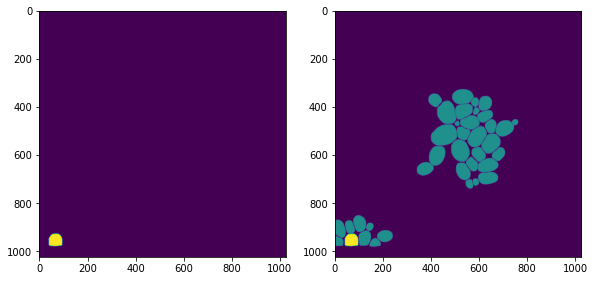

number of detections 55 u_sem 0.34724826 u_mask 0.91846436 u_box 0.9393132 u_det 1.0
1    40
0    14
2     1
dtype: int64
2857


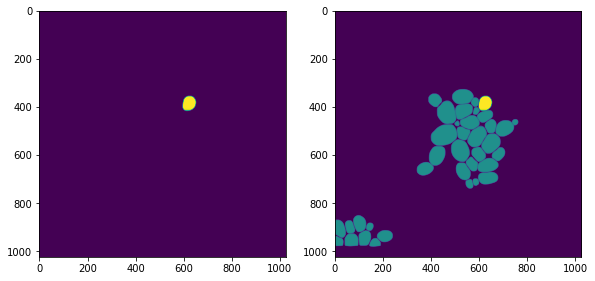

number of detections 34 u_sem 1.0 u_mask 0.9355197 u_box 0.948586 u_det 0.49000007
2    34
dtype: int64
1235


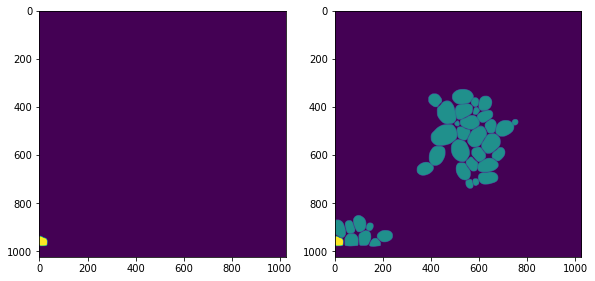

number of detections 35 u_sem 1.0 u_mask 0.88421273 u_box 0.92620546 u_det 0.5625
2    35
dtype: int64
685


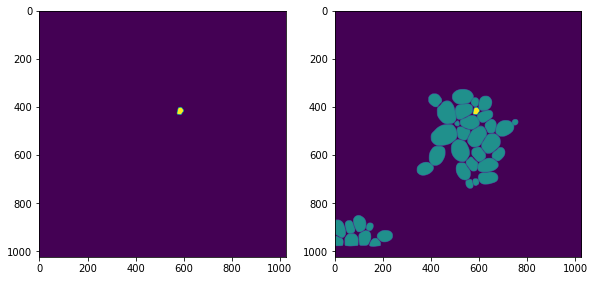

number of detections 73 u_sem 0.17374516 u_mask 0.9236456 u_box 0.9206037 u_det 1.0
1    40
2    30
0     3
dtype: int64
2550


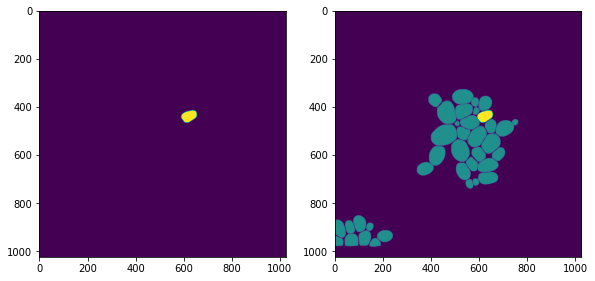

number of detections 84 u_sem 0.0 u_mask 0.9369835 u_box 0.94799787 u_det 1.0
0    31
1    28
2    25
dtype: int64
2607


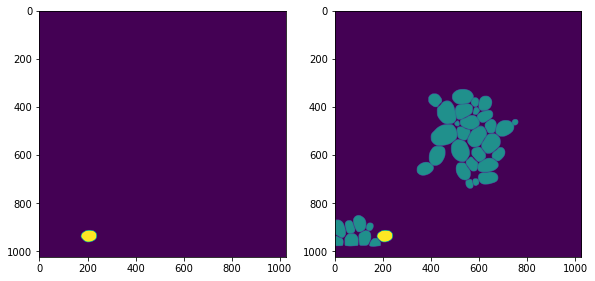

number of detections 10 u_sem 1.0 u_mask 0.74317384 u_box 0.8477248 u_det 0.25
2    10
dtype: int64
397


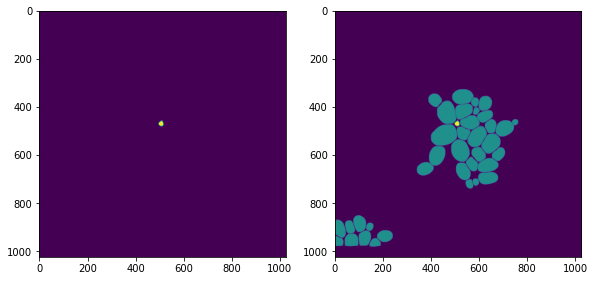

acdc_data3_20211029_pos_24_183 0.101388894


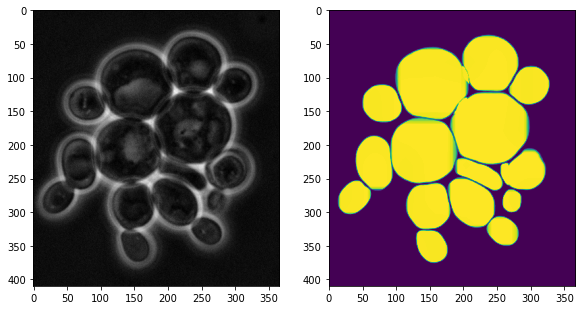

number of detections 74 u_sem 0.31014347 u_mask 0.89592475 u_box 0.90535116 u_det 1.0
0    40
2    34
dtype: int64
1620


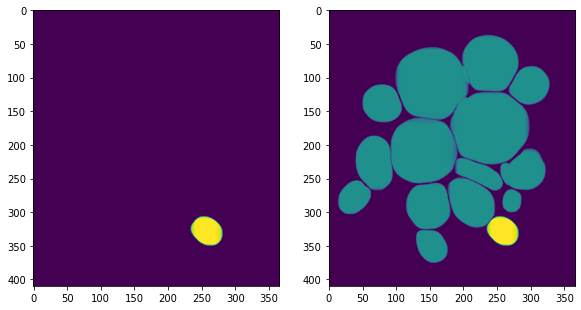

number of detections 57 u_sem 0.39062953 u_mask 0.9251894 u_box 0.9310972 u_det 1.0
2    40
0    17
dtype: int64
1859


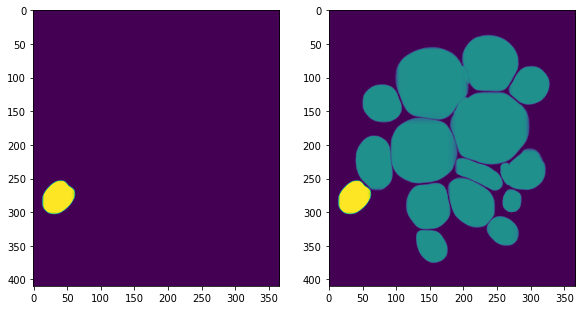

number of detections 49 u_sem 0.5230817 u_mask 0.9137658 u_box 0.9219628 u_det 1.0
2    40
0     9
dtype: int64
807


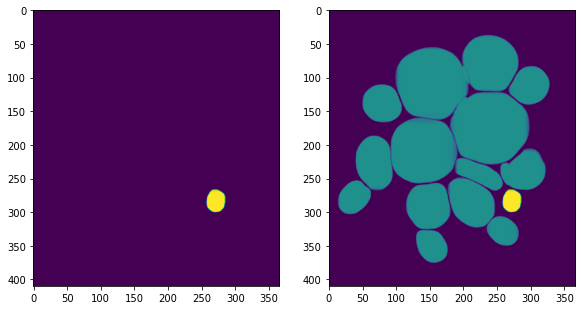

number of detections 80 u_sem 0.30685282 u_mask 0.90340716 u_box 0.9192997 u_det 1.0
0    40
1    40
dtype: int64
2922


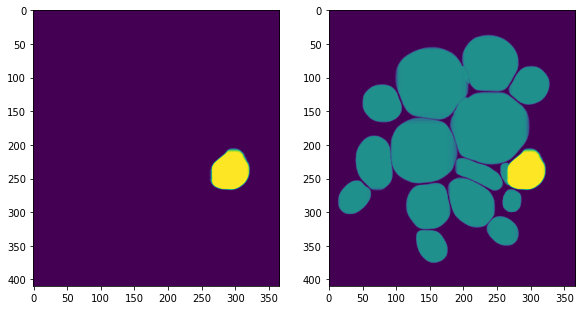

number of detections 37 u_sem 1.0 u_mask 0.87235534 u_box 0.9012622 u_det 0.7225
2    37
dtype: int64
389


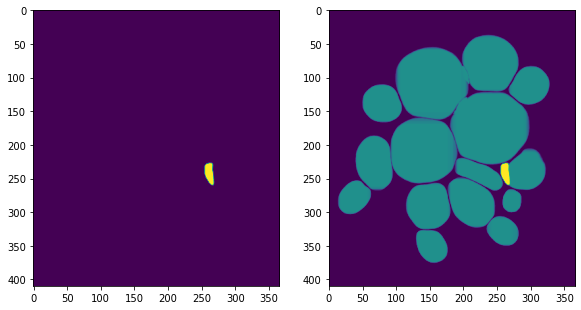

number of detections 10 u_sem 1.0 u_mask 0.78031415 u_box 0.89044446 u_det 0.25
2    10
dtype: int64
191


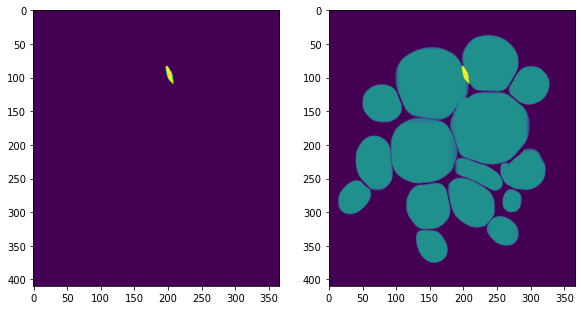

number of detections 11 u_sem 1.0 u_mask 0.79972255 u_box 0.8850857 u_det 0.20249999
2    11
dtype: int64
274


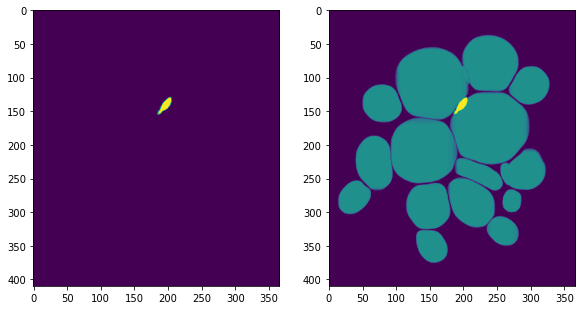

acdc_data2_kurt_306-3_20_20201105_pos_5_183 0.07034884


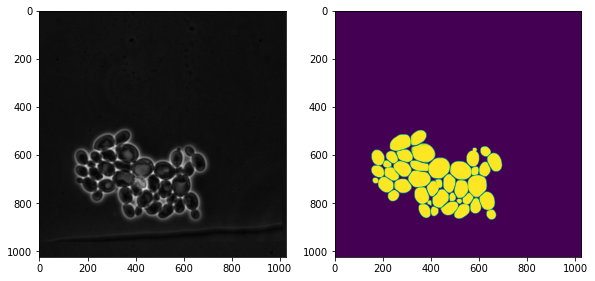

number of detections 79 u_sem 0.30693293 u_mask 0.9224379 u_box 0.90641457 u_det 1.0
0    40
1    39
dtype: int64
6329


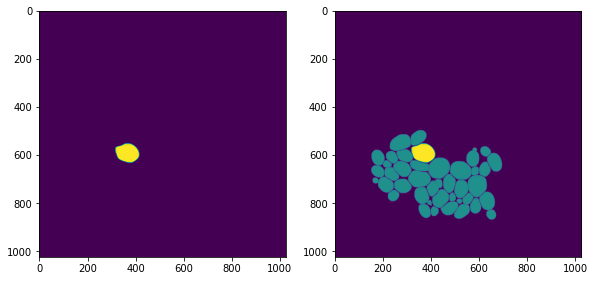

number of detections 44 u_sem 0.589085 u_mask 0.94067174 u_box 0.94959074 u_det 1.0
0    39
2     4
1     1
dtype: int64
2841


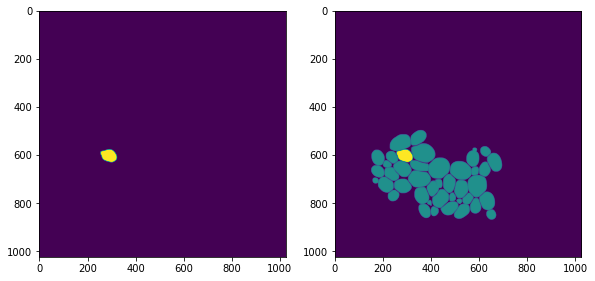

number of detections 56 u_sem 0.40173042 u_mask 0.9326003 u_box 0.9369081 u_det 1.0
1    40
0    16
dtype: int64
3757


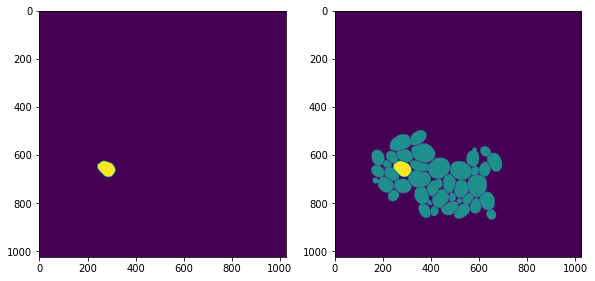

number of detections 65 u_sem 0.3126629 u_mask 0.92876965 u_box 0.9548107 u_det 1.0
0    36
2    29
dtype: int64
3240


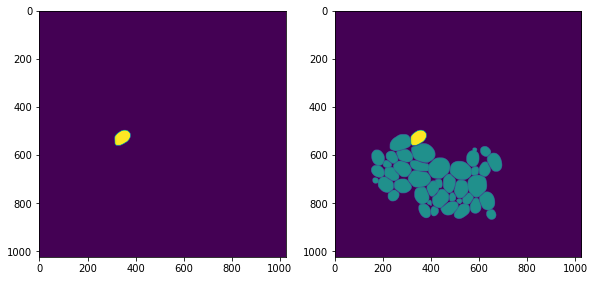

number of detections 40 u_sem 1.0 u_mask 0.8662315 u_box 0.8812386 u_det 1.0
2    40
dtype: int64
270


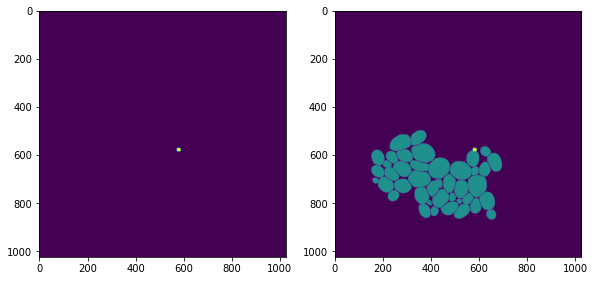

number of detections 56 u_sem 0.40173042 u_mask 0.92611074 u_box 0.92377317 u_det 1.0
1    40
0    16
dtype: int64
2979


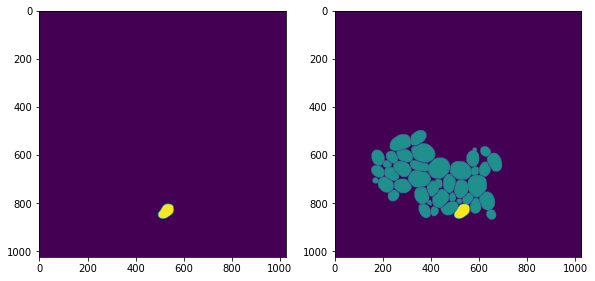

number of detections 60 u_sem 0.33432764 u_mask 0.92379886 u_box 0.9364403 u_det 1.0
0    37
1    23
dtype: int64
3473


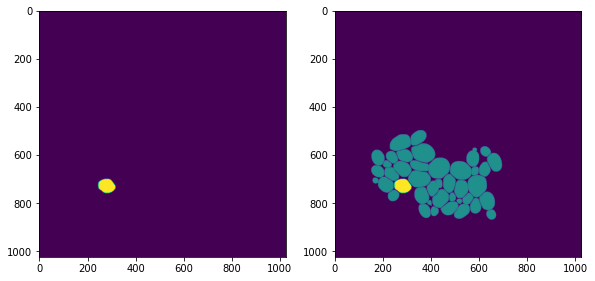

number of detections 64 u_sem 0.33843672 u_mask 0.9224999 u_box 0.92180204 u_det 1.0
1    40
0    24
dtype: int64
4013


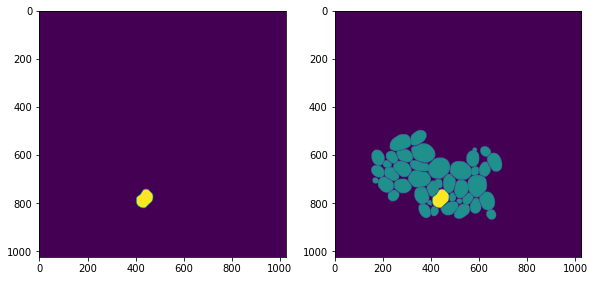

number of detections 63 u_sem 0.3437152 u_mask 0.94125473 u_box 0.9367401 u_det 1.0
0    40
1    23
dtype: int64
3552


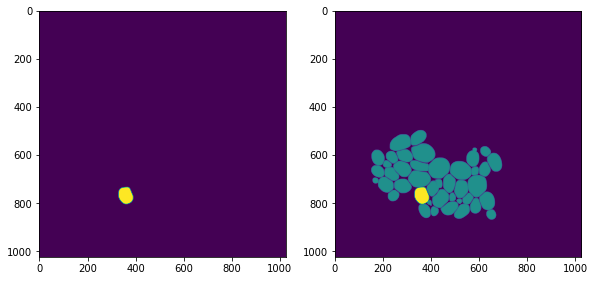

number of detections 74 u_sem 0.30831444 u_mask 0.9431878 u_box 0.9466359 u_det 1.0
2    39
0    35
dtype: int64
2348


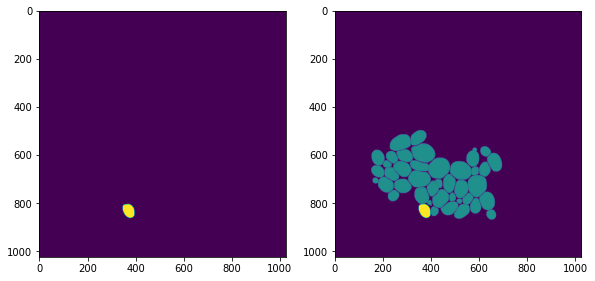

number of detections 70 u_sem 0.16830027 u_mask 0.93693495 u_box 0.927016 u_det 1.0
0    38
2    29
1     3
dtype: int64
3243


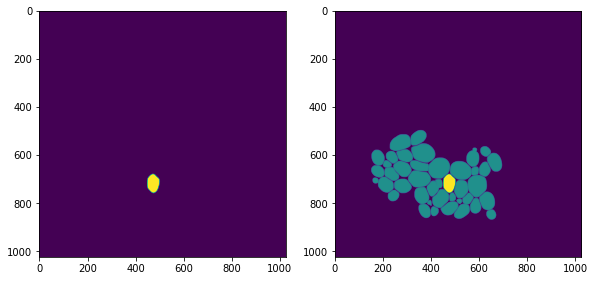

number of detections 53 u_sem 0.44290656 u_mask 0.932231 u_box 0.9332797 u_det 1.0
1    40
0    13
dtype: int64
3597


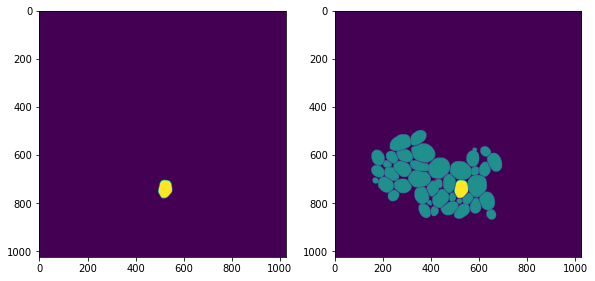

number of detections 70 u_sem 0.31053078 u_mask 0.93386364 u_box 0.9459493 u_det 1.0
1    38
0    32
dtype: int64
2877


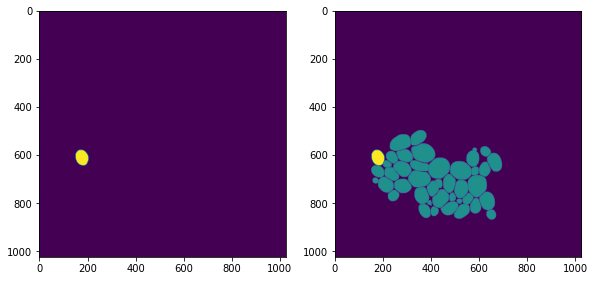

number of detections 52 u_sem 0.4597959 u_mask 0.9274256 u_box 0.9316083 u_det 1.0
2    40
0    12
dtype: int64
1991


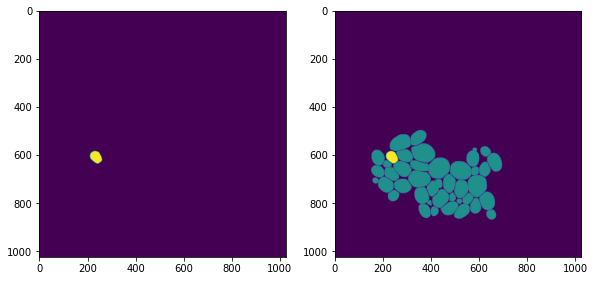

number of detections 61 u_sem 0.13998115 u_mask 0.9018767 u_box 0.9034458 u_det 1.0
2    38
0    18
1     5
dtype: int64
2566


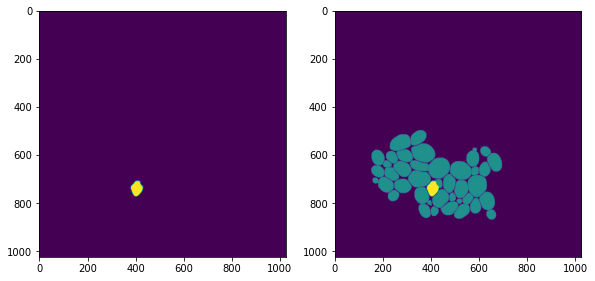

number of detections 59 u_sem 0.30520612 u_mask 0.9239844 u_box 0.9372301 u_det 1.0
1    40
0    18
2     1
dtype: int64
2373


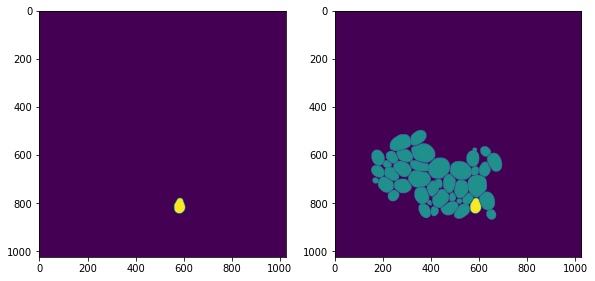

number of detections 75 u_sem 0.11424124 u_mask 0.92988867 u_box 0.93846935 u_det 1.0
0    39
1    31
2     5
dtype: int64
2582


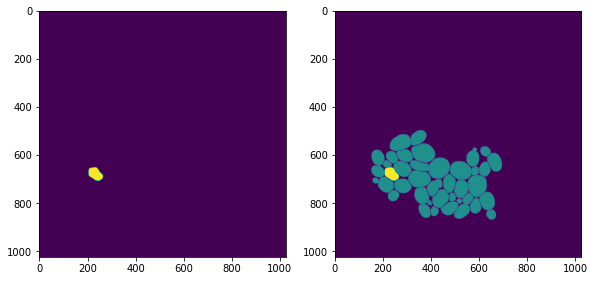

number of detections 18 u_sem 1.0 u_mask 0.8476581 u_box 0.907182 u_det 0.00999999
2    18
dtype: int64
1048


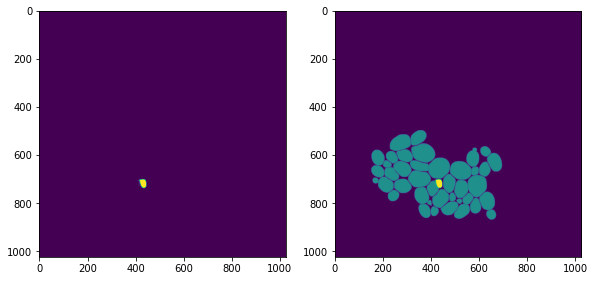

number of detections 20 u_sem 1.0 u_mask 0.8221471 u_box 0.88673127 u_det 0.0
2    20
dtype: int64
340


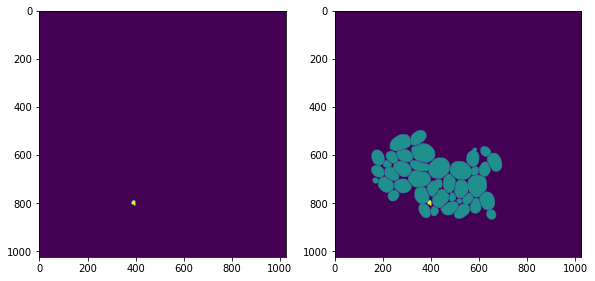

number of detections 25 u_sem 1.0 u_mask 0.872416 u_box 0.9144578 u_det 0.0625
2    25
dtype: int64
400


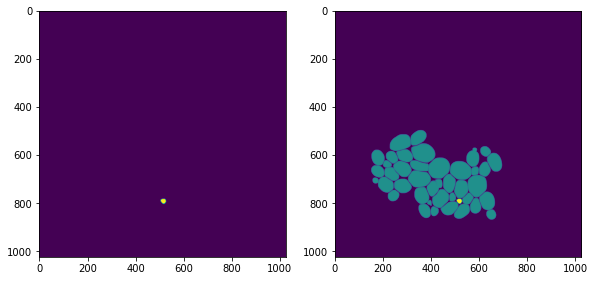

number of detections 1 u_sem 1.0 u_mask 1.0 u_box 1.0 u_det 0.9025
2    1
dtype: int64
400


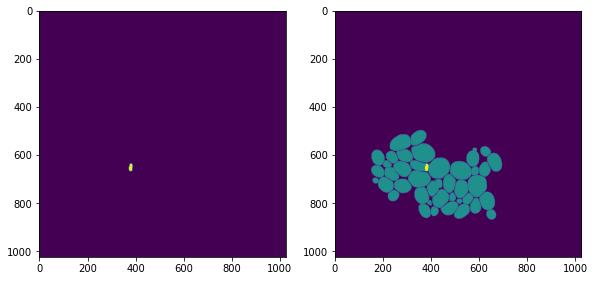

acdc_data3_20211029_pos_5_63 0.07071429


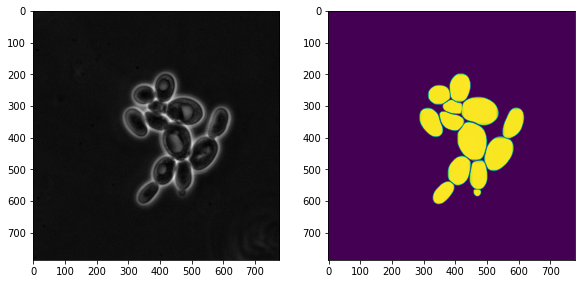

number of detections 40 u_sem 1.0 u_mask 0.8758676 u_box 0.9263711 u_det 1.0
2    40
dtype: int64
2066


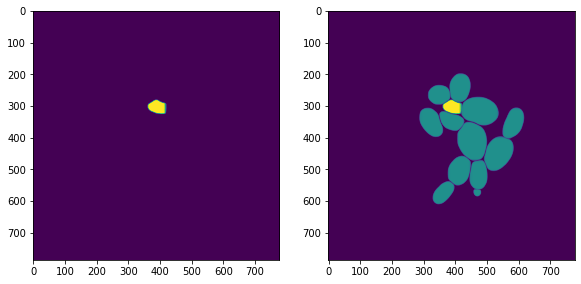

number of detections 62 u_sem 0.34960938 u_mask 0.9211641 u_box 0.9082467 u_det 1.0
0    40
2    22
dtype: int64
4868


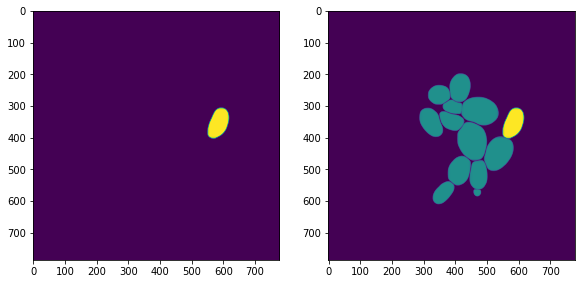

number of detections 50 u_sem 0.49959755 u_mask 0.93490946 u_box 0.934439 u_det 1.0
1    40
0    10
dtype: int64
4899


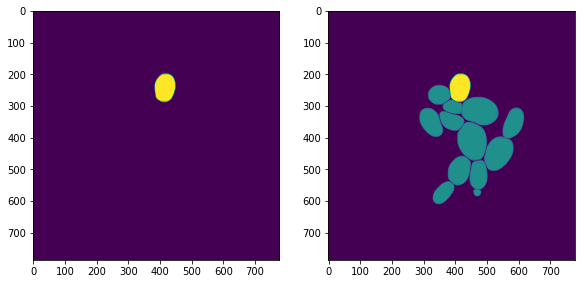

number of detections 80 u_sem 0.30685282 u_mask 0.9342477 u_box 0.9272707 u_det 1.0
0    40
1    40
dtype: int64
7654


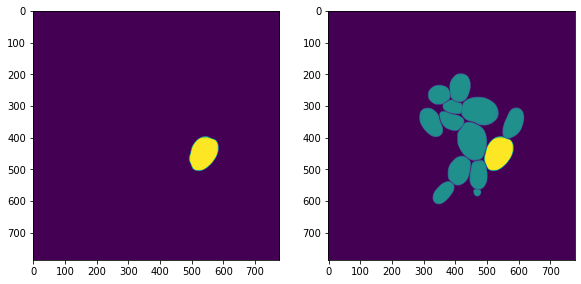

number of detections 22 u_sem 1.0 u_mask 0.80619454 u_box 0.8632669 u_det 0.00999999
2    22
dtype: int64
646


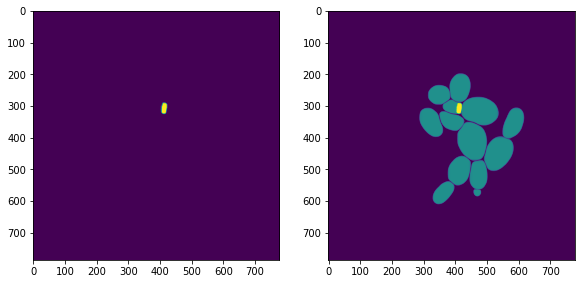

number of detections 80 u_sem 0.30685282 u_mask 0.92392313 u_box 0.922324 u_det 1.0
0    40
1    40
dtype: int64
4364


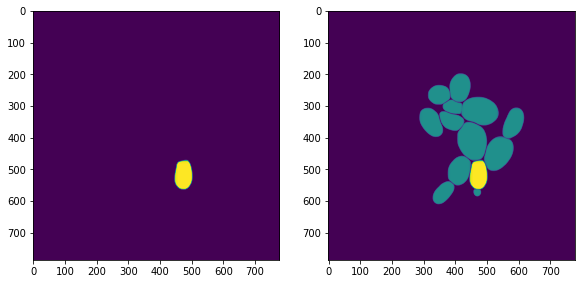

acdc_data3_20211029_pos_24_123 0.0965


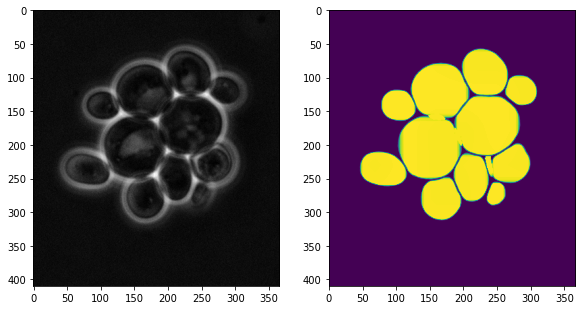

number of detections 40 u_sem 1.0 u_mask 0.8963702 u_box 0.9296567 u_det 1.0
2    40
dtype: int64
770


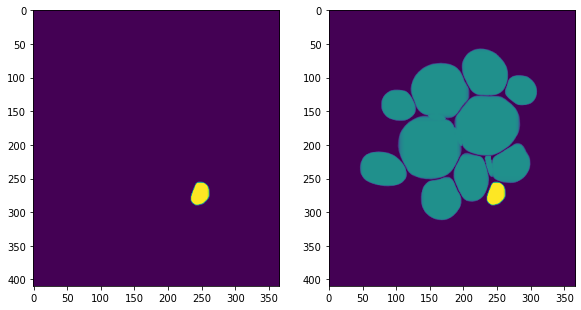

number of detections 90 u_sem 0.03503704 u_mask 0.9293531 u_box 0.9224653 u_det 1.0
1    40
2    40
0    10
dtype: int64
1718


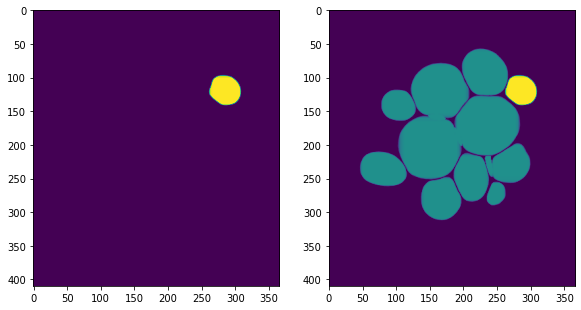

number of detections 95 u_sem 0.0 u_mask 0.93466276 u_box 0.91785747 u_det 1.0
2    40
0    40
1    15
dtype: int64
1939


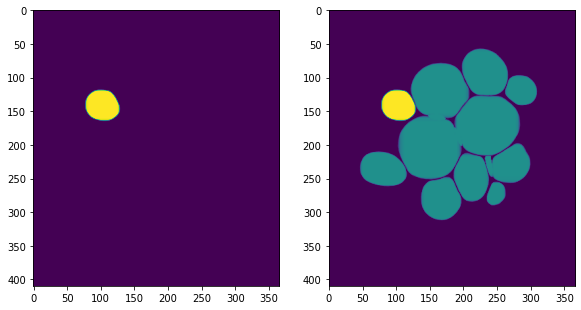

number of detections 81 u_sem 0.24888861 u_mask 0.9199115 u_box 0.9216158 u_det 1.0
1    40
0    40
2     1
dtype: int64
2637


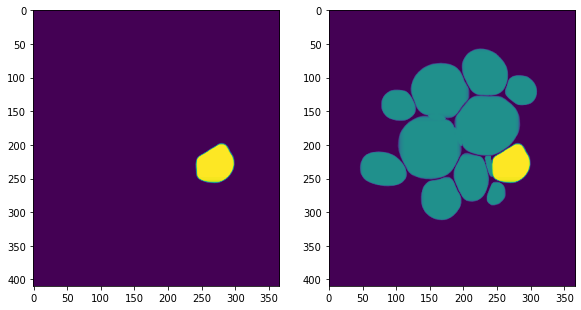

number of detections 40 u_sem 1.0 u_mask 0.8506052 u_box 0.87767637 u_det 1.0
2    40
dtype: int64
252


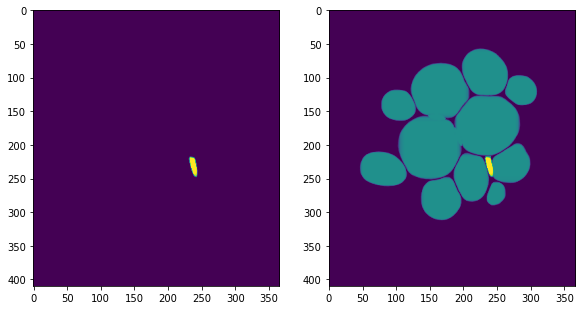

number of detections 18 u_sem 1.0 u_mask 0.799497 u_box 0.90262437 u_det 0.00999999
2    18
dtype: int64
216


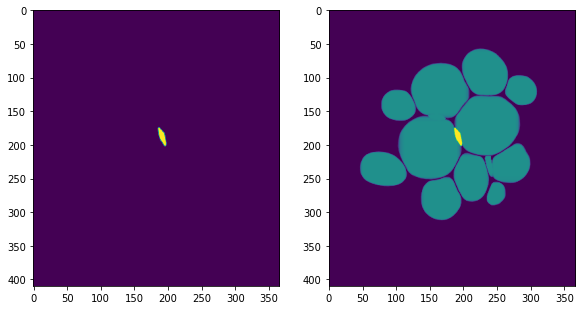

number of detections 4 u_sem 1.0 u_mask 0.8848039 u_box 0.89525163 u_det 0.64
2    4
dtype: int64
204


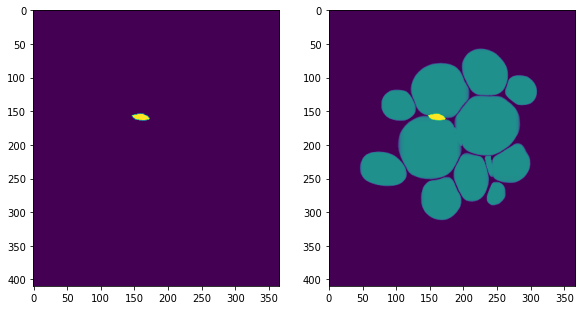

number of detections 1 u_sem 1.0 u_mask 1.0 u_box 1.0 u_det 0.9025
2    1
dtype: int64
53


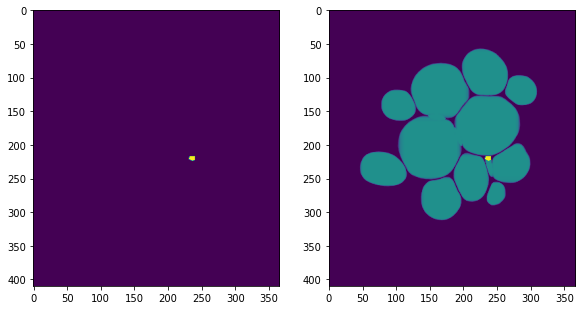

acdc_data2_kurt_306-3_20_20201105_pos_3_3 0.06750002


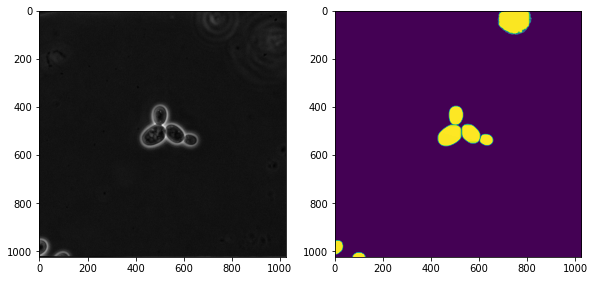

number of detections 47 u_sem 0.57914066 u_mask 0.91434735 u_box 0.91176444 u_det 1.0
1    40
0     7
dtype: int64
4994


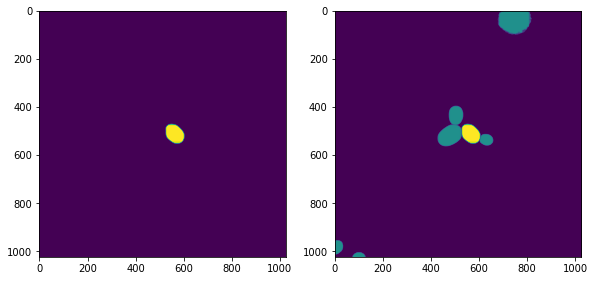

number of detections 80 u_sem 0.30685282 u_mask 0.9239919 u_box 0.92198354 u_det 1.0
0    40
1    40
dtype: int64
7072


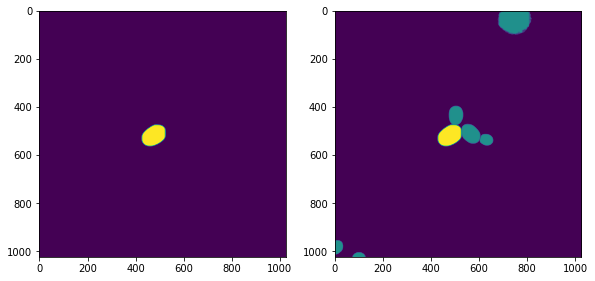

number of detections 1 u_sem 1.0 u_mask 1.0 u_box 1.0 u_det 0.9025
0    1
dtype: int64
1513


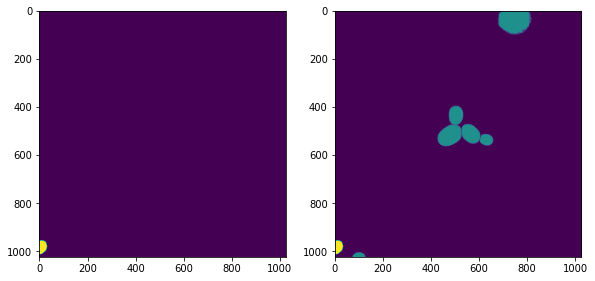

number of detections 3 u_sem 1.0 u_mask 0.8776709 u_box 0.8756736 u_det 0.72249997
0    3
dtype: int64
11430


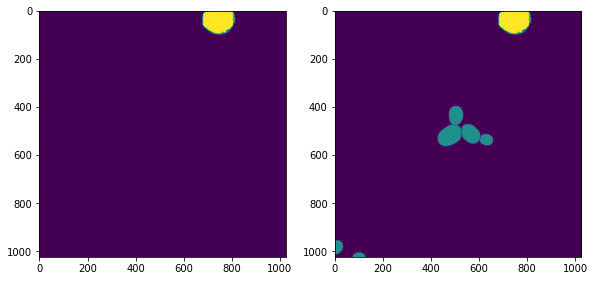

number of detections 1 u_sem 1.0 u_mask 1.0 u_box 1.0 u_det 0.9025
2    1
dtype: int64
784


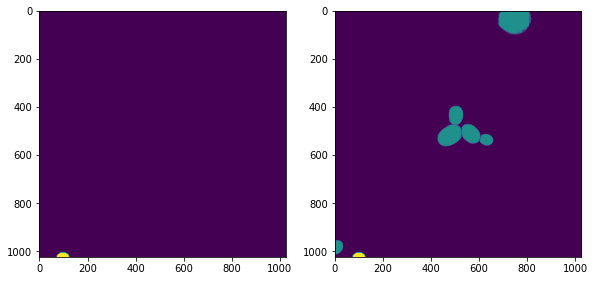

acdc_data3_20210722_pos_13_3 0.08400001


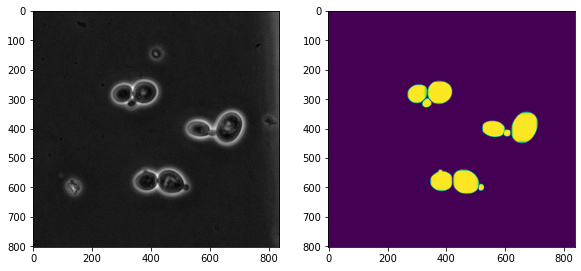

number of detections 66 u_sem 0.32952237 u_mask 0.9145341 u_box 0.9103157 u_det 1.0
1    40
0    26
dtype: int64
6037


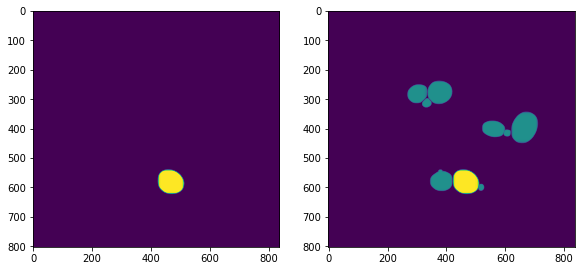

number of detections 80 u_sem 0.30685282 u_mask 0.89340335 u_box 0.8951855 u_det 1.0
0    40
1    40
dtype: int64
3505


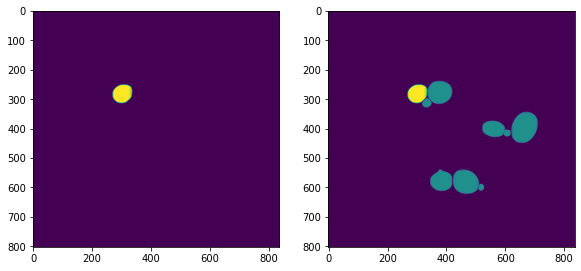

number of detections 80 u_sem 0.30685282 u_mask 0.90720457 u_box 0.90049523 u_det 1.0
1    40
0    40
dtype: int64
7696


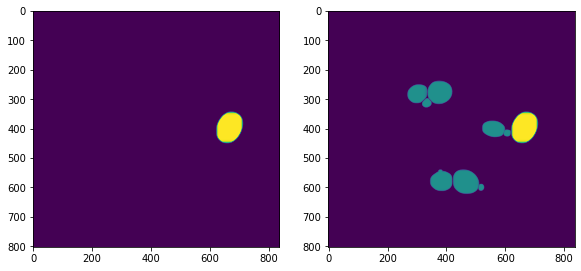

number of detections 28 u_sem 1.0 u_mask 0.91463935 u_box 0.91423136 u_det 0.15999997
2    28
dtype: int64
453


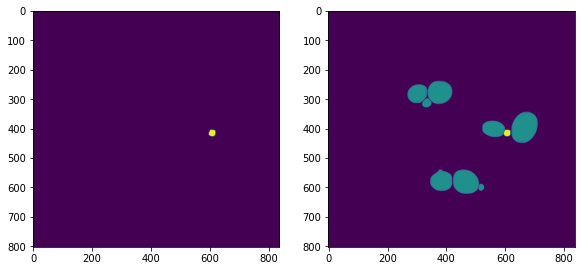

number of detections 40 u_sem 1.0 u_mask 0.71500003 u_box 0.8488461 u_det 1.0
2    40
dtype: int64
108


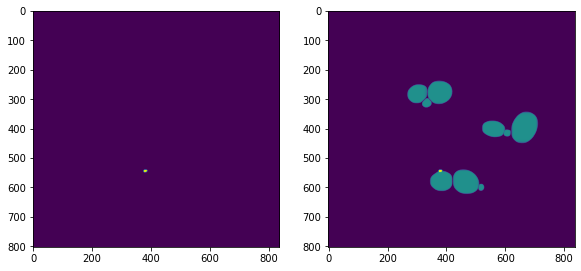

acdc_data3_Yagya_SCGE_WT_pos_4_3 0.105000004


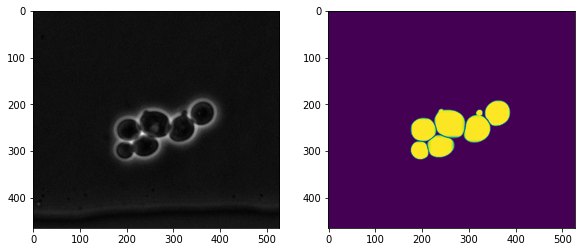

number of detections 61 u_sem 0.3561777 u_mask 0.935034 u_box 0.91831136 u_det 1.0
1    40
0    21
dtype: int64
2693


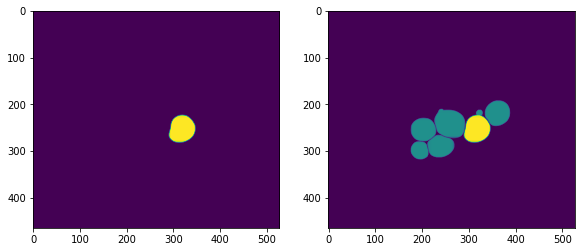

number of detections 89 u_sem 0.04940158 u_mask 0.9246221 u_box 0.90998375 u_det 1.0
0    40
2    40
1     9
dtype: int64
2220


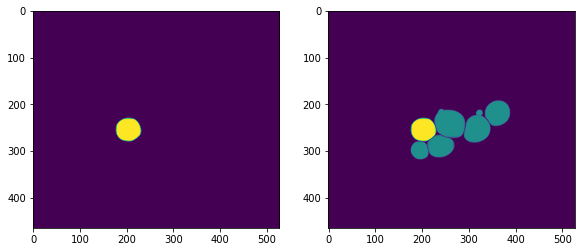

number of detections 83 u_sem 0.17641473 u_mask 0.91162443 u_box 0.9035811 u_det 1.0
1    40
0    40
2     3
dtype: int64
2187


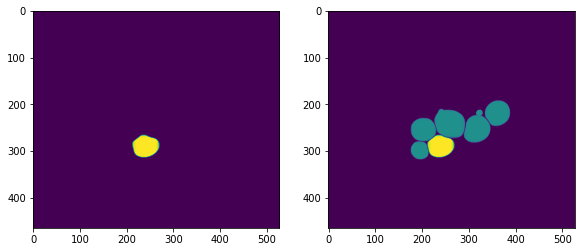

number of detections 80 u_sem 0.30685282 u_mask 0.9208495 u_box 0.91322124 u_det 1.0
0    40
1    40
dtype: int64
3349


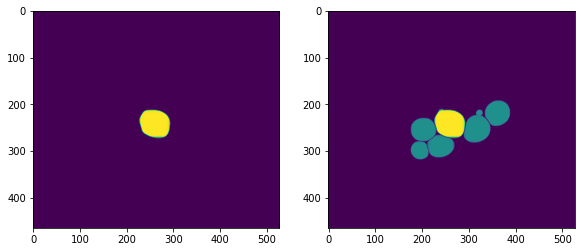

number of detections 28 u_sem 1.0 u_mask 0.66906893 u_box 0.7807454 u_det 0.15999997
2    28
dtype: int64
80


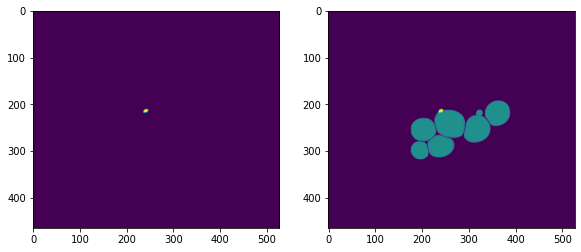

acdc_data3_20211029_pos_15_63 0.117500015


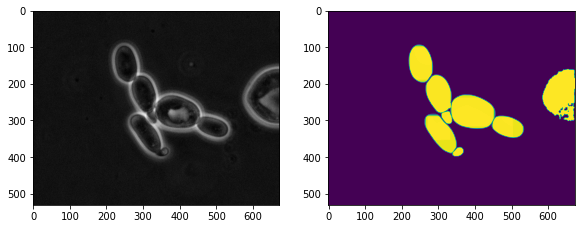

number of detections 41 u_sem 0.8853347 u_mask 0.8879012 u_box 0.92043084 u_det 1.0
1    40
2     1
dtype: int64
5792


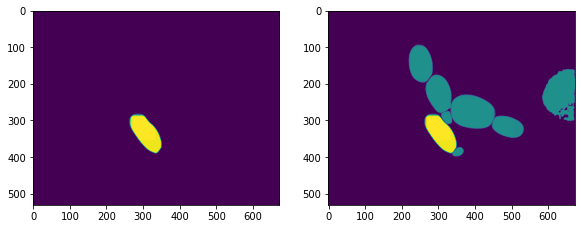

number of detections 80 u_sem 0.30685282 u_mask 0.9326454 u_box 0.9313758 u_det 1.0
1    40
0    40
dtype: int64
5498


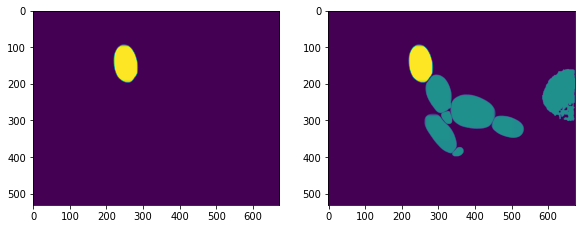

number of detections 16 u_sem 1.0 u_mask 0.7597805 u_box 0.833521 u_det 0.03999996
2    16
dtype: int64
131


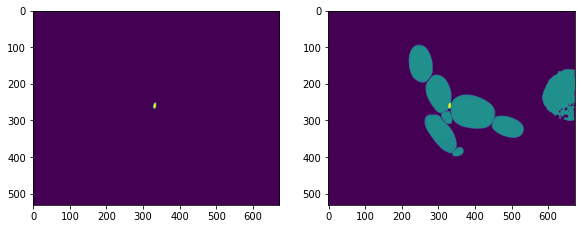

number of detections 1 u_sem 1.0 u_mask 1.0 u_box 1.0 u_det 0.9025
1    1
dtype: int64
9122


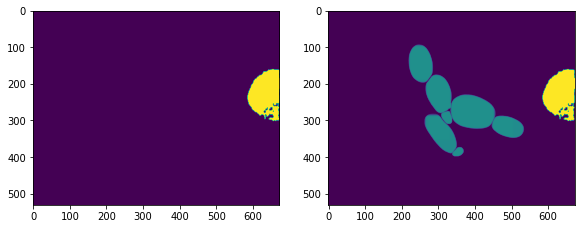

acdc_data2_kurt_306-3_20_20201105_pos_3_63 0.13966668


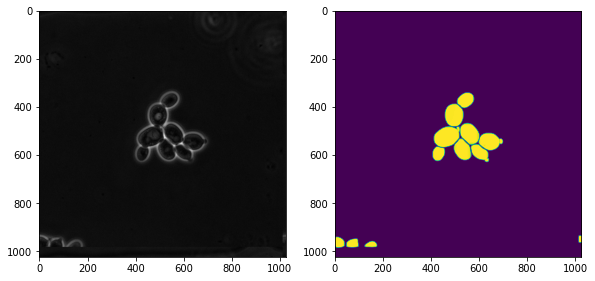

number of detections 40 u_sem 1.0 u_mask 0.8652381 u_box 0.9013094 u_det 1.0
2    40
dtype: int64
294


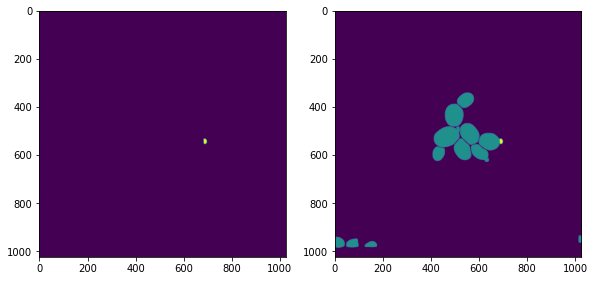

number of detections 64 u_sem 0.33843672 u_mask 0.9262618 u_box 0.91972053 u_det 1.0
2    40
1    24
dtype: int64
3516


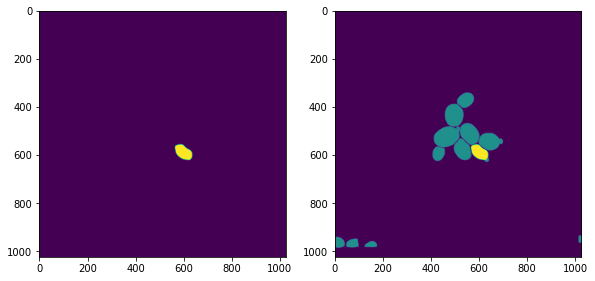

number of detections 40 u_sem 1.0 u_mask 0.8992692 u_box 0.9206778 u_det 1.0
2    40
dtype: int64
1040


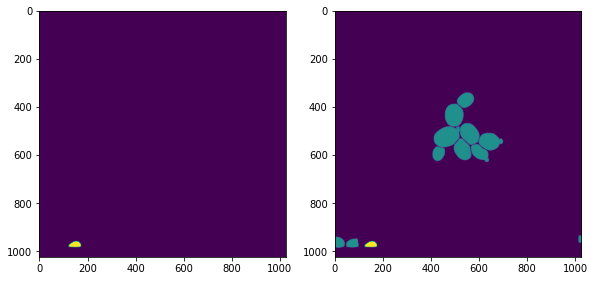

number of detections 83 u_sem 0.17641473 u_mask 0.91934323 u_box 0.9167789 u_det 1.0
0    40
1    40
2     3
dtype: int64
4886


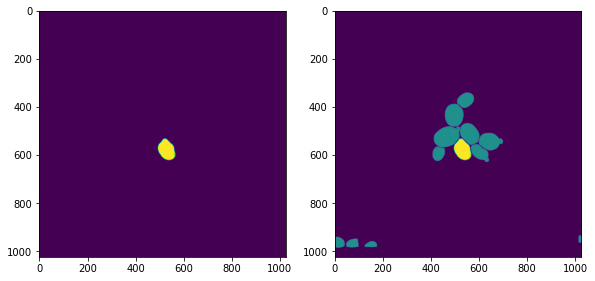

number of detections 34 u_sem 1.0 u_mask 0.7390033 u_box 0.8449626 u_det 0.49000007
2    34
dtype: int64
271


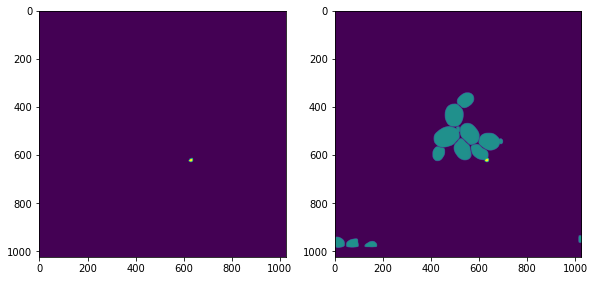

number of detections 34 u_sem 1.0 u_mask 0.89783067 u_box 0.9051623 u_det 0.49000007
2    34
dtype: int64
1596


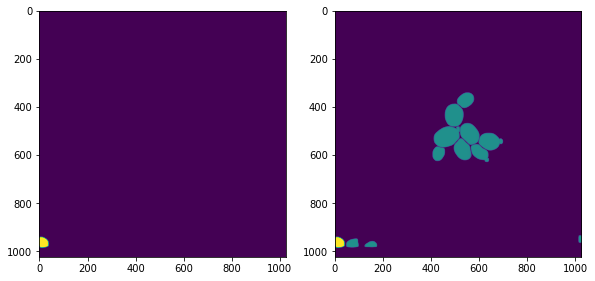

number of detections 17 u_sem 1.0 u_mask 0.668369 u_box 0.85728073 u_det 0.022499979
2    17
dtype: int64
353


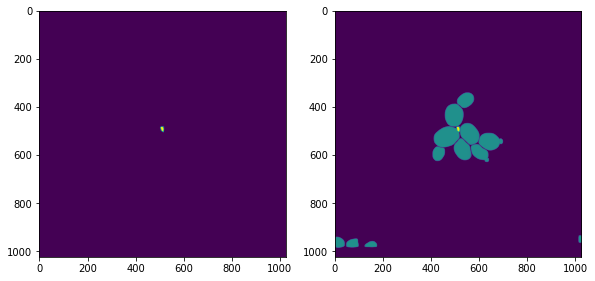

number of detections 1 u_sem 1.0 u_mask 1.0 u_box 1.0 u_det 0.9025
2    1
dtype: int64
397


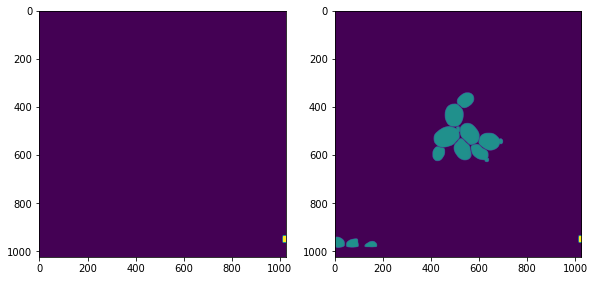

acdc_data3_20211029_pos_15_3 0.20916668


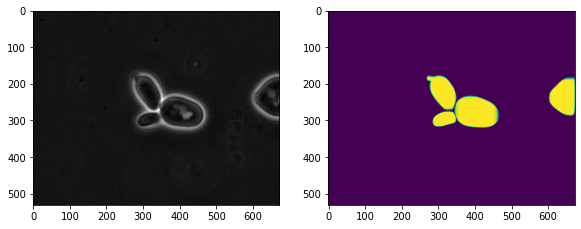

number of detections 63 u_sem 0.3437152 u_mask 0.9169284 u_box 0.9091624 u_det 1.0
1    40
0    23
dtype: int64
8677


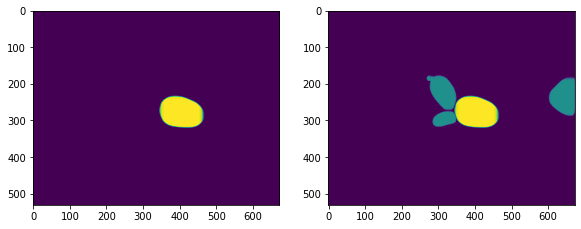

number of detections 37 u_sem 1.0 u_mask 0.61770463 u_box 0.81749445 u_det 0.7225
2    37
dtype: int64
138


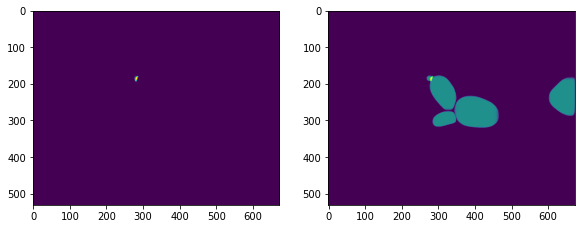

number of detections 23 u_sem 1.0 u_mask 0.6555087 u_box 0.75593054 u_det 0.022499979
2    23
dtype: int64
195


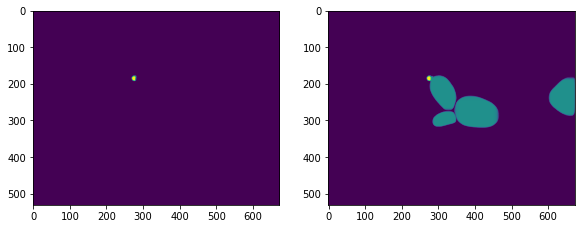

acdc_data3_Yagya_SCGE_WT_pos_5_183 0.16902779


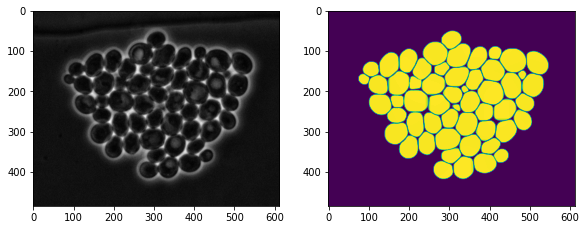

number of detections 40 u_sem 1.0 u_mask 0.897875 u_box 0.94061774 u_det 1.0
2    40
dtype: int64
240


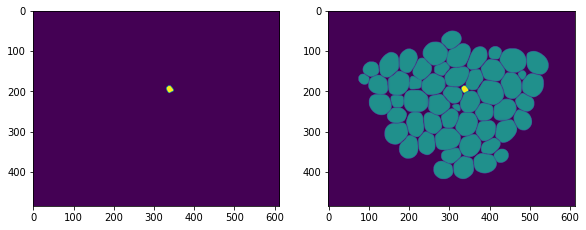

number of detections 39 u_sem 1.0 u_mask 0.94320506 u_box 0.9664831 u_det 0.9025001
2    39
dtype: int64
857


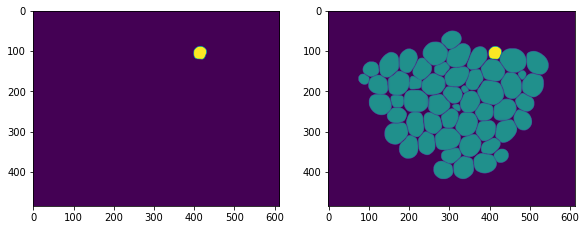

number of detections 41 u_sem 0.5836898 u_mask 0.92176414 u_box 0.92526275 u_det 1.0
1    35
0     6
dtype: int64
2618


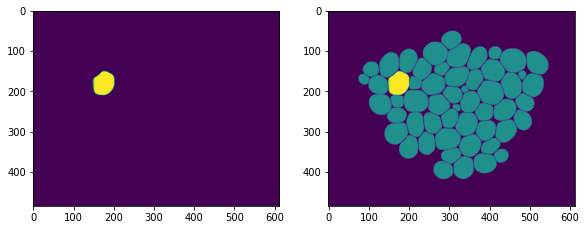

number of detections 40 u_sem 1.0 u_mask 0.82407707 u_box 0.8978168 u_det 1.0
2    40
dtype: int64
279


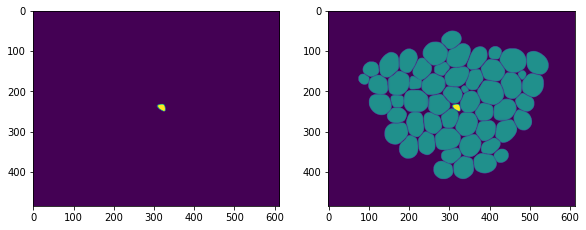

number of detections 39 u_sem 1.0 u_mask 0.94944376 u_box 0.9641652 u_det 0.9025001
0    39
dtype: int64
2549


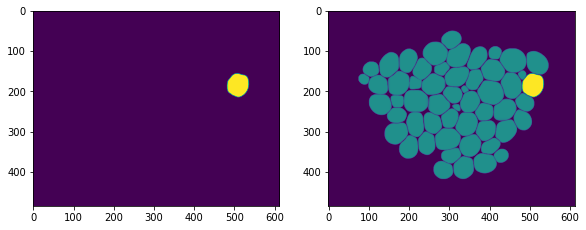

number of detections 34 u_sem 0.7015642 u_mask 0.9427771 u_box 0.9289161 u_det 0.49000007
1    31
0     3
dtype: int64
1857


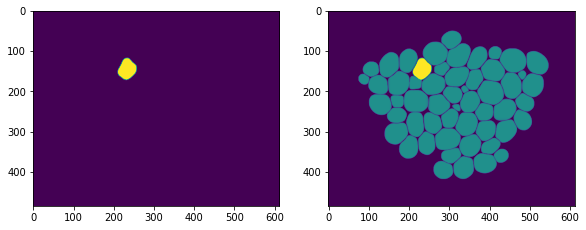

number of detections 33 u_sem 0.8642061 u_mask 0.9263048 u_box 0.92880917 u_det 0.42249995
1    32
0     1
dtype: int64
2928


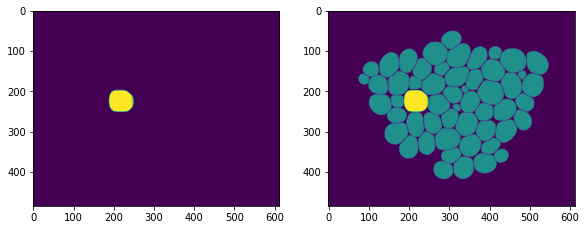

number of detections 29 u_sem 1.0 u_mask 0.95576537 u_box 0.9746283 u_det 0.20250005
2    29
dtype: int64
1192


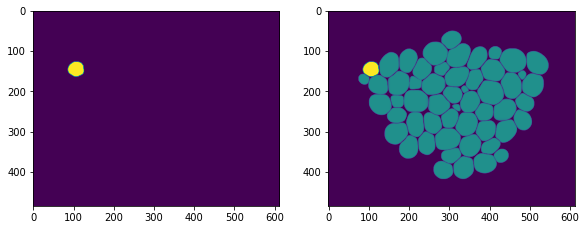

number of detections 35 u_sem 0.8702593 u_mask 0.9443983 u_box 0.95878154 u_det 0.5625
2    34
0     1
dtype: int64
1677


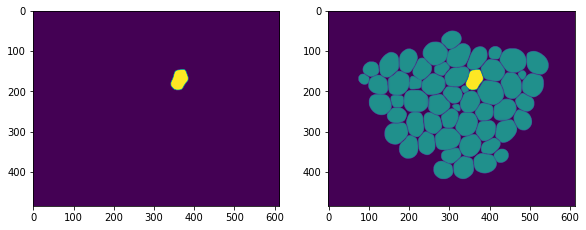

number of detections 34 u_sem 1.0 u_mask 0.94801444 u_box 0.9539649 u_det 0.49000007
1    34
dtype: int64
3147


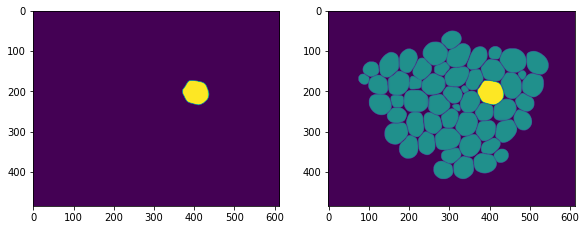

number of detections 45 u_sem 0.443851 u_mask 0.9302585 u_box 0.92096865 u_det 1.0
0    34
2    11
dtype: int64
1448


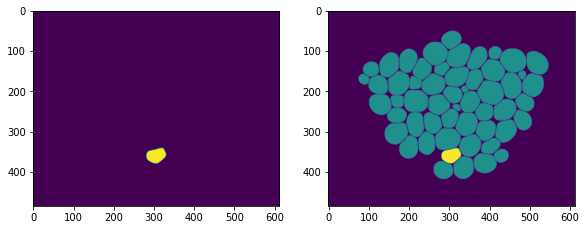

number of detections 36 u_sem 0.5494388 u_mask 0.9151589 u_box 0.9113312 u_det 0.6399999
1    30
0     6
dtype: int64
2436


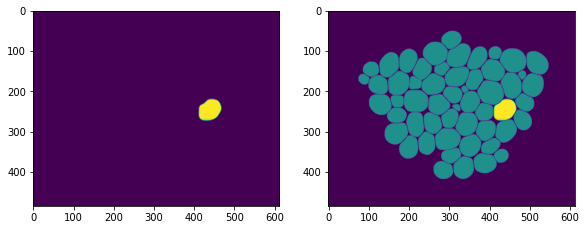

number of detections 27 u_sem 0.3634858 u_mask 0.94872534 u_box 0.924406 u_det 0.1225
1    18
0     9
dtype: int64
2848


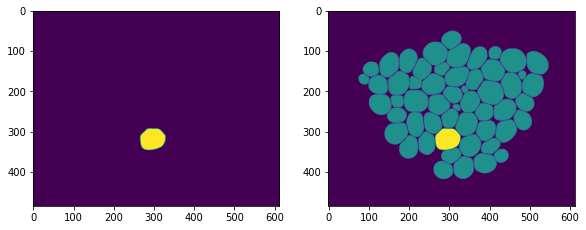

number of detections 5 u_sem 1.0 u_mask 0.96136427 u_box 0.97493756 u_det 0.5625
0    5
dtype: int64
1466


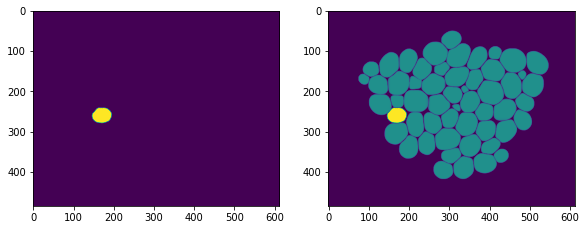

number of detections 32 u_sem 0.76620835 u_mask 0.9472022 u_box 0.951566 u_det 0.36
1    30
0     2
dtype: int64
2433


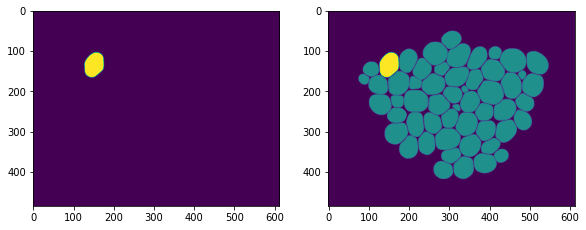

number of detections 23 u_sem 1.0 u_mask 0.938851 u_box 0.9582929 u_det 0.022499979
0    23
dtype: int64
1587


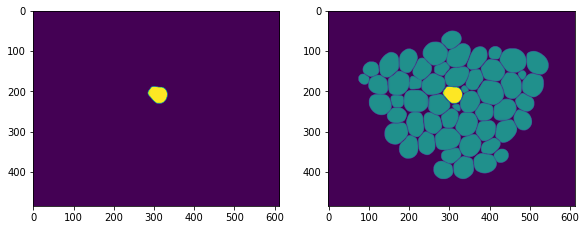

number of detections 14 u_sem 0.30685282 u_mask 0.95333594 u_box 0.95447636 u_det 0.09000003
0    7
2    7
dtype: int64
1560


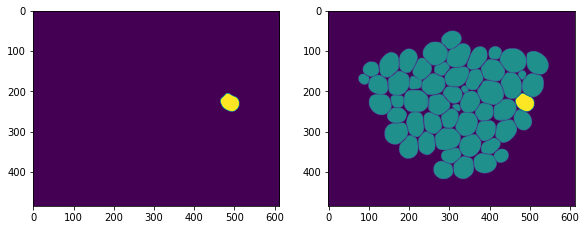

number of detections 24 u_sem 1.0 u_mask 0.94374526 u_box 0.9604475 u_det 0.04000002
0    24
dtype: int64
1599


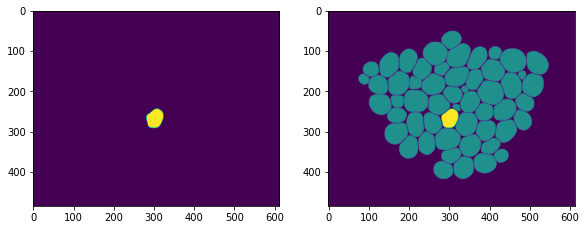

number of detections 25 u_sem 0.34658182 u_mask 0.93704075 u_box 0.9467619 u_det 0.0625
0    16
1     9
dtype: int64
2017


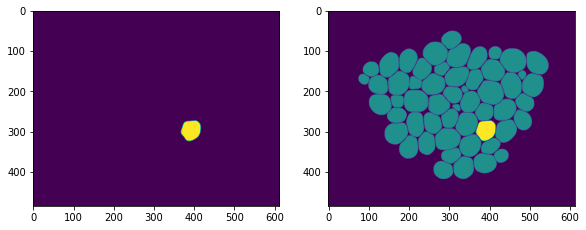

acdc_data3_Yagya_SCGE_WT_pos_1_243 0.19896553


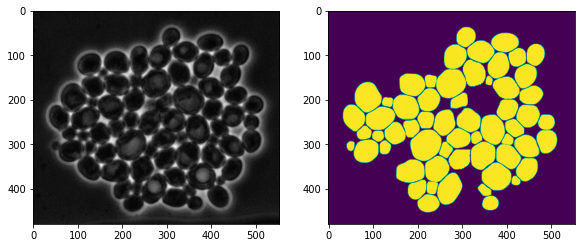

number of detections 39 u_sem 1.0 u_mask 0.9493571 u_box 0.97480756 u_det 0.9025001
2    39
dtype: int64
1327


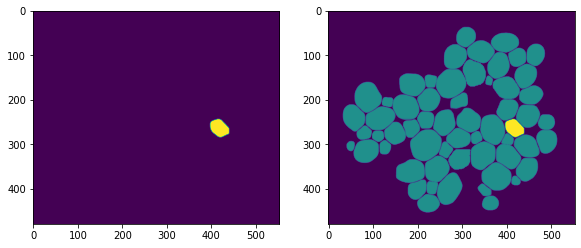

number of detections 37 u_sem 1.0 u_mask 0.9480333 u_box 0.9744188 u_det 0.7225
2    37
dtype: int64
1474


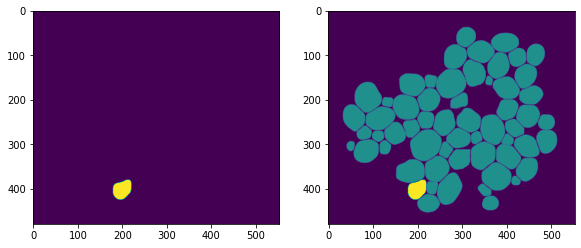

number of detections 33 u_sem 1.0 u_mask 0.9479976 u_box 0.9584802 u_det 0.42249995
1    33
dtype: int64
1903


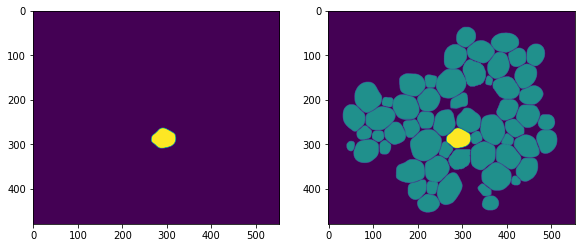

number of detections 39 u_sem 1.0 u_mask 0.94928163 u_box 0.9350728 u_det 0.9025001
1    39
dtype: int64
3035


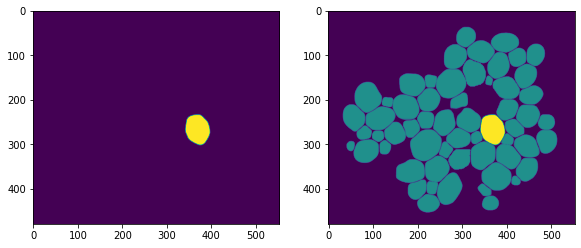

number of detections 30 u_sem 1.0 u_mask 0.95153767 u_box 0.97371864 u_det 0.25
2    30
dtype: int64
1615


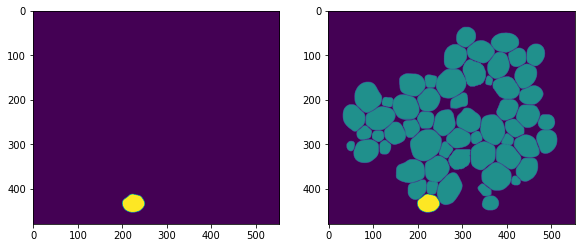

number of detections 36 u_sem 1.0 u_mask 0.9486207 u_box 0.93795896 u_det 0.6399999
1    36
dtype: int64
2311


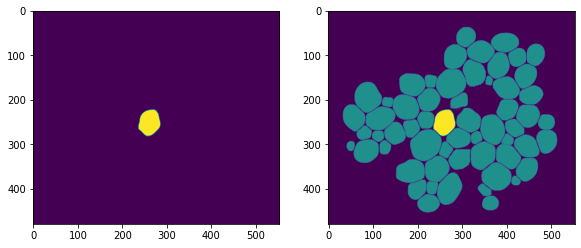

number of detections 33 u_sem 1.0 u_mask 0.9465507 u_box 0.95438945 u_det 0.42249995
1    33
dtype: int64
2114


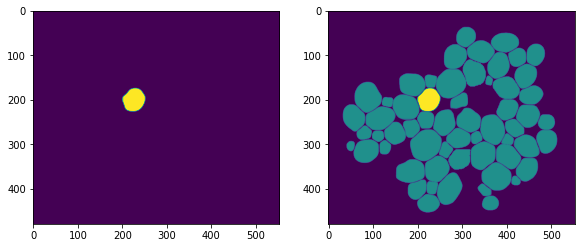

number of detections 39 u_sem 1.0 u_mask 0.9578593 u_box 0.975073 u_det 0.9025001
1    39
dtype: int64
2332


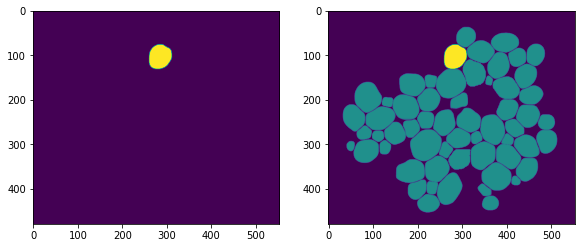

number of detections 32 u_sem 1.0 u_mask 0.9573828 u_box 0.97420233 u_det 0.36
1    32
dtype: int64
2500


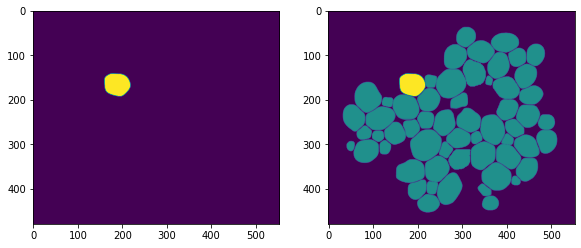

number of detections 36 u_sem 1.0 u_mask 0.9350063 u_box 0.9285609 u_det 0.6399999
1    36
dtype: int64
2088


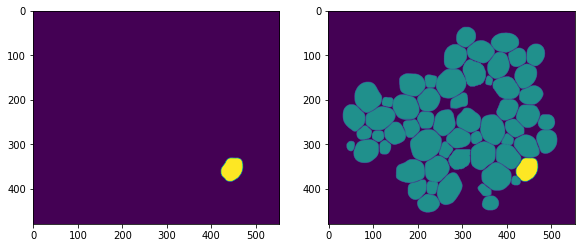

number of detections 27 u_sem 1.0 u_mask 0.9148106 u_box 0.9447276 u_det 0.1225
2    27
dtype: int64
291


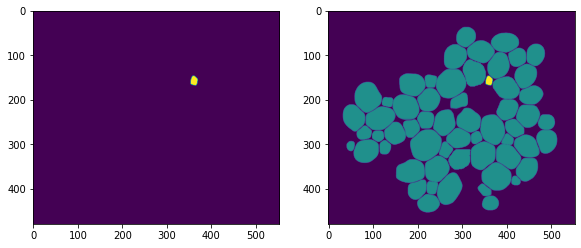

number of detections 34 u_sem 1.0 u_mask 0.95182246 u_box 0.97282434 u_det 0.49000007
1    34
dtype: int64
2008


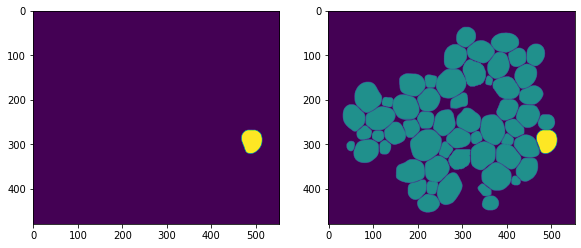

number of detections 29 u_sem 1.0 u_mask 0.9527934 u_box 0.9752034 u_det 0.20250005
1    29
dtype: int64
2299


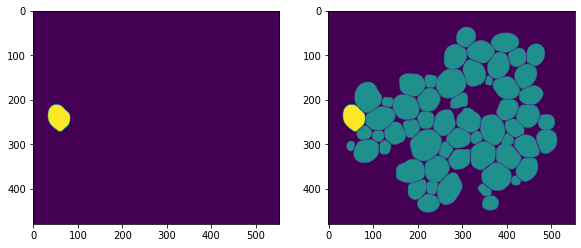

number of detections 38 u_sem 1.0 u_mask 0.95617414 u_box 0.97933006 u_det 0.80999994
2    38
dtype: int64
1012


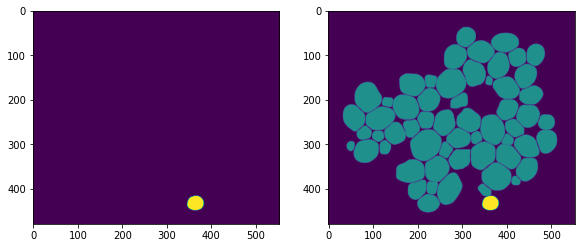

number of detections 19 u_sem 1.0 u_mask 0.9499061 u_box 0.9694441 u_det 0.0025000572
0    19
dtype: int64
1812


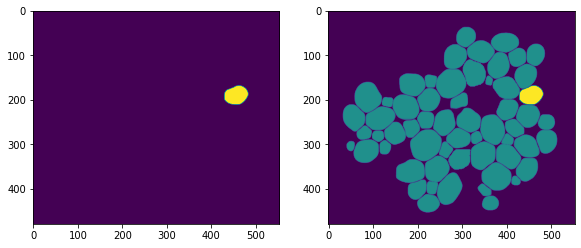

number of detections 32 u_sem 1.0 u_mask 0.9530161 u_box 0.97233355 u_det 0.36
1    32
dtype: int64
3229


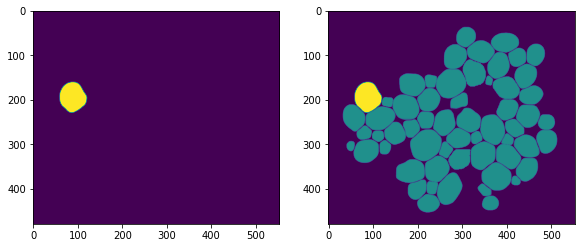

number of detections 26 u_sem 1.0 u_mask 0.9533775 u_box 0.98154664 u_det 0.089999974
2    26
dtype: int64
1366


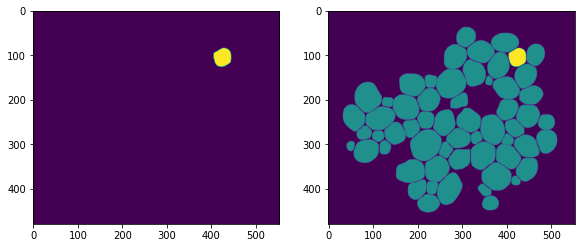

number of detections 14 u_sem 1.0 u_mask 0.95370245 u_box 0.97331756 u_det 0.09000003
0    14
dtype: int64
2368


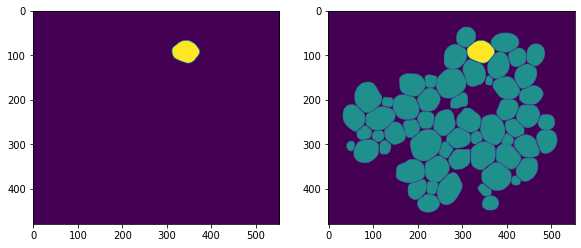

number of detections 6 u_sem 1.0 u_mask 0.9565996 u_box 0.9746614 u_det 0.48999995
0    6
dtype: int64
2171


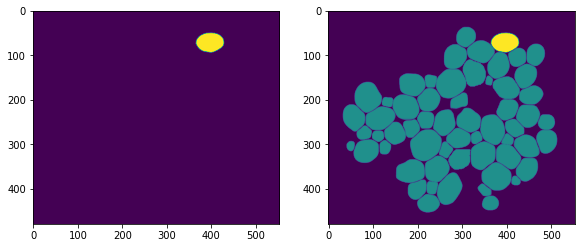

number of detections 17 u_sem 1.0 u_mask 0.95532984 u_box 0.9704342 u_det 0.022499979
0    17
dtype: int64
1838


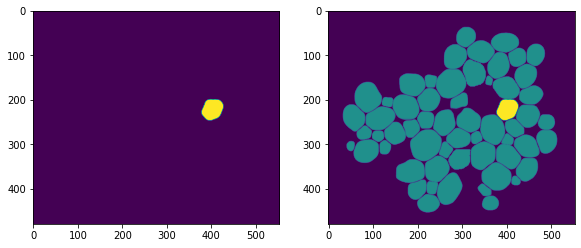

number of detections 1 u_sem 1.0 u_mask 1.0 u_box 1.0 u_det 0.9025
1    1
dtype: int64
1786


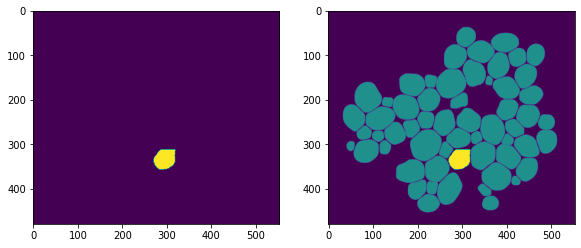

number of detections 2 u_sem 1.0 u_mask 0.9769063 u_box 0.9792196 u_det 0.81
1    2
dtype: int64
2295


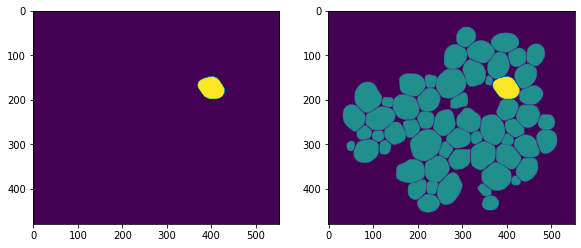

number of detections 1 u_sem 1.0 u_mask 1.0 u_box 1.0 u_det 0.9025
1    1
dtype: int64
2324


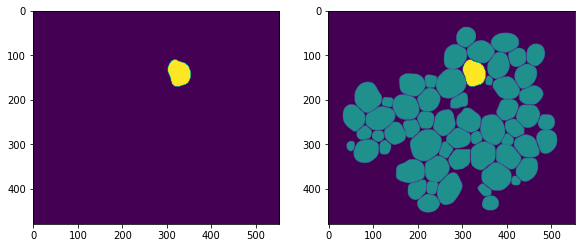

acdc_data3_Yagya_SCGE_WT_pos_2_183 0.21061538


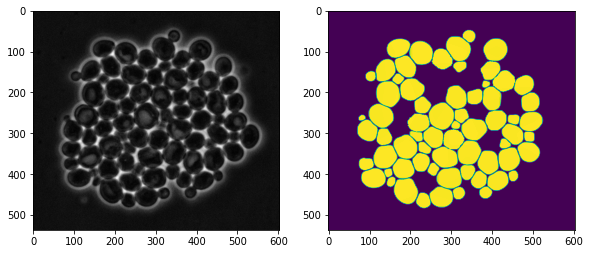

number of detections 39 u_sem 1.0 u_mask 0.94696957 u_box 0.9741434 u_det 0.9025001
2    39
dtype: int64
1080


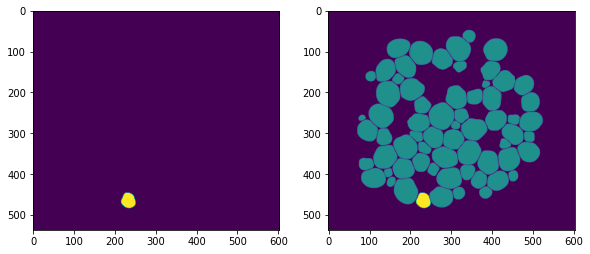

number of detections 32 u_sem 1.0 u_mask 0.95213276 u_box 0.9635389 u_det 0.36
0    32
dtype: int64
2181


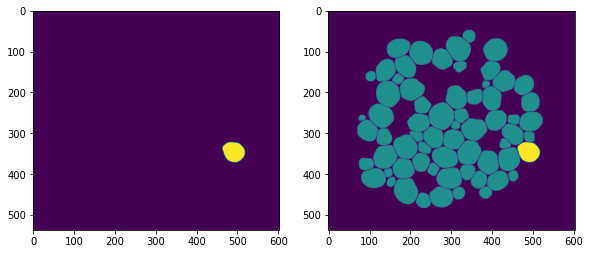

number of detections 14 u_sem 1.0 u_mask 0.94853884 u_box 0.9570142 u_det 0.09000003
0    14
dtype: int64
2130


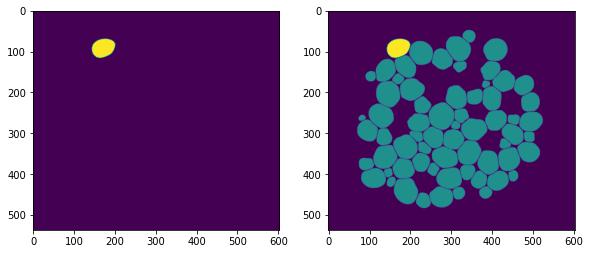

number of detections 39 u_sem 1.0 u_mask 0.93300277 u_box 0.93280774 u_det 0.9025001
1    39
dtype: int64
2674


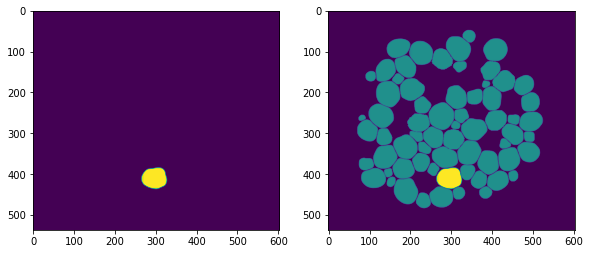

number of detections 32 u_sem 1.0 u_mask 0.9507551 u_box 0.9752662 u_det 0.36
2    32
dtype: int64
1317


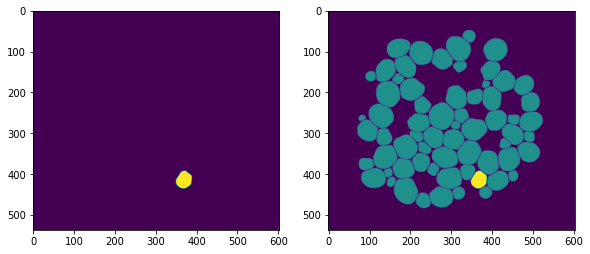

number of detections 35 u_sem 1.0 u_mask 0.9397521 u_box 0.9489421 u_det 0.5625
0    35
dtype: int64
2750


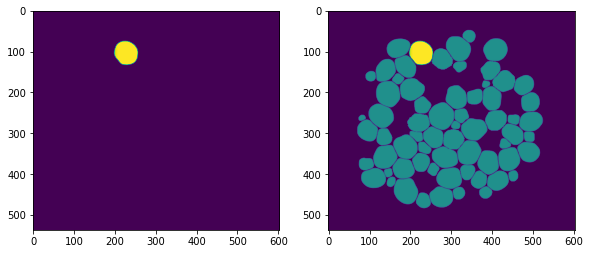

number of detections 39 u_sem 1.0 u_mask 0.9451125 u_box 0.9569716 u_det 0.9025001
1    39
dtype: int64
2170


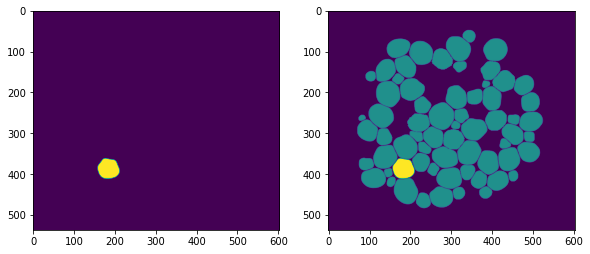

number of detections 22 u_sem 1.0 u_mask 0.95497143 u_box 0.97488827 u_det 0.00999999
2    22
dtype: int64
1329


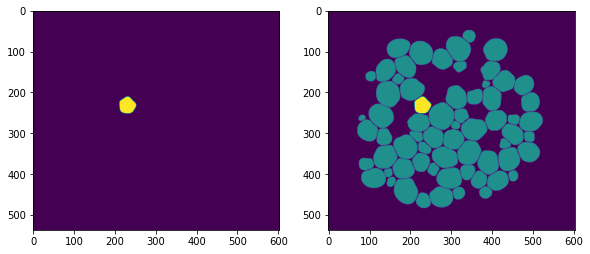

number of detections 25 u_sem 1.0 u_mask 0.8944591 u_box 0.93756866 u_det 0.0625
2    25
dtype: int64
379


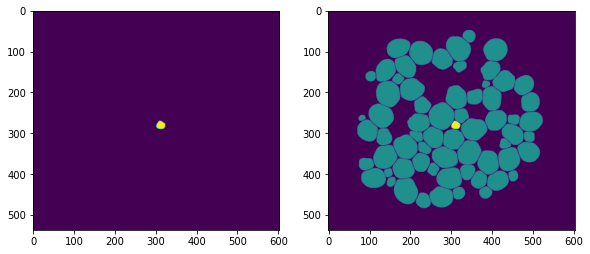

number of detections 36 u_sem 1.0 u_mask 0.9251997 u_box 0.94162816 u_det 0.6399999
2    36
dtype: int64
204


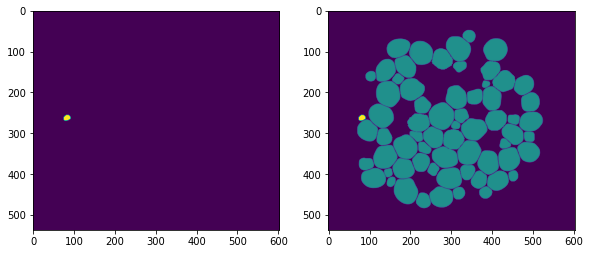

number of detections 39 u_sem 1.0 u_mask 0.9435582 u_box 0.9434198 u_det 0.9025001
1    39
dtype: int64
2275


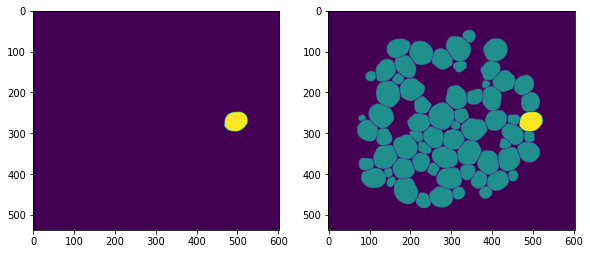

number of detections 27 u_sem 1.0 u_mask 0.95000345 u_box 0.96186405 u_det 0.1225
1    27
dtype: int64
2038


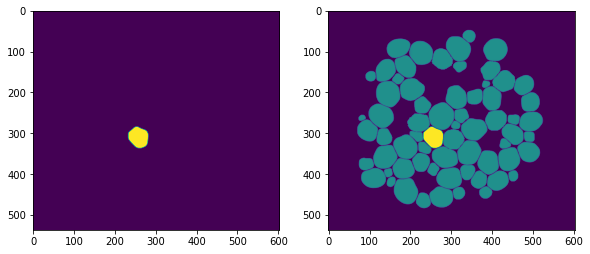

number of detections 34 u_sem 1.0 u_mask 0.95166075 u_box 0.97136575 u_det 0.49000007
1    34
dtype: int64
2670


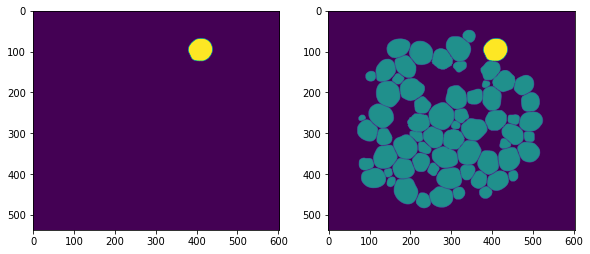

number of detections 25 u_sem 1.0 u_mask 0.9564676 u_box 0.9796341 u_det 0.0625
2    25
dtype: int64
1242


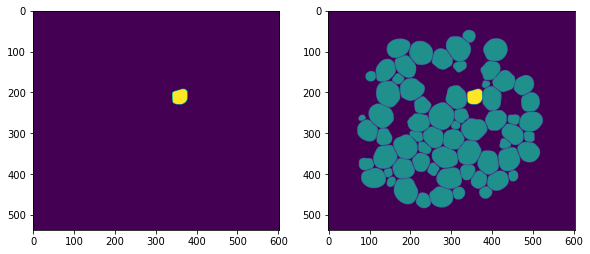

number of detections 14 u_sem 1.0 u_mask 0.9022324 u_box 0.94981545 u_det 0.09000003
2    14
dtype: int64
277


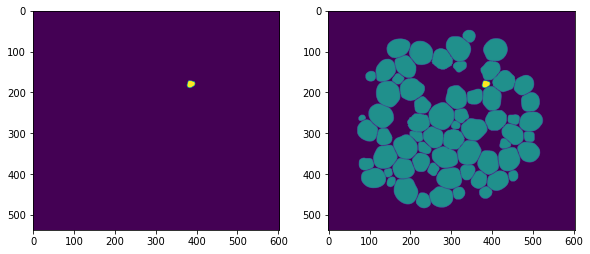

number of detections 13 u_sem 1.0 u_mask 0.9493735 u_box 0.9655794 u_det 0.1225
1    13
dtype: int64
2389


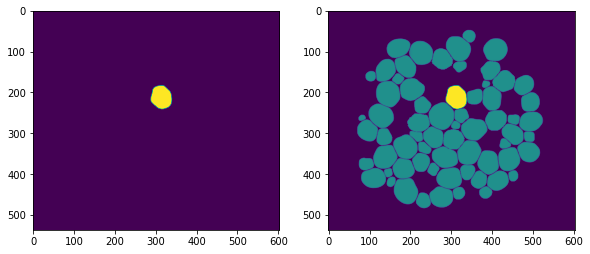

number of detections 15 u_sem 1.0 u_mask 0.9546939 u_box 0.9844981 u_det 0.0625
0    15
dtype: int64
1568


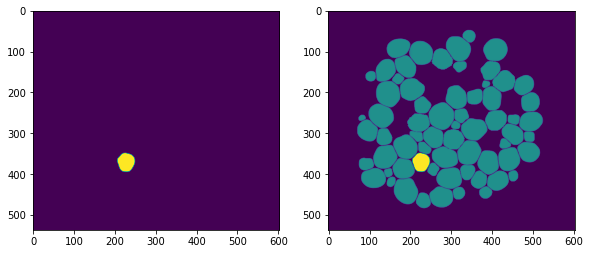

number of detections 11 u_sem 1.0 u_mask 0.9374954 u_box 0.9471258 u_det 0.20249999
1    11
dtype: int64
2252


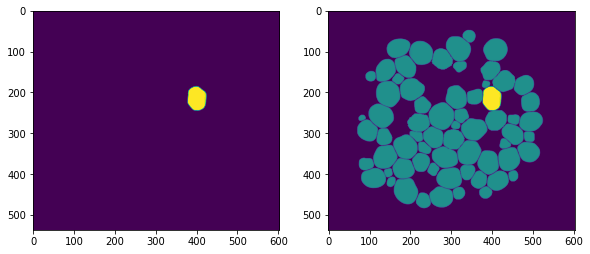

number of detections 8 u_sem 1.0 u_mask 0.9595244 u_box 0.95155776 u_det 0.35999995
0    8
dtype: int64
2134


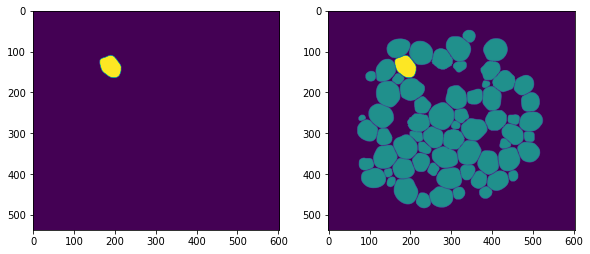

number of detections 7 u_sem 1.0 u_mask 0.95540524 u_box 0.9629002 u_det 0.4225
0    7
dtype: int64
1750


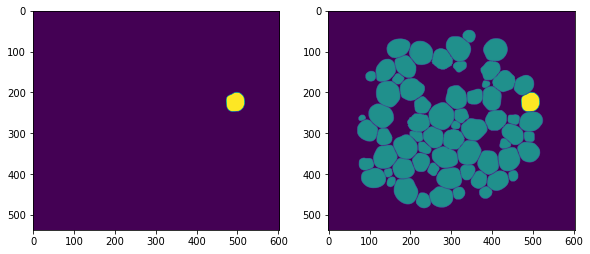

number of detections 1 u_sem 1.0 u_mask 1.0 u_box 1.0 u_det 0.9025
0    1
dtype: int64
1914


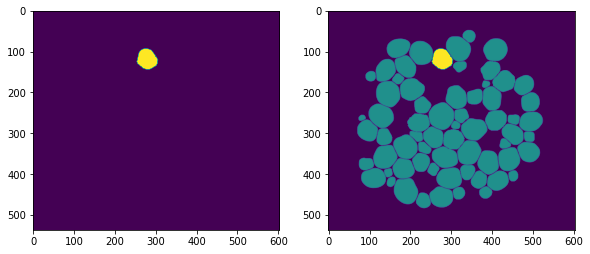

number of detections 3 u_sem 1.0 u_mask 0.9693126 u_box 0.9725053 u_det 0.72249997
0    3
dtype: int64
2549


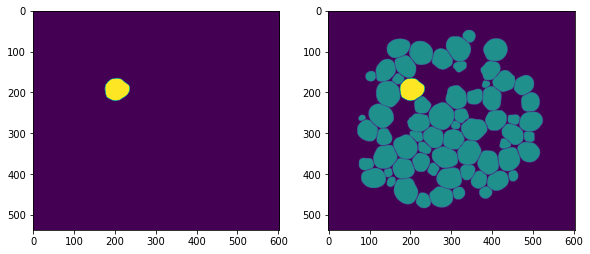

number of detections 1 u_sem 1.0 u_mask 1.0 u_box 1.0 u_det 0.9025
0    1
dtype: int64
1982


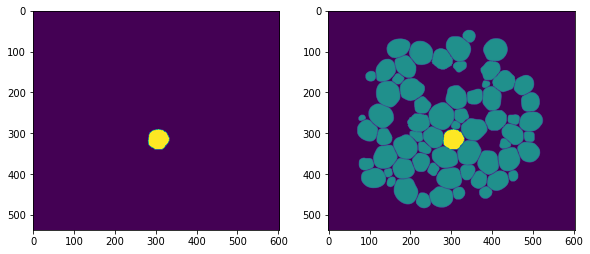

number of detections 3 u_sem 1.0 u_mask 0.95721924 u_box 0.95387363 u_det 0.72249997
0    3
dtype: int64
1683


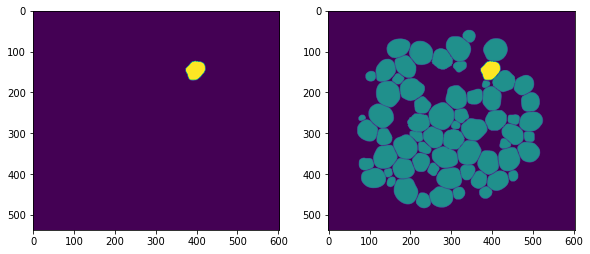

number of detections 3 u_sem 1.0 u_mask 0.96973693 u_box 0.9805209 u_det 0.72249997
2    3
dtype: int64
1263


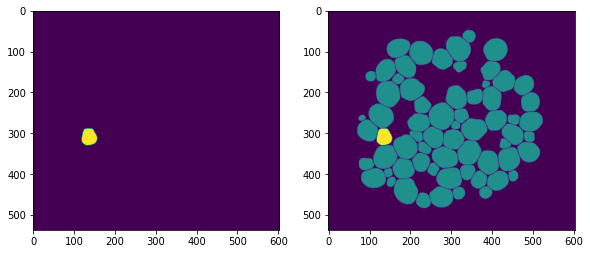

number of detections 1 u_sem 1.0 u_mask 1.0 u_box 1.0 u_det 0.9025
1    1
dtype: int64
2099


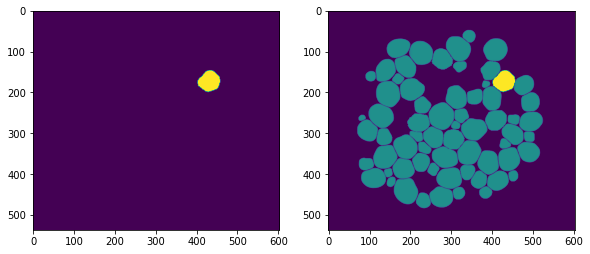

number of detections 1 u_sem 1.0 u_mask 1.0 u_box 1.0 u_det 0.9025
1    1
dtype: int64
1892


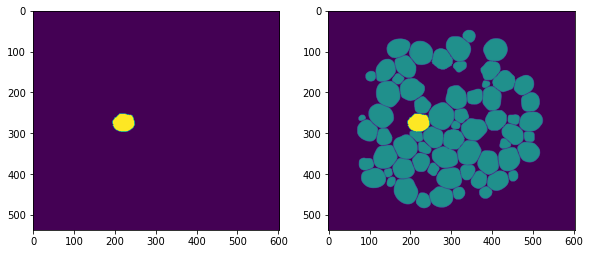

number of detections 1 u_sem 1.0 u_mask 1.0 u_box 1.0 u_det 0.9025
0    1
dtype: int64
2052


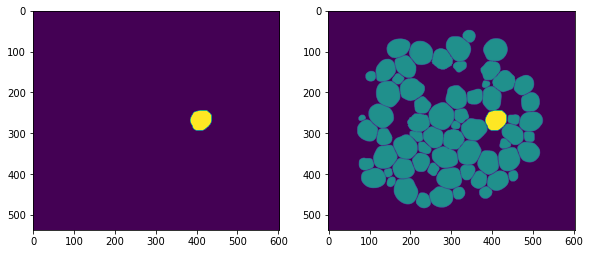

acdc_data2_kurt_306-3_20_20201105_pos_3_183 0.27666667


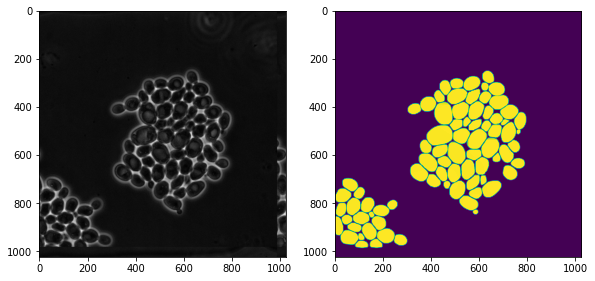

number of detections 33 u_sem 1.0 u_mask 0.9482634 u_box 0.9678637 u_det 0.42249995
1    33
dtype: int64
3400


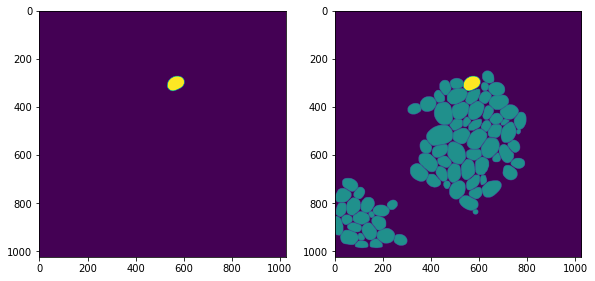

number of detections 26 u_sem 1.0 u_mask 0.9523655 u_box 0.9738516 u_det 0.089999974
1    26
dtype: int64
3723


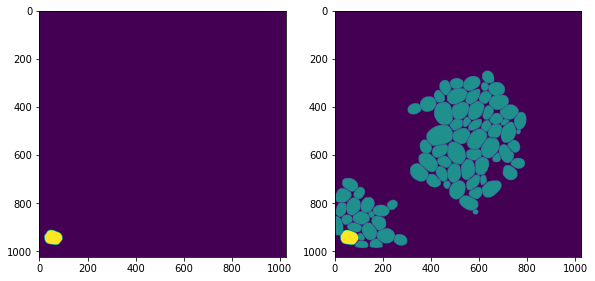

number of detections 36 u_sem 1.0 u_mask 0.947219 u_box 0.9502076 u_det 0.6399999
1    36
dtype: int64
4256


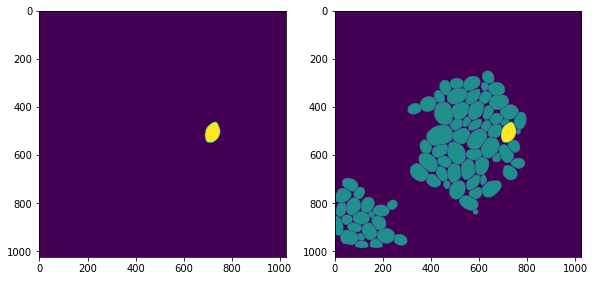

number of detections 37 u_sem 1.0 u_mask 0.9516446 u_box 0.9726447 u_det 0.7225
0    37
dtype: int64
2951


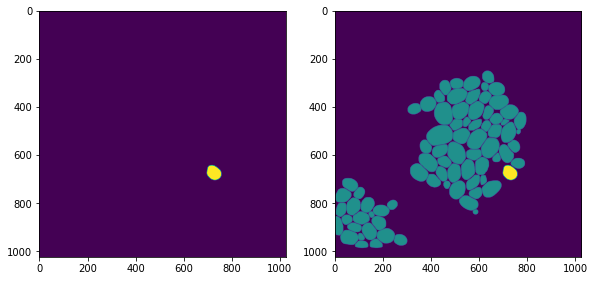

number of detections 11 u_sem 1.0 u_mask 0.9435696 u_box 0.95705676 u_det 0.20249999
2    11
dtype: int64
1809


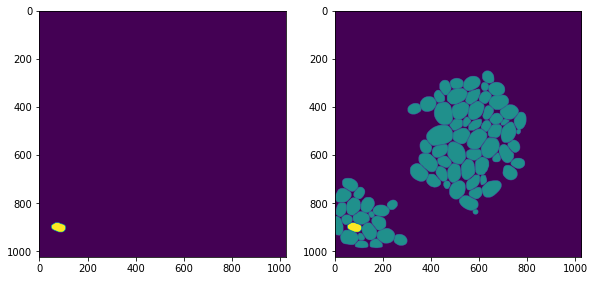

number of detections 39 u_sem 1.0 u_mask 0.9456272 u_box 0.95938736 u_det 0.9025001
0    39
dtype: int64
2876


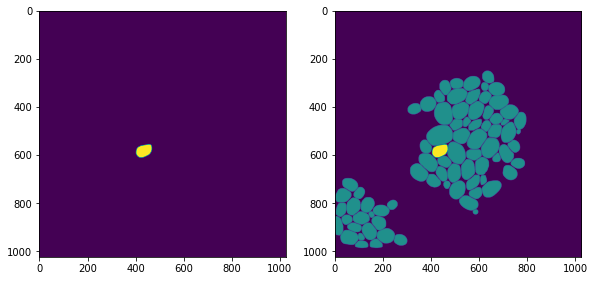

number of detections 11 u_sem 1.0 u_mask 0.945865 u_box 0.9637827 u_det 0.20249999
2    11
dtype: int64
1937


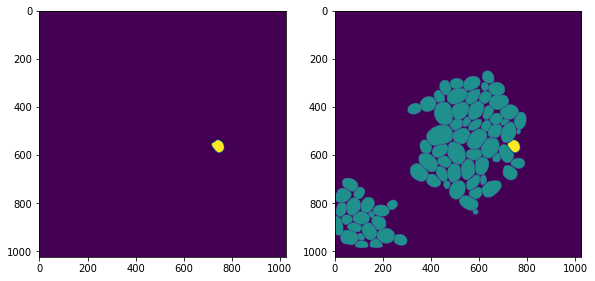

number of detections 20 u_sem 1.0 u_mask 0.9463077 u_box 0.96818984 u_det 0.0
2    20
dtype: int64
1495


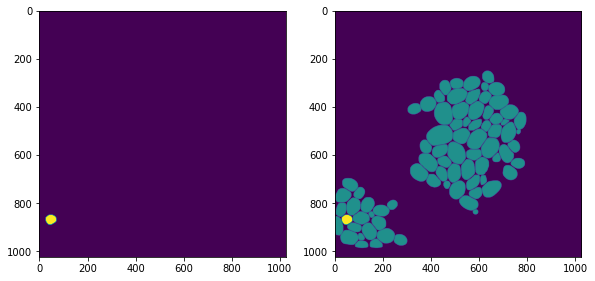

number of detections 26 u_sem 0.8369764 u_mask 0.9490075 u_box 0.9602668 u_det 0.089999974
2    25
0     1
dtype: int64
1996


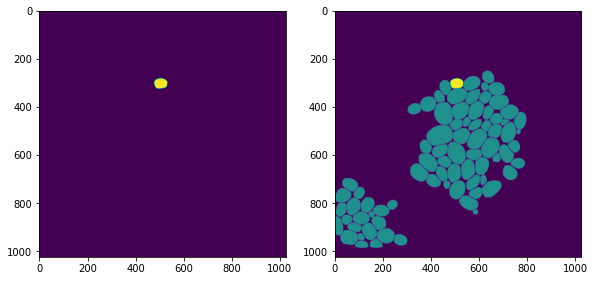

number of detections 14 u_sem 1.0 u_mask 0.85494196 u_box 0.9179154 u_det 0.09000003
2    14
dtype: int64
306


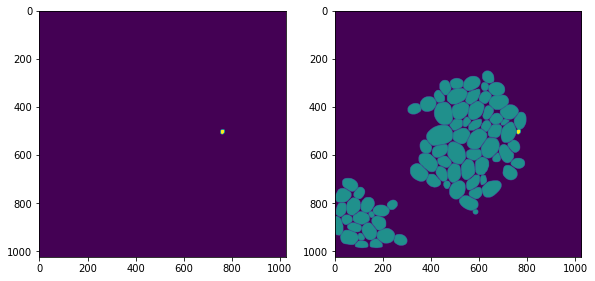

number of detections 35 u_sem 1.0 u_mask 0.90518904 u_box 0.9369674 u_det 0.5625
2    35
dtype: int64
948


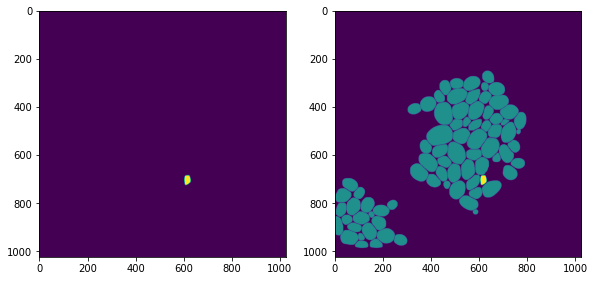

number of detections 39 u_sem 1.0 u_mask 0.94571453 u_box 0.9698189 u_det 0.9025001
2    39
dtype: int64
2140


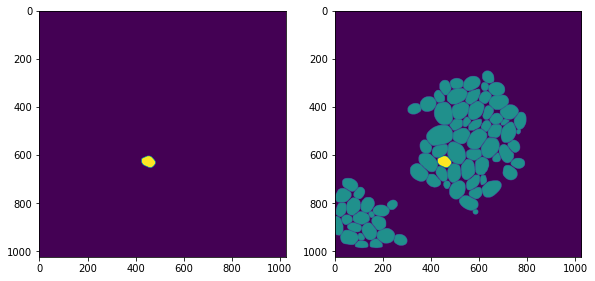

number of detections 12 u_sem 1.0 u_mask 0.9370561 u_box 0.95111233 u_det 0.15999997
2    12
dtype: int64
1940


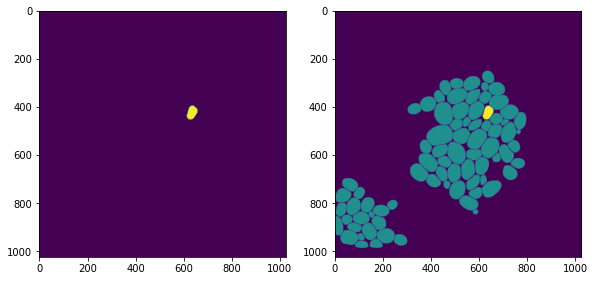

number of detections 19 u_sem 1.0 u_mask 0.95117825 u_box 0.9770811 u_det 0.0025000572
1    19
dtype: int64
3634


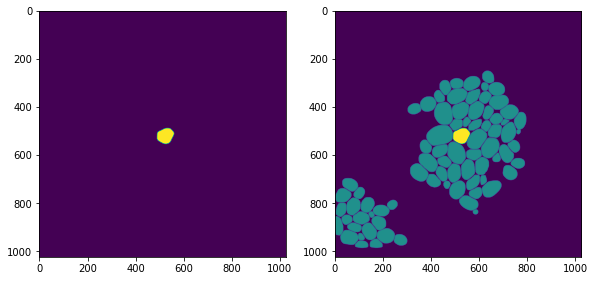

number of detections 35 u_sem 1.0 u_mask 0.89057636 u_box 0.9252984 u_det 0.5625
2    35
dtype: int64
683


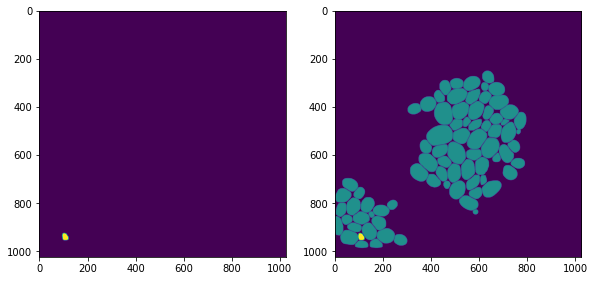

number of detections 35 u_sem 1.0 u_mask 0.95078033 u_box 0.97304493 u_det 0.5625
1    35
dtype: int64
4121


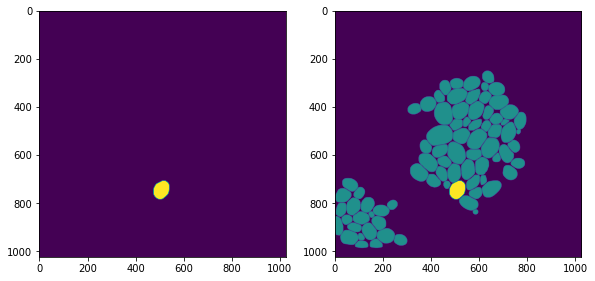

number of detections 27 u_sem 1.0 u_mask 0.9332491 u_box 0.9433261 u_det 0.1225
2    27
dtype: int64
2032


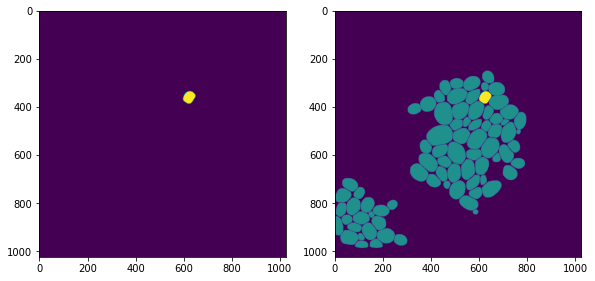

number of detections 21 u_sem 1.0 u_mask 0.95057887 u_box 0.96471417 u_det 0.0024999976
0    21
dtype: int64
3595


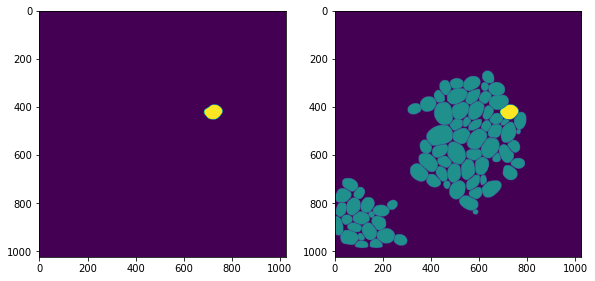

number of detections 12 u_sem 0.54943883 u_mask 0.93814856 u_box 0.95493597 u_det 0.15999997
2    10
1     2
dtype: int64
2784


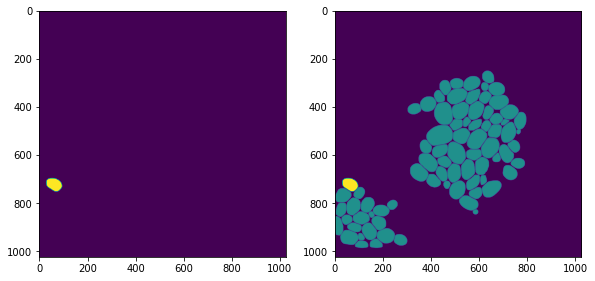

number of detections 1 u_sem 1.0 u_mask 1.0 u_box 1.0 u_det 0.9025
0    1
dtype: int64
3282


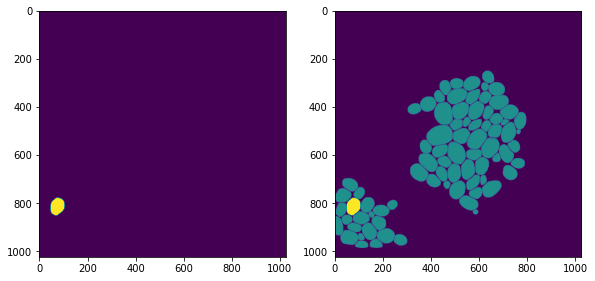

number of detections 26 u_sem 1.0 u_mask 0.9486441 u_box 0.9644485 u_det 0.089999974
1    26
dtype: int64
3151


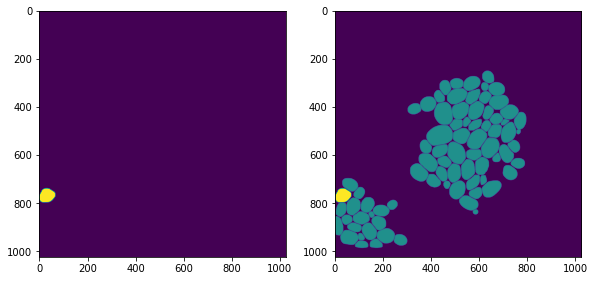

number of detections 18 u_sem 1.0 u_mask 0.9425711 u_box 0.95985246 u_det 0.00999999
2    18
dtype: int64
2099


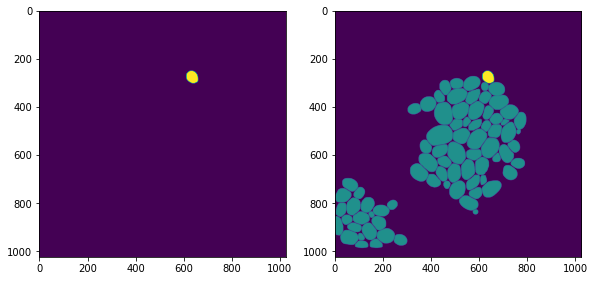

number of detections 9 u_sem 1.0 u_mask 0.95044476 u_box 0.96248233 u_det 0.30250007
0    9
dtype: int64
2290


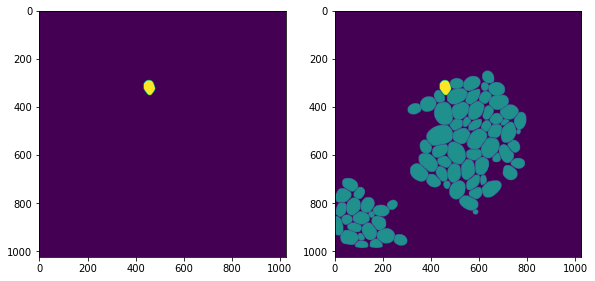

number of detections 28 u_sem 1.0 u_mask 0.94610846 u_box 0.96320534 u_det 0.15999997
1    28
dtype: int64
2797


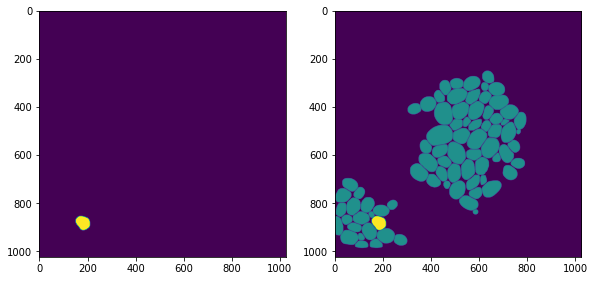

number of detections 21 u_sem 1.0 u_mask 0.9271626 u_box 0.94467175 u_det 0.0024999976
0    21
dtype: int64
2638


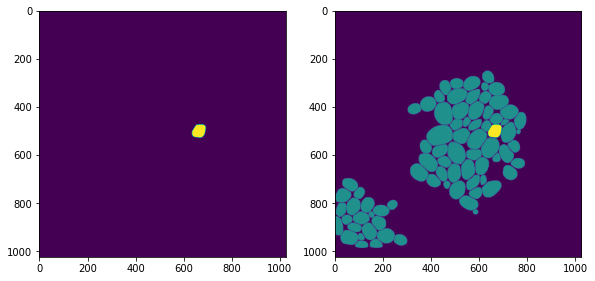

number of detections 2 u_sem 0.30685282 u_mask 0.96744573 u_box 0.96453595 u_det 0.81
2    1
0    1
dtype: int64
2396


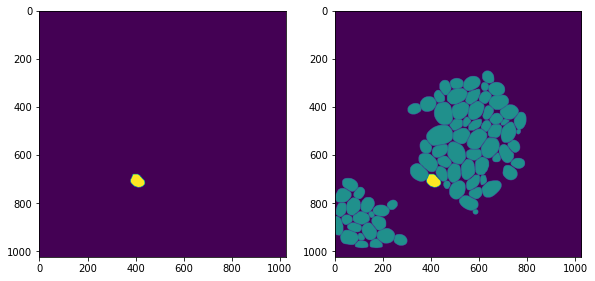

number of detections 8 u_sem 1.0 u_mask 0.95663136 u_box 0.9506922 u_det 0.35999995
2    8
dtype: int64
1983


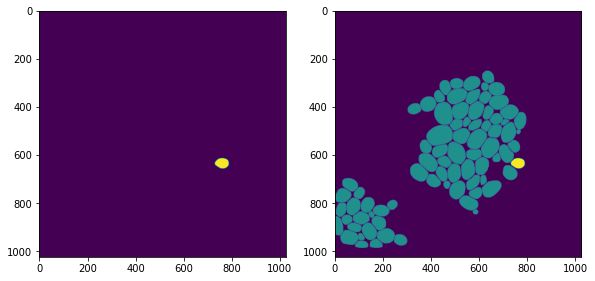

number of detections 3 u_sem 1.0 u_mask 0.96799016 u_box 0.9835326 u_det 0.72249997
1    3
dtype: int64
3971


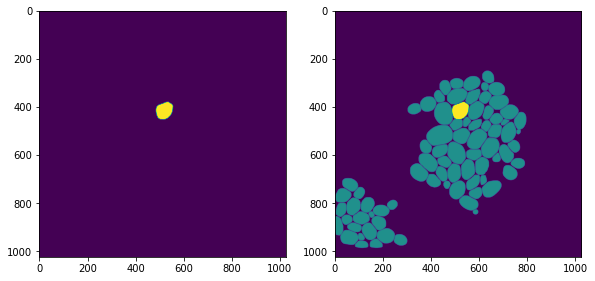

number of detections 4 u_sem 1.0 u_mask 0.95955026 u_box 0.97818905 u_det 0.64
1    4
dtype: int64
3869


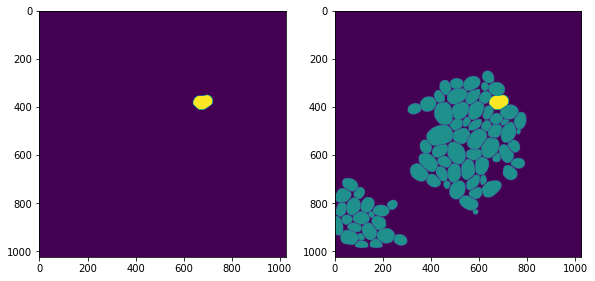

number of detections 4 u_sem 1.0 u_mask 0.94584554 u_box 0.9514648 u_det 0.64
0    4
dtype: int64
4441


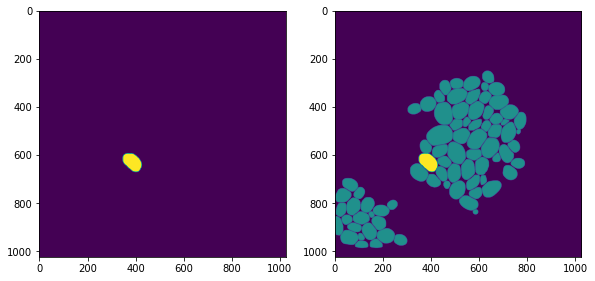

number of detections 3 u_sem 1.0 u_mask 0.95459664 u_box 0.96116394 u_det 0.72249997
2    3
dtype: int64
2271


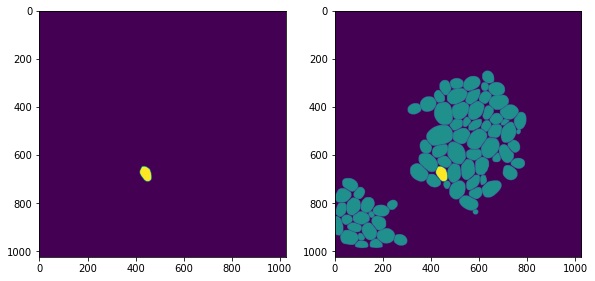

number of detections 4 u_sem 1.0 u_mask 0.9538599 u_box 0.97306216 u_det 0.64
0    4
dtype: int64
3912


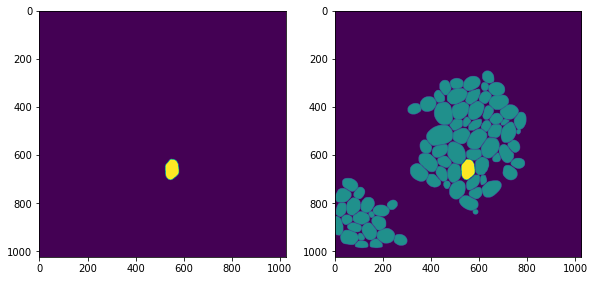

number of detections 2 u_sem 0.30685282 u_mask 0.9742073 u_box 0.9825016 u_det 0.81
0    1
1    1
dtype: int64
4226


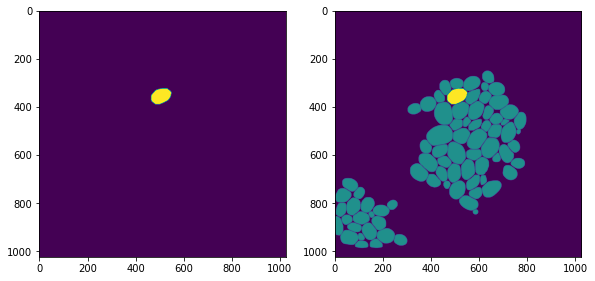

number of detections 1 u_sem 1.0 u_mask 1.0 u_box 1.0 u_det 0.9025
0    1
dtype: int64
3336


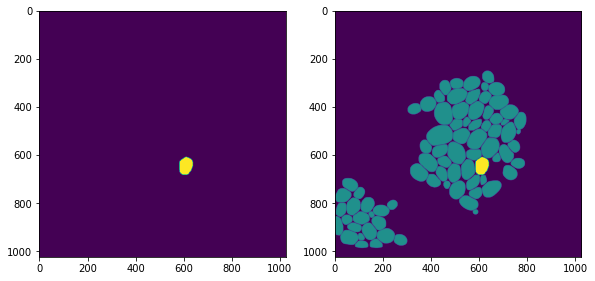

number of detections 2 u_sem 1.0 u_mask 0.9737873 u_box 0.9869959 u_det 0.81
1    2
dtype: int64
3319


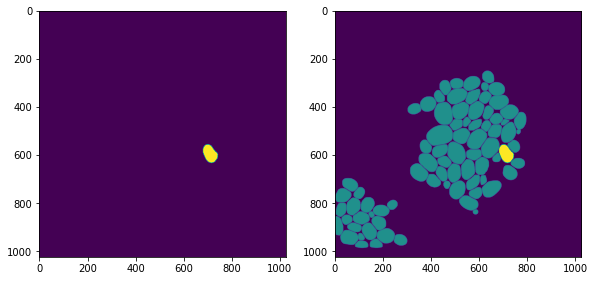

number of detections 1 u_sem 1.0 u_mask 1.0 u_box 1.0 u_det 0.9025
2    1
dtype: int64
561


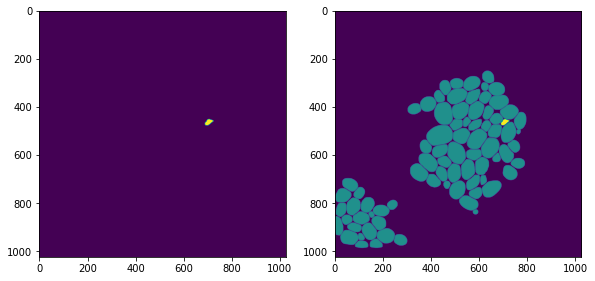

number of detections 2 u_sem 1.0 u_mask 0.971539 u_box 0.974715 u_det 0.81
1    2
dtype: int64
2846


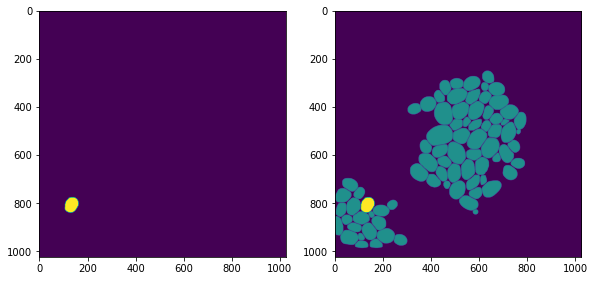

number of detections 3 u_sem 1.0 u_mask 0.9356702 u_box 0.9380901 u_det 0.72249997
0    3
dtype: int64
2501


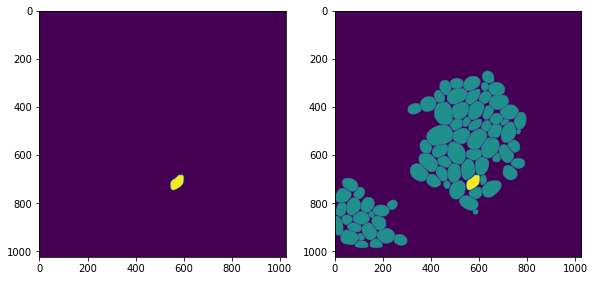

number of detections 2 u_sem 1.0 u_mask 0.9621507 u_box 0.9649787 u_det 0.81
1    2
dtype: int64
2827


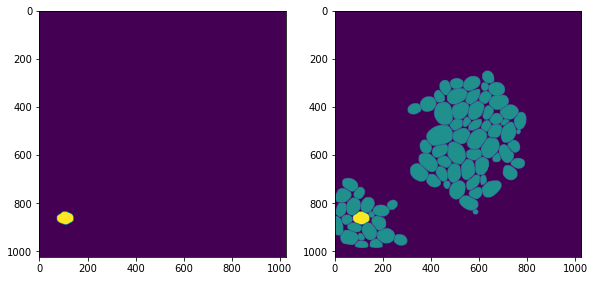

number of detections 1 u_sem 1.0 u_mask 1.0 u_box 1.0 u_det 0.9025
1    1
dtype: int64
1794


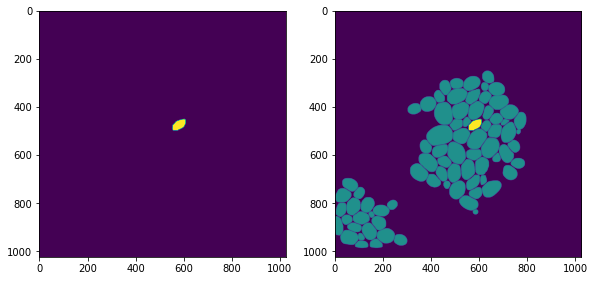

number of detections 4 u_sem 1.0 u_mask 0.9647391 u_box 0.9860467 u_det 0.64
0    4
dtype: int64
3545


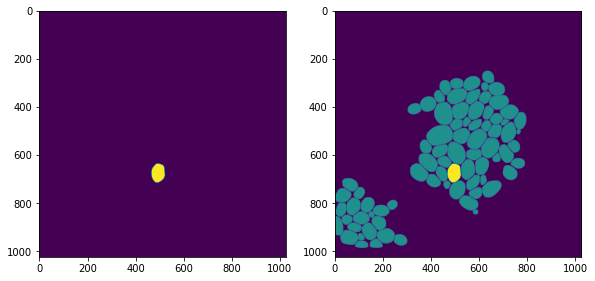

number of detections 1 u_sem 1.0 u_mask 1.0 u_box 1.0 u_det 0.9025
2    1
dtype: int64
1879


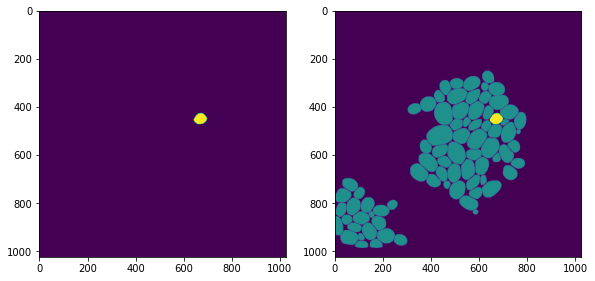

number of detections 1 u_sem 1.0 u_mask 1.0 u_box 1.0 u_det 0.9025
2    1
dtype: int64
2211


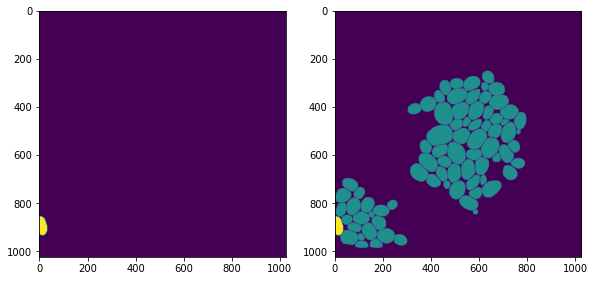

number of detections 1 u_sem 1.0 u_mask 1.0 u_box 1.0 u_det 0.9025
2    1
dtype: int64
2584


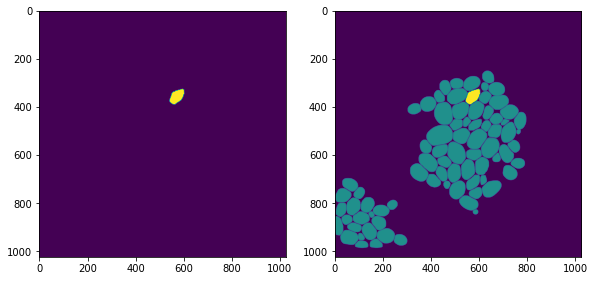

In [11]:
for id in mc_samples:
    im_json = get_json_by_id(id, train_data)
    show_uncertainties(im_json, mc_model35, mc_strategy)